In [1]:
%load_ext tensorboard

In [2]:
from keras.applications.resnet50 import ResNet50
from keras.applications.resnet import ResNet101
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19
import tensorflow_datasets as tfds
from keras.models import Model, Sequential
from keras.layers import Dense, GlobalAveragePooling2D, Conv2D, MaxPooling2D, Flatten, Rescaling
import tensorflow as tf

import numpy as np
import matplotlib.pyplot as plt 
import datetime
import pickle
import plotly.graph_objects as go
import plotly.express as px
from tabulate import tabulate
import copy
import pandas as pd

import keras

## Utilities
- `TimeCallback` - A Tensorflow callback created for measuring the time taken for the each epoch. This is used for analysing the time taken by the model to run.
- `TrackMemoryCallback` - A Tensorflow callback that tracks the amount of GPU memory that is used. 
- `ModelStats` - A custom class to make storing, saving and reading model statistics easier. 
- `get_small_model` - Returns a CNN model that is pre-trained and its weights are used for initializing the larger models.
- `get_large_model` - Returns a large CNN model that is used for testing for expansion.
- `get_large_model_2` - A larger CNN model returned for testing the expansion techniques.
- `compute_gradient_updates` and `gradient_custom_train` - Used for tracking the magnitudes of gradient updates.
- `expand_conv_weight` - A function that returns the expanded weights for convolutional layers using the provided reference weights and the expand type.
- `expand_linear_weight` - A function that returns the expanded linear weights for linear/dense layers using the provided reference weights and expand type.
- `expand_model_weights` - A function that takes in the indices of the layers to replace and based on the type of layer, invokes the `expand_conv_weight` or `expand_linear_weight`.
- `expand_model_weights_specific_layer` - A more specific version of the `expand_model_weights` where the layer indices of the reference model and the expansion model can be provided separately. This is useful for models which are not the same in length, with the larger model having more layers. 

In [3]:
class TimeCallback(tf.keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.epoch_no = []
        self.time_taken = []
        self.ref_time = tf.timestamp()

    def on_epoch_end(self, epoch, logs=None):
        self.epoch_no.append(epoch)
        self.time_taken.append((tf.timestamp()  - self.ref_time).numpy())

    def return_save_files(self):
        return {
            "epoch":self.epoch_no,
            "time_taken":self.time_taken,
            "ref_time":self.ref_time
        }

In [4]:
class TrackMemoryCallback(tf.keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.peak_mem = []
        self.used_mem = []
        self.epoch_no = []
        self.batch = []

    def on_train_batch_begin(self, batch, logs=None):
        memory = tf.config.experimental.get_memory_info("/device:GPU:0")
        self.peak_mem.append(memory['peak'])
        self.used_mem.append(memory['current'])
        self.epoch_no.append(self.epoch_no[-1])
        self.batch.append(batch)
    
    def on_epoch_begin(self, epoch, logs=None):
        memory = tf.config.experimental.get_memory_info("/device:GPU:0")
        self.peak_mem.append(memory['peak'])
        self.used_mem.append(memory['current'])
        self.epoch_no.append(epoch)

    def return_save_files(self):
        return {
            "peak":self.peak_mem,
            "used":self.used_mem,
            "epoch":self.epoch_no,
            "batch":self.batch
        }

In [5]:
class ModelStats():

    def __init__(self, name="model_stats", hist=None, timeCB=None, memCB=None):
        if hist is None:
            self.hist = None
            self.timeCB = None
            self.memCB = None
        else:
            self.hist = hist.history
            self.timeCB = timeCB.return_save_files()
            self.memCB = memCB.return_save_files()
        self.name = name
    

    def save_stats(self):
        temp_var = [
            self.hist,
            self.timeCB,
            self.memCB
        ]
        with open("ModelStats/"+self.name+".pkl", 'wb') as file:  
        	pickle.dump(temp_var, file)

    def read_stats(self):
        with open("ModelStats/"+self.name+'.pkl', 'rb') as file:
        	temp_var = pickle.load(file)
        self.hist = temp_var[0]
        self.timeCB = temp_var[1]
        self.memCB = temp_var[2]

In [6]:
def signaltonoise_dB(signal,noise, axis=0, ddof=0):
    signal = np.asanyarray(signal)
    signal = signal.flatten()

    noise = np.asanyarray(noise)
    noise = noise.flatten()
    
    
    Ps = np.mean(signal)
    Pn = np.mean(noise)
    SNRdB = 10*np.log10(Ps/Pn)
    return SNRdB

In [7]:
def get_large_model():
    model = Sequential()
    model.add(Rescaling(1./255, input_shape=(32,32,3)))
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(10))
    return model

In [8]:
def get_large_model_2():
    model = Sequential()
    model.add(Rescaling(1./255, input_shape=(32,32,3)))
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(10))
    return model

In [9]:
def get_small_model():
    model = Sequential()
    model.add(Rescaling(1./255, input_shape=(32,32,3)))
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(10))
    return model

In [10]:
def compute_gradient_updates(grads):
    mean_grad = tf.zeros(())
    for grad in grads:
        mean_grad += tf.reduce_mean(tf.abs(grad))
    mean_grad /= len(grads)
    return mean_grad

def gradient_custom_train(model_inp, optimizer, loss_fn, epochs):
    global batch_size, train_ds

    track_grads = []
    mean_grad = []
    
    for epoch in range(epochs):
        epoch_grad = []
        print("Epoch %d" % (epoch,))
    
        for step, (x_batch_train, y_batch_train) in enumerate(train_ds):
            with tf.GradientTape() as tape:
                logits = model_inp(x_batch_train, training=True)  # Logits for this minibatch
    
                loss_value = loss_fn(y_batch_train, logits)
    
            grads = tape.gradient(loss_value, model_inp.trainable_weights)
            epoch_grad.append(compute_gradient_updates(grads))
            optimizer.apply_gradients(zip(grads, model_inp.trainable_weights))
        track_grads.append(epoch_grad)
        mean_grad.append(np.mean(epoch_grad))
    return np.array(track_grads), np.array(mean_grad)

In [11]:
def expand_conv_weight(input_shape, target_shape, ref_weights, expand_type="symmetric", scaled_noise = False):
    # input_shape - ((Weight Shape), (Bias Shape))
    type_expand = ["symmetric","noisy_symmetric","diagonal","noisy_diagonal","envelope","noisy_envelope"]
    assert expand_type in type_expand, "Unknown expansion type"

    
    ref_input_shapes = (input_shape[0][2], input_shape[0][3])
    r_expand = target_shape[0][2] // input_shape[0][2]
    c_expand = target_shape[0][3] // input_shape[0][3]

    temp_weight = np.zeros(target_shape[0])
    temp_bias = np.zeros(target_shape[1])

    if r_expand == c_expand and r_expand == 1:
        temp_weight = ref_weights[0]
        temp_bias = ref_weights[1]
        return temp_weight, temp_bias

    
    if expand_type == "symmetric" or expand_type == "noisy_symmetric":
        
        for i in range(r_expand):
            if scaled_noise:
                noise = np.mean(ref_weights[0]) + np.std(ref_weights[0]) * np.random.standard_normal(ref_weights[0].shape)
            else:
                noise = np.random.random(ref_weights[0].shape)
            for j in range(c_expand):
                if expand_type=="noisy_symmetric":
                    temp_weight[:,:,i*ref_input_shapes[0]:(i+1)*ref_input_shapes[0],j*ref_input_shapes[1]:(j+1)*ref_input_shapes[1]] = (ref_weights[0] / 2) + ((-1)**j) * noise
                else:
                    temp_weight[:,:,i*ref_input_shapes[0]:(i+1)*ref_input_shapes[0],j*ref_input_shapes[1]:(j+1)*ref_input_shapes[1]] = ref_weights[0]
                    
        n_fold = target_shape[1][0] // input_shape[1][0]
        for i in range(n_fold):
            temp_bias[i*input_shape[1][0]:(i+1)*input_shape[1][0]] = ref_weights[1]
    elif expand_type=="noisy_diagonal" or expand_type=="diagonal":
        for i in range(r_expand):
            if scaled_noise:
                noise = np.mean(ref_weights[0]) + np.std(ref_weights[0]) * np.random.standard_normal(ref_weights[0].shape)
            else:
                noise = np.random.random(ref_weights[0].shape)
            for j in range(c_expand):
                if i == j:
                    temp_weight[:,:,i*ref_input_shapes[0]:(i+1)*ref_input_shapes[0],j*ref_input_shapes[1]:(j+1)*ref_input_shapes[1]] = ref_weights[0]
                if expand_type=="noisy_diagonal":
                    temp_weight[:,:,i*ref_input_shapes[0]:(i+1)*ref_input_shapes[0],j*ref_input_shapes[1]:(j+1)*ref_input_shapes[1]] += ((-1)**j) * noise
        
        n_fold = target_shape[1][0] // input_shape[1][0]
        for i in range(n_fold):
            temp_bias[i*input_shape[1][0]:(i+1)*input_shape[1][0]] = ref_weights[1]

    elif expand_type=="envelope" or expand_type=="noisy_envelope":
        if expand_type=="noisy_envelope":
            if scaled_noise:
                noise = np.mean(ref_weights[0]) + np.std(ref_weights[0]) * np.random.standard_normal(temp_weight.shape)
            else:
                noise = np.random.random(temp_weight.shape)

            temp_weight = noise
        
        
        start_idx_i = target_shape[0][2] // 2 - input_shape[0][2]//2
        end_idx_i = target_shape[0][2] // 2 + input_shape[0][2]//2
        
        start_idx_j = target_shape[0][3] // 2 - input_shape[0][3]//2
        end_idx_j = target_shape[0][3] // 2 + input_shape[0][3]//2

        temp_weight[:,:,start_idx_i:end_idx_i, start_idx_j:end_idx_j] = ref_weights[0]

        n_fold = target_shape[1][0] // input_shape[1][0]
        for i in range(n_fold):
            temp_bias[i*input_shape[1][0]:(i+1)*input_shape[1][0]] = ref_weights[1]
    return temp_weight, temp_bias

In [12]:
def expand_linear_weight(input_shape, target_shape, ref_weights, expand_type="symmetric", scaled_noise = False):
    # input_shape - ((Weight Shape), (Bias Shape))
    type_expand = ["symmetric","noisy_symmetric","diagonal","noisy_diagonal","envelope","noisy_envelope"]
    assert expand_type in type_expand, "Unknown expansion type"

    ref_input_shapes = (input_shape[0][0], input_shape[0][1])
    r_expand = target_shape[0][0] // input_shape[0][0]
    c_expand = target_shape[0][1] // input_shape[0][1]

    temp_weight = np.zeros(target_shape[0])
    temp_bias = np.zeros(target_shape[1])

    if r_expand == c_expand and r_expand == 1:
        temp_weight = ref_weights[0]
        temp_bias = ref_weights[1]
        return temp_weight, temp_bias

    
    if expand_type == "symmetric" or expand_type == "noisy_symmetric":
        
        for i in range(r_expand):
            if scaled_noise:
                noise = np.mean(ref_weights[0]) + np.std(ref_weights[0]) * np.random.standard_normal(ref_weights[0].shape)
            else:
                noise = np.random.random(ref_weights[0].shape)
            for j in range(c_expand):
                # print(temp_weight[i*ref_input_shapes[0]:(i+1)*ref_input_shapes[0],j*ref_input_shapes[1]:(j+1)*ref_input_shapes[1]].shape)
                # print(ref_weights[0].shape)
                if expand_type=="noisy_symmetric":
                    temp_weight[i*ref_input_shapes[0]:(i+1)*ref_input_shapes[0],j*ref_input_shapes[1]:(j+1)*ref_input_shapes[1]] = (ref_weights[0] / 2) + ((-1)**j) * noise
                else:
                    temp_weight[i*ref_input_shapes[0]:(i+1)*ref_input_shapes[0],j*ref_input_shapes[1]:(j+1)*ref_input_shapes[1]] = ref_weights[0]
                    
        n_fold = target_shape[1][0] // input_shape[1][0]
        for i in range(n_fold):
            temp_bias[i*input_shape[1][0]:(i+1)*input_shape[1][0]] = ref_weights[1]
    
    elif expand_type=="noisy_diagonal" or expand_type=="diagonal":
        for i in range(r_expand):
            if scaled_noise:
                noise = np.mean(ref_weights[0]) + np.std(ref_weights[0]) * np.random.standard_normal(ref_weights[0].shape)
            else:
                noise = np.random.random(ref_weights[0].shape)
            for j in range(c_expand):
                if i == j:
                    temp_weight[i*ref_input_shapes[0]:(i+1)*ref_input_shapes[0],j*ref_input_shapes[1]:(j+1)*ref_input_shapes[1]] = ref_weights[0]
                if expand_type=="noisy_diagonal":
                    temp_weight[i*ref_input_shapes[0]:(i+1)*ref_input_shapes[0],j*ref_input_shapes[1]:(j+1)*ref_input_shapes[1]] += ((-1)**j) * noise
        
        n_fold = target_shape[1][0] // input_shape[1][0]
        for i in range(n_fold):
            temp_bias[i*input_shape[1][0]:(i+1)*input_shape[1][0]] = ref_weights[1]

    elif expand_type=="envelope" or expand_type=="noisy_envelope":
        if expand_type=="noisy_envelope":
            if scaled_noise:
                noise = np.mean(ref_weights[0]) + np.std(ref_weights[0]) * np.random.standard_normal(temp_weight.shape)
            else:
                noise = np.random.random(temp_weight.shape)

            temp_weight = noise
        
        start_idx_i = target_shape[0][0] // 2 - input_shape[0][0]//2
        end_idx_i = target_shape[0][0] // 2 + input_shape[0][0]//2
        
        start_idx_j = target_shape[0][1] // 2 - input_shape[0][1]//2
        end_idx_j = target_shape[0][1] // 2 + input_shape[0][1]//2

        temp_weight[start_idx_i:end_idx_i, start_idx_j:end_idx_j] = ref_weights[0]

        n_fold = target_shape[1][0] // input_shape[1][0]
        for i in range(n_fold):
            temp_bias[i*input_shape[1][0]:(i+1)*input_shape[1][0]] = ref_weights[1]
    return temp_weight, temp_bias

In [13]:
def expand_model_weights(ref_model, expand_model, expand_layers, expand_type='symmetric', scaled_noise=False):
    for i in range(len(ref_model.layers)):
        if hasattr(ref_model.layers[i], "weights") and len(ref_model.layers[i].get_weights()) > 0:
            # print(hasattr(ref_model.layers[i], "weights"))
            input_weight = ref_model.layers[i].get_weights()
            output_weight = expand_model.layers[i].get_weights()
            if i in expand_layers:
                # print(i)
                # print(input_weight)
                # print(ref_model.layers[i])
                if "conv" in ref_model.layers[i].name:
                    expand_model.layers[i].set_weights(
                        expand_conv_weight(
                            (input_weight[0].shape, input_weight[1].shape),
                            (output_weight[0].shape, output_weight[1].shape),
                            input_weight,
                            expand_type,
                            scaled_noise
                        )
                    )
                else:
                    expand_model.layers[i].set_weights(
                        expand_linear_weight(
                            (input_weight[0].shape, input_weight[1].shape),
                            (output_weight[0].shape, output_weight[1].shape),
                            input_weight,
                            expand_type,
                            scaled_noise
                        )
                    )
            else:
                expand_model.layers[i].set_weights(
                    input_weight
                )
    return expand_model

In [14]:
def expand_model_weights_specific_layer(ref_model, expand_model, ref_layers, expand_layers, expansion_types, scaled_noise=False):
    for i in range(len(expand_layers)):
        input_weight = ref_model.layers[ref_layers[i]].get_weights()
        output_weight = expand_model.layers[expand_layers[i]].get_weights()
        if "conv" in ref_model.layers[ref_layers[i]].name:
            expand_model.layers[expand_layers[i]].set_weights(
                expand_conv_weight(
                    (input_weight[0].shape, input_weight[1].shape),
                    (output_weight[0].shape, output_weight[1].shape),
                    input_weight,
                    expansion_types[1],
                    scaled_noise
                )
            )
        else:
            expand_model.layers[ref_layers[i]].set_weights(
                expand_linear_weight(
                    (input_weight[0].shape, input_weight[1].shape),
                    (output_weight[0].shape, output_weight[1].shape),
                    input_weight,
                    expansion_types[1],
                    scaled_noise
                )
            )
    return expand_model

## Experiment - 2
## Scaling Smart
This experiment looks at weight expansion techniques as presented in the paper [Scaling Smart: Accelerating Large Language Model Pre-training with Small Model Initialization](https://arxiv.org/abs/2409.12903). The paper looks at techniques for expanding hidden weights of language models so that small pre-trained language models can be used for initializing the parameters of larger language models instead of random initialization. 

The paper describes four methods of weight expansion in the hidden layers

### Symmetric
In symmetric expansion, the expansion of the weight matrix is symmetric as shown below

$W_{s} -> Source weight $

$W_{symmetric} -> Expanded weight$

$W_{symmetric}  = \begin{bmatrix}
W_s / 2 & W_s / 2 \\
W_s / 2 & W_s / 2
\end{bmatrix}
$


 
### Noisy Symmetric

$W_{s} -> Source weight $

$W_{noisy symmetric} -> Expanded weight$

$\eta_1 -> Noise 1$

$\eta_2 -> Noise 2$

$W_{noisy symmetric}  = \begin{bmatrix}
W_s / 2 + \eta_1 & W_s / 2 - \eta_1 \\
W_s / 2 + \eta_2 & W_s / 2 - \eta_2
\end{bmatrix}
$




### Diagonal
$W_{s} -> Source weight $

$W_{diagonal} -> Expanded weight$

$\eta_1 -> Noise 1$

$\eta_2 -> Noise 2$

$W_{diagonal}  = \begin{bmatrix}
W_s & 0 \\
0 & W_s 
\end{bmatrix}
$




### Noisy Diagonal

$W_{s} -> Source weight $

$W_{noisydiagonal} -> Expanded weight$

$\eta_1 -> Noise 1$

$\eta_2 -> Noise 2$

$W_{noisydiagonal}  = \begin{bmatrix}
W_s + \eta_1 & - \eta_1 \\
\eta_2 & W_s - \eta_2
\end{bmatrix}
$


These expansion methods are descibed as function preserving, compared to previous methods which are not function preserving. 

Compared to the previous experiment which is using the same flow as knowledge distillation, this method makes use of the trained small model weights for initializing the weights of the larger model. This should allow it to perform better as this is not restrictive on the smaller model's understanding and is only an initialization method before the model is trained. 

For this experiment, the CIFAR10 dataset is used, as it is larger than the previously used MNIST dataset, making it slightly more difficult for models to perform well. As the models are also slightly more complex, these models would have all performed well on the MNIST dataset and therefore a larger dataset is required.

In [17]:
batch_size = 32
img_height = 32
img_width = 32


train_ds = tf.keras.utils.image_dataset_from_directory(
  "data/CIFAR10/train",
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)


val_ds = tf.keras.utils.image_dataset_from_directory(
  "data/CIFAR10/train",
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)


test_ds = tf.keras.utils.image_dataset_from_directory(
  "data/CIFAR10/test",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

num_classes = len(train_ds.class_names)
num_batches = len(train_ds)

Found 50000 files belonging to 10 classes.
Using 40000 files for training.
Found 50000 files belonging to 10 classes.
Using 10000 files for validation.
Found 10000 files belonging to 10 classes.


In [18]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)


### Small Model

In [46]:
model = get_small_model()
initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

log_dir = "logs/fit/small_model_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
mem_callback = TrackMemoryCallback()
tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
time_callback = TimeCallback()

In [ ]:
ret1,ret2 = gradient_custom_train(model, tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),5)

In [47]:
hist_small = model.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
  10/1250 [..............................] - ETA: 7s - loss: 2.3132 - accuracy: 0.1031  

2025-01-21 00:17:20.930443: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1245/1250 [============================>.] - ETA: 0s - loss: 1.6163 - accuracy: 0.4053

2025-01-21 00:17:27.928566: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 8s 6ms/step - loss: 1.6151 - accuracy: 0.4058 - val_loss: 1.3524 - val_accuracy: 0.5199
Epoch 2/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.2497 - accuracy: 0.5559 - val_loss: 1.2089 - val_accuracy: 0.5772
Epoch 3/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.1226 - accuracy: 0.6040 - val_loss: 1.1599 - val_accuracy: 0.5953
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0588 - accuracy: 0.6262 - val_loss: 1.1076 - val_accuracy: 0.6126
Epoch 5/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0266 - accuracy: 0.6395 - val_loss: 1.0863 - val_accuracy: 0.6226
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0107 - accuracy: 0.6463 - val_loss: 1.0718 - val_accuracy: 0.6291
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0025 - accuracy: 0.6485 - val_loss: 1.0661 - val_accuracy: 0.6307
Epo

In [ ]:
small_model_stats = ModelStats("small_model", hist_small, time_callback, mem_callback)
small_model_stats.save_stats()

### Large Model - Training from Scratch

In [19]:
model_large = get_large_model()

In [20]:
initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

model_large.compile(optimizer=tf.keras.optimizers.legacy.Adam(lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])


In [21]:
model_large.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 32, 32, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 15, 15, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 128)       36992     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 128)         0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 64)          7

In [22]:
log_dir = "logs/fit/large_model_ref_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()


hist_large = model_large.fit(train_ds,epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
   1/1250 [..............................] - ETA: 7:29 - loss: 2.2901 - accuracy: 0.1562

2025-01-21 00:07:13.925538: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1244/1250 [============================>.] - ETA: 0s - loss: 1.5860 - accuracy: 0.4208

2025-01-21 00:07:20.901496: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 8s 6ms/step - loss: 1.5847 - accuracy: 0.4212 - val_loss: 1.3049 - val_accuracy: 0.5309
Epoch 2/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.2027 - accuracy: 0.5754 - val_loss: 1.1602 - val_accuracy: 0.5935
Epoch 3/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.0756 - accuracy: 0.6225 - val_loss: 1.1237 - val_accuracy: 0.6104
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0149 - accuracy: 0.6463 - val_loss: 1.0786 - val_accuracy: 0.6276
Epoch 5/10
1250/1250 [==============================] - 7s 6ms/step - loss: 0.9856 - accuracy: 0.6571 - val_loss: 1.0654 - val_accuracy: 0.6331
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 0.9718 - accuracy: 0.6637 - val_loss: 1.0614 - val_accuracy: 0.6363
Epoch 7/10
1250/1250 [==============================] - 8s 6ms/step - loss: 0.9652 - accuracy: 0.6657 - val_loss: 1.0512 - val_accuracy: 0.6392
Epo

In [23]:
large_model_ref = ModelStats("large_model_ref", hist_large, time_callback, mem_callback)
large_model_ref.save_stats()

### Large Model - Training from Scratch - More epochs

In [16]:
model_large = get_large_model()

In [17]:
initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

model_large.compile(optimizer=tf.keras.optimizers.legacy.Adam(lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])


In [18]:
model_large.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 32, 32, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 15, 15, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 128)       36992     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 128)         0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 64)          7

In [19]:
log_dir = "logs/fit/large_model_ref_30_epochs_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()


hist_large = model_large.fit(train_ds,epochs=30, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/30
   1/1250 [..............................] - ETA: 6:43 - loss: 2.3203 - accuracy: 0.0938

2025-01-16 17:34:44.925823: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1249/1250 [============================>.] - ETA: 0s - loss: 1.5723 - accuracy: 0.4269

2025-01-16 17:34:51.523303: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 8s 6ms/step - loss: 1.5720 - accuracy: 0.4269 - val_loss: 1.2730 - val_accuracy: 0.5510
Epoch 2/30
1250/1250 [==============================] - 7s 6ms/step - loss: 1.1502 - accuracy: 0.5943 - val_loss: 1.1041 - val_accuracy: 0.6187
Epoch 3/30
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0094 - accuracy: 0.6428 - val_loss: 1.0278 - val_accuracy: 0.6432
Epoch 4/30
1250/1250 [==============================] - 7s 6ms/step - loss: 0.9411 - accuracy: 0.6698 - val_loss: 1.0069 - val_accuracy: 0.6513
Epoch 5/30
1250/1250 [==============================] - 7s 6ms/step - loss: 0.9060 - accuracy: 0.6837 - val_loss: 0.9870 - val_accuracy: 0.6603
Epoch 6/30
1250/1250 [==============================] - 7s 6ms/step - loss: 0.8874 - accuracy: 0.6911 - val_loss: 0.9761 - val_accuracy: 0.6639
Epoch 7/30
1250/1250 [==============================] - 7s 6ms/step - loss: 0.8779 - accuracy: 0.6945 - val_loss: 0.9674 - val_accuracy: 0.6674
Epo

In [20]:
large_model_ref = ModelStats("large_model_ref_30_epochs_", hist_large, time_callback, mem_callback)
large_model_ref.save_stats()

In [21]:
initial_learning_rate = 0.0001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

model_large.compile(optimizer=tf.keras.optimizers.legacy.Adam(lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])


In [22]:
model_large.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 32, 32, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 15, 15, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 128)       36992     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 128)         0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 64)          7

In [25]:
log_dir = "logs/fit/large_model_ref_30_epochs_further_lowerLR_2_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()


hist_large = model_large.fit(train_ds,epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
1250/1250 [==============================] - 7s 6ms/step - loss: 0.8427 - accuracy: 0.7083 - val_loss: 0.9496 - val_accuracy: 0.6770
Epoch 2/10
1250/1250 [==============================] - 7s 5ms/step - loss: 0.8427 - accuracy: 0.7083 - val_loss: 0.9496 - val_accuracy: 0.6770
Epoch 3/10
1250/1250 [==============================] - 7s 5ms/step - loss: 0.8426 - accuracy: 0.7082 - val_loss: 0.9496 - val_accuracy: 0.6769
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 0.8426 - accuracy: 0.7082 - val_loss: 0.9496 - val_accuracy: 0.6769
Epoch 5/10
1250/1250 [==============================] - 7s 6ms/step - loss: 0.8426 - accuracy: 0.7082 - val_loss: 0.9496 - val_accuracy: 0.6769
Epoch 6/10
1250/1250 [==============================] - 7s 5ms/step - loss: 0.8426 - accuracy: 0.7082 - val_loss: 0.9496 - val_accuracy: 0.6769
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 0.8426 - accuracy: 0.7082 - val_loss: 0.9496 - val_accuracy:

In [26]:
large_model_ref = ModelStats("large_model_ref_30_epochs_further_lowerLR_2_", hist_large, time_callback, mem_callback)
large_model_ref.save_stats()

### Symmetric expansion
The plots below show the weights of Linear and Convolution layers before and after expansion. In the symmetric expansion, the weights are mirrored along the expansion axis, or the axis of symmetry. This expansion method is experimented with two different levels of initial learning rate, 0.001 and 0.0001, with the same exponential decay in learning rate. 

The initial learning rate is lowered as with a higher initial learning rate, the loss of the model during training increases significantly after a few epochs. In order to check if this can be fixed, the learning rate is modified and further lowered, which has yielded better results.

Comparing the initial validation accuracies and the highest validation accuracy achieved

|Method|Initial Accuracy|Highest Accuracy achieve|
|------|----------|---------|
|From scratch|48.18%|60.80%|
|Initial LR = 0.001|50.24%|50.24%|
|Initial LR = 0.0001|62.35%|63.29%|

By reducing the learning rate, the symmetric expansion achieves a higher validation accuracy after first epoch than the highest accuracy achieved by training from scratch. This demonstrates the performance boost that can be achieved using the expansion techniques.

In [28]:
dummy_model = get_large_model()
expand_layers = [3,5,7,8]
expand_model = expand_model_weights(model, copy.deepcopy(dummy_model), expand_layers,'symmetric')

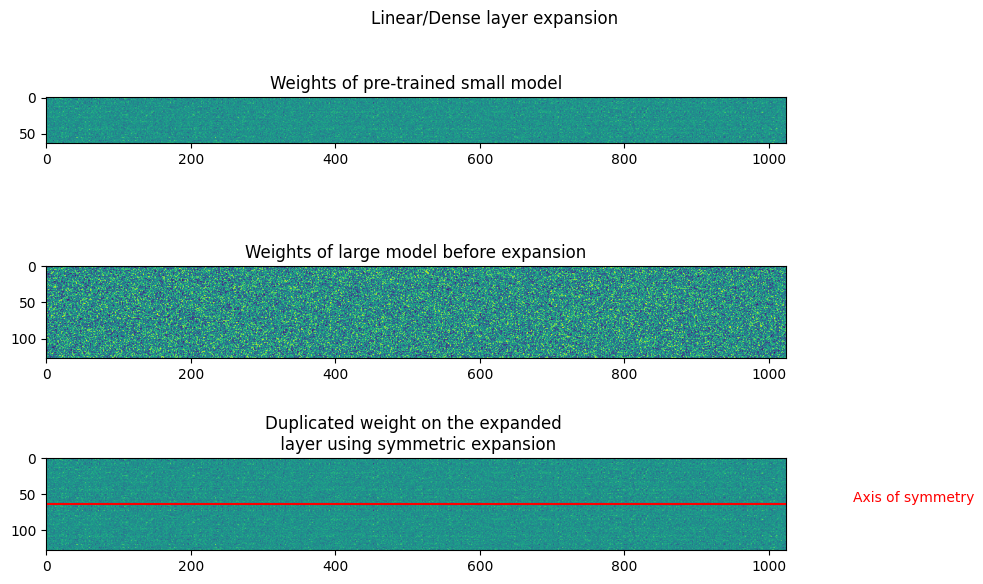

In [529]:
plt.figure(figsize=(10,6))

plt.subplot(311).set_title("Weights of pre-trained small model")
plt.imshow(np.transpose(model.layers[7].weights[0]))

plt.subplot(312).set_title("Weights of large model before expansion")
plt.imshow(np.transpose(dummy_model.layers[7].weights[0]))

plt.subplot(313).set_title("Duplicated weight on the expanded \n layer using symmetric expansion")
plt.imshow(np.transpose(expand_model.layers[7].weights[0]))
plt.axhline(64, color='r')
plt.text(1200, 64, 'Axis of symmetry', color='r', ha='center', va='bottom', rotation=0)

plt.suptitle("Linear/Dense layer expansion")
plt.tight_layout()
plt.show()

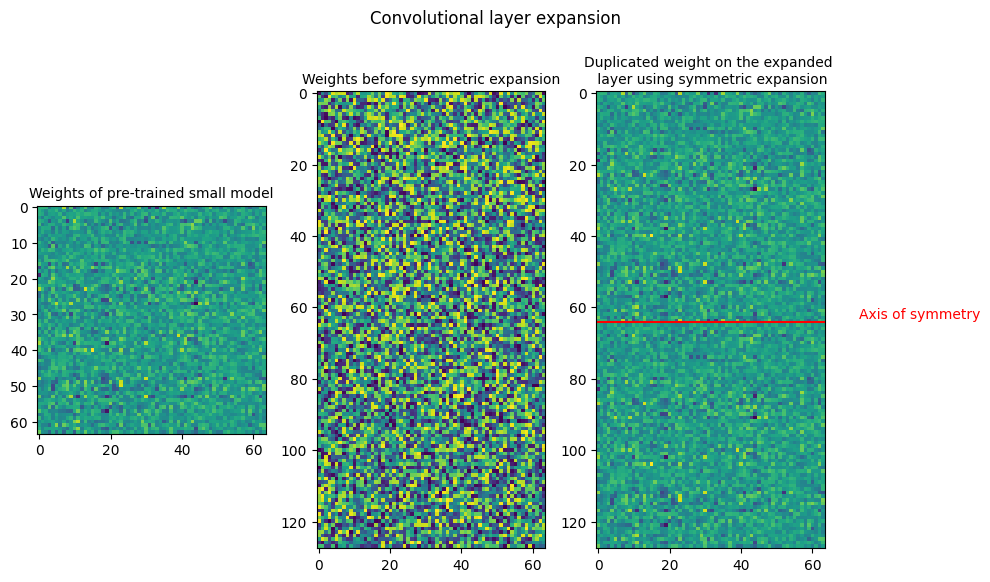

In [528]:
plt.figure(figsize=(10,6))

plt.subplot(131).set_title("Weights of pre-trained small model", fontsize=10)
plt.imshow(model.layers[5].weights[0][0,0,:,:])

plt.subplot(132).set_title("Weights before symmetric expansion", fontsize=10)
plt.imshow(dummy_model.layers[5].weights[0][0,0,:,:])

plt.subplot(133).set_title("Duplicated weight on the expanded \n layer using symmetric expansion", fontsize=10)
plt.imshow(expand_model.layers[5].weights[0][0,0,:,:])
plt.axhline(64, color='r')
plt.text(90, 64, 'Axis of symmetry', color='r', ha='center', va='bottom', rotation=0)

plt.suptitle("Convolutional layer expansion")
plt.tight_layout()
plt.show()

#### Higher Learning Rate - 0.001

In [358]:
initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_symmetric_exp" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")


mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()



expand_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [359]:
expand_model.evaluate(test_ds)

 32/313 [==>...........................] - ETA: 0s - loss: 2.5789 - accuracy: 0.6143

2025-01-12 22:46:23.107494: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


313/313 [==============================] - 1s 3ms/step - loss: 2.4891 - accuracy: 0.6129


[2.4891347885131836, 0.6129000186920166]

In [360]:
hist_large_ref = expand_model.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
   9/1250 [..............................] - ETA: 8s - loss: 3.9331 - accuracy: 0.5069  

2025-01-12 22:46:48.366325: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 7s 6ms/step - loss: 1.8404 - accuracy: 0.4902 - val_loss: 1.5553 - val_accuracy: 0.5024
Epoch 2/10
1250/1250 [==============================] - 7s 6ms/step - loss: 2.0078 - accuracy: 0.4755 - val_loss: 2.3681 - val_accuracy: 0.4927
Epoch 3/10
1250/1250 [==============================] - 8s 6ms/step - loss: 3.0146 - accuracy: 0.4555 - val_loss: 3.4618 - val_accuracy: 0.4210
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 3.3716 - accuracy: 0.4371 - val_loss: 3.6916 - val_accuracy: 0.4298
Epoch 5/10
1250/1250 [==============================] - 7s 6ms/step - loss: 3.6917 - accuracy: 0.4416 - val_loss: 4.0382 - val_accuracy: 0.4279
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 3.9843 - accuracy: 0.4433 - val_loss: 4.2184 - val_accuracy: 0.4229
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 4.0086 - accuracy: 0.4417 - val_loss: 4.1892 - val_accuracy: 0.4217
Epo

In [530]:
large_symmetric_stats = ModelStats("large_expand_symmetric", hist_large_ref, time_callback, mem_callback)
large_symmetric_stats.save_stats()

#### Lower Learning Rate - 0.0001

In [534]:
dummy_model = get_large_model()
expand_layers = [3,5,7,8]
expand_model = expand_model_weights(model, copy.deepcopy(dummy_model), expand_layers,'symmetric')

In [535]:
initial_learning_rate = 0.0001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_symmetric_exp" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")


mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()



expand_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [536]:
expand_model.evaluate(test_ds)

 28/313 [=>............................] - ETA: 1s - loss: 2.5091 - accuracy: 0.6228

2025-01-13 00:12:32.316531: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


313/313 [==============================] - 1s 3ms/step - loss: 2.4635 - accuracy: 0.6249


[2.4635090827941895, 0.6248999834060669]

In [537]:
hist_large_ref = expand_model.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
  10/1250 [..............................] - ETA: 7s - loss: 2.0565 - accuracy: 0.6531  

2025-01-13 00:12:37.921529: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 7s 6ms/step - loss: 1.5666 - accuracy: 0.6504 - val_loss: 1.5457 - val_accuracy: 0.6235
Epoch 2/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.2857 - accuracy: 0.6530 - val_loss: 1.4397 - val_accuracy: 0.6284
Epoch 3/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.2351 - accuracy: 0.6589 - val_loss: 1.4093 - val_accuracy: 0.6326
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.2160 - accuracy: 0.6611 - val_loss: 1.3994 - val_accuracy: 0.6324
Epoch 5/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.2077 - accuracy: 0.6639 - val_loss: 1.3976 - val_accuracy: 0.6317
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.2040 - accuracy: 0.6644 - val_loss: 1.3963 - val_accuracy: 0.6329
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.2022 - accuracy: 0.6646 - val_loss: 1.3955 - val_accuracy: 0.6325
Epo

In [538]:
large_symmetric_stats = ModelStats("large_expand_symmetric_lowerLR", hist_large_ref, time_callback, mem_callback)
large_symmetric_stats.save_stats()

### Noisy Symmetric expansion

In [77]:
expand_model_2 = get_large_model()
expand_layers = [3, 5, 7, 8]
expand_model_2 = expand_model_weights(model, copy.deepcopy(expand_model_2), expand_layers,'noisy_symmetric')

In [80]:
def signaltonoise_dB(signal,noise, axis=0, ddof=0):
    signal = np.asanyarray(signal)
    signal = signal.flatten()

    noise = np.asanyarray(noise)
    noise = noise.flatten()
    
    Ps = np.mean(np.abs(signal))
    Pn = np.std(np.abs(noise))
    
    SNRdB = 10*np.log10(Ps/Pn)
    return np.abs(SNRdB)

In [81]:
print("Signal To Noise Ratio of noisy symmetric expansion = ",signaltonoise_dB(model.layers[5].weights[0][0,0],expand_model_2.layers[5].weights[0][0,0]))

Signal To Noise Ratio of noisy symmetric expansion =  7.558177709579468


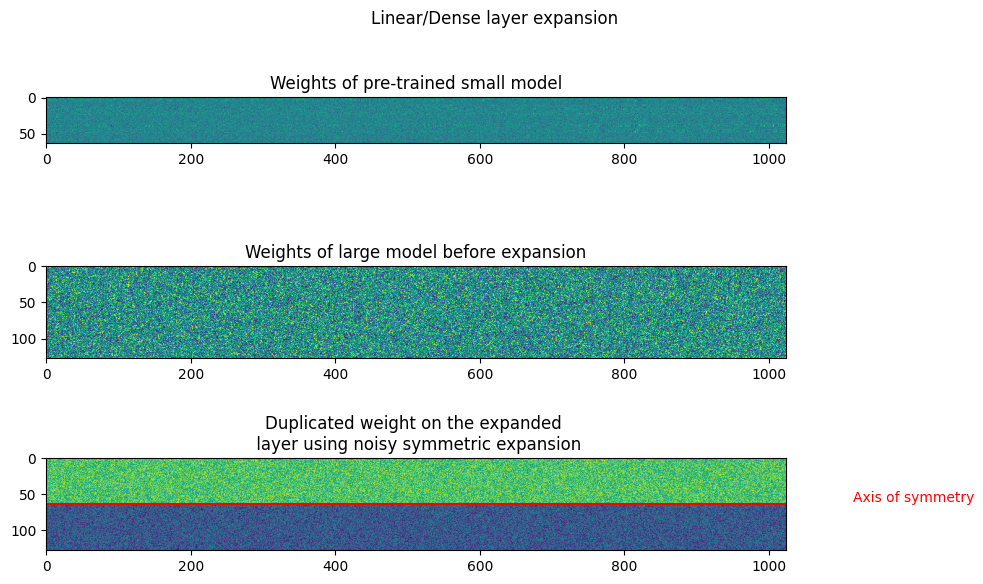

In [30]:
plt.figure(figsize=(10,6))

plt.subplot(311).set_title("Weights of pre-trained small model")
plt.imshow(np.transpose(model.layers[7].weights[0]))

plt.subplot(312).set_title("Weights of large model before expansion")
plt.imshow(np.transpose(dummy_model.layers[7].weights[0]))

plt.subplot(313).set_title("Duplicated weight on the expanded \n layer using noisy symmetric expansion")
plt.imshow(np.transpose(expand_model_2.layers[7].weights[0]))
plt.axhline(64, color='r')
plt.text(1200, 64, 'Axis of symmetry', color='r', ha='center', va='bottom', rotation=0)

plt.suptitle("Linear/Dense layer expansion")
plt.tight_layout()
plt.show()

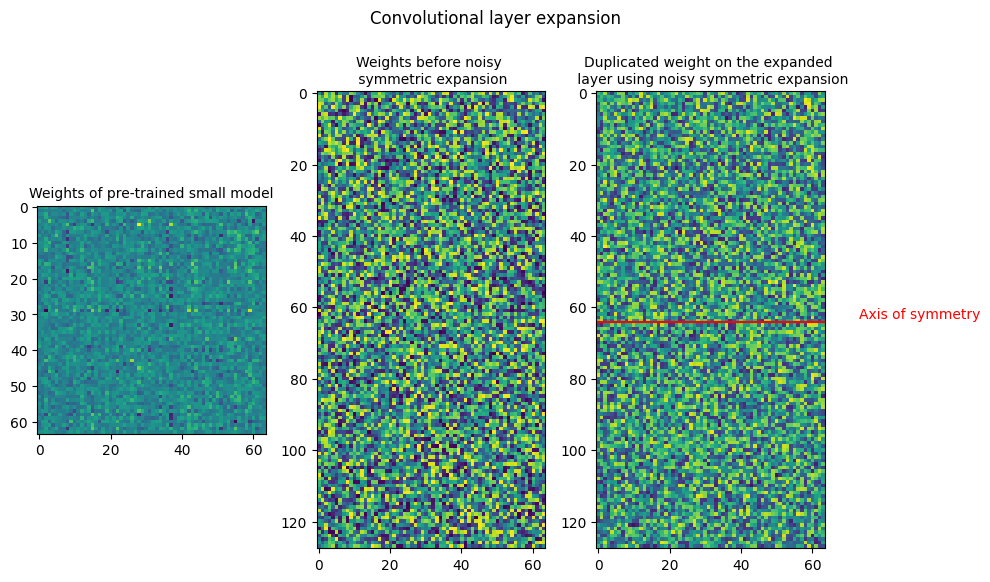

In [32]:
plt.figure(figsize=(10,6))

plt.subplot(131).set_title("Weights of pre-trained small model", fontsize=10)
plt.imshow(model.layers[5].weights[0][0,0,:,:])

plt.subplot(132).set_title("Weights before noisy \n symmetric expansion", fontsize=10)
plt.imshow(dummy_model.layers[5].weights[0][0,0,:,:])

plt.subplot(133).set_title("Duplicated weight on the expanded \n layer using noisy symmetric expansion", fontsize=10)
plt.imshow(expand_model_2.layers[5].weights[0][0,0,:,:])
plt.axhline(64, color='r')
plt.text(90, 64, 'Axis of symmetry', color='r', ha='center', va='bottom', rotation=0)

plt.suptitle("Convolutional layer expansion")
plt.tight_layout()
plt.show()

In [549]:
initial_learning_rate = 0.0001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_noisy_symmetric_exp" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")


mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()

expand_model_2.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [550]:
expand_model_2.evaluate(test_ds)

 30/313 [=>............................] - ETA: 1s - loss: 8505444.0000 - accuracy: 0.0927

2025-01-13 00:18:48.496463: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


313/313 [==============================] - 1s 3ms/step - loss: 8479884.0000 - accuracy: 0.1000


[8479884.0, 0.10000000149011612]

In [551]:
hist_large_exp_2 = expand_model_2.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
  10/1250 [..............................] - ETA: 7s - loss: 7327489.5000 - accuracy: 0.1250  

2025-01-13 00:18:50.566305: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 8s 6ms/step - loss: 429700.0000 - accuracy: 0.1072 - val_loss: 3326.3296 - val_accuracy: 0.1086
Epoch 2/10
1250/1250 [==============================] - 8s 6ms/step - loss: 2158.1931 - accuracy: 0.1278 - val_loss: 1486.1597 - val_accuracy: 0.1191
Epoch 3/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1103.3141 - accuracy: 0.1357 - val_loss: 866.3263 - val_accuracy: 0.1413
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 732.6223 - accuracy: 0.1384 - val_loss: 662.9647 - val_accuracy: 0.1287
Epoch 5/10
1250/1250 [==============================] - 7s 6ms/step - loss: 579.6766 - accuracy: 0.1395 - val_loss: 551.1671 - val_accuracy: 0.1282
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 499.2210 - accuracy: 0.1391 - val_loss: 494.5116 - val_accuracy: 0.1305
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 455.7195 - accuracy: 0.1391 - val_loss: 

In [552]:
large_noisy_symmetric_stats = ModelStats("large_expand_noisy_symmetric_lowerLR", hist_large_exp_2, time_callback, mem_callback)
large_noisy_symmetric_stats.save_stats()

### Diagonal Expansion
Similar to symmetric expansion, the weights of the linear and convolutional layers are plotted. It is visible in the plots that the along the primary diagonal, the sub-matrices are copied from the small layer weight and the secondary diagonal has only 0s.

This method is also trained using 0.0001 learning rate, as using this learning rate was shown to perform better in the symmetric expansion. 

As diagonal expansion requires scaling along two dimensions, not all layers can be scaled using this technique.
In the first training, for layers that are not scaled along both dimensions, symmetric expansion is used for these layers and the training is performed.

For the second training, only the layers with scaling along both dimensions are scaled using diagonal expansion and the other layers are randomly initialized.

In [22]:
expand_model_3 = get_large_model_2()
expand_model_3 = expand_model_weights_specific_layer(model, copy.deepcopy(expand_model_3), [3,5,7,8],[3,5,7,8],['symmetric','diagonal','diagonal','symmetric'])
dummy_model_2 = get_large_model_2()

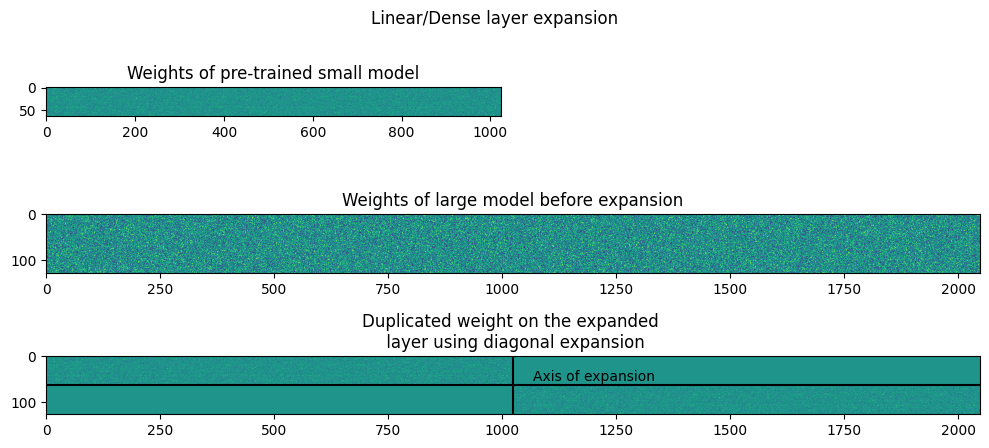

In [817]:
plt.figure(figsize=(10,6))

plt.subplot(421).set_title("Weights of pre-trained small model")
plt.imshow(np.transpose(model.layers[7].weights[0]))

plt.subplot(412).set_title("Weights of large model before expansion")
plt.imshow(np.transpose(dummy_model_2.layers[7].weights[0]))

plt.subplot(413).set_title("Duplicated weight on the expanded \n layer using diagonal expansion")
plt.imshow(np.transpose(expand_model_3.layers[7].weights[0]))
plt.axhline(64, color='k')
plt.text(1200, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)
plt.axvline(1024, color='k')

plt.suptitle("Linear/Dense layer expansion")
plt.tight_layout()
plt.show()

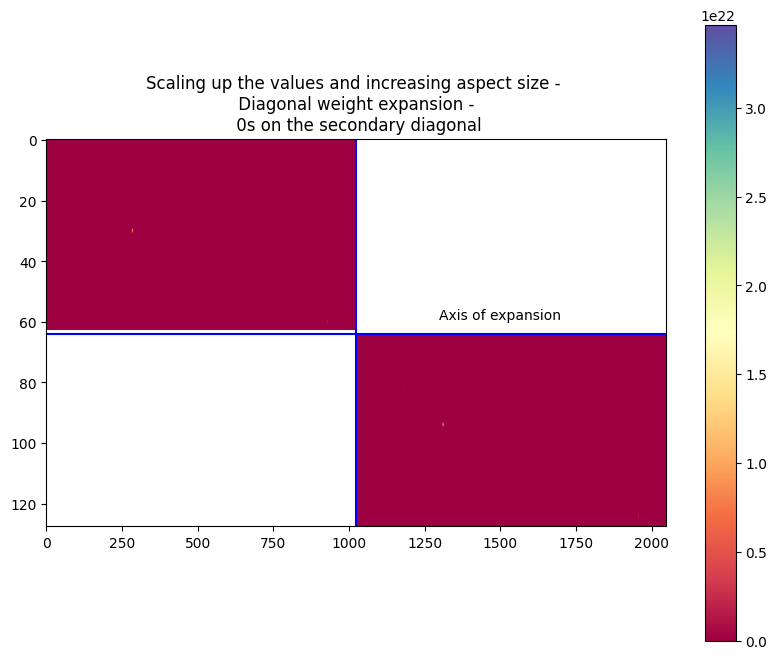

In [818]:
plt.figure(figsize=(10,8))
plt.imshow(np.transpose((expand_model_3.layers[7].weights[0])**-4), cmap='Spectral', aspect=10)
plt.colorbar()
plt.axhline(64, color='b')
plt.text(1500, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)
plt.axvline(1024, color='b')
plt.title("Scaling up the values and increasing aspect size - \n Diagonal weight expansion - \n 0s on the secondary diagonal")
plt.show()

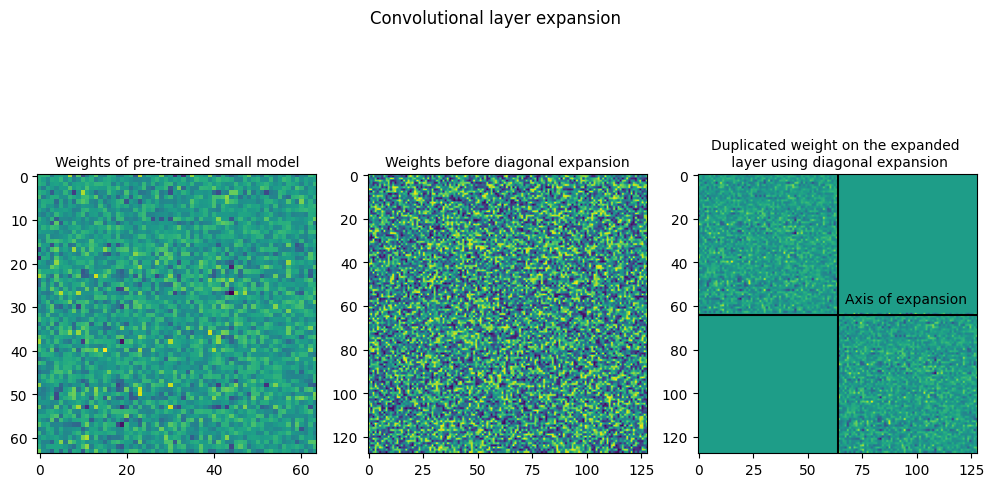

In [820]:
plt.figure(figsize=(10,6))

plt.subplot(131).set_title("Weights of pre-trained small model", fontsize=10)
plt.imshow(model.layers[5].weights[0][0,0,:,:])

plt.subplot(132).set_title("Weights before diagonal expansion", fontsize=10)
plt.imshow(dummy_model_2.layers[5].weights[0][0,0,:,:])

plt.subplot(133).set_title("Duplicated weight on the expanded \n layer using diagonal expansion", fontsize=10)
plt.imshow(expand_model_3.layers[5].weights[0][0,0,:,:])
plt.axhline(64, color='k')
plt.axvline(64, color='k')
plt.text(95, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)

plt.suptitle("Convolutional layer expansion")
plt.tight_layout()
plt.show()

In [671]:
initial_learning_rate = 0.0001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_diagonal_exp" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()

expand_model_3.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [673]:
hist_large_exp_3 = expand_model_3.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
   9/1250 [..............................] - ETA: 8s - loss: 4.1411 - accuracy: 0.0764  

2025-01-13 00:50:48.752883: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 8s 6ms/step - loss: 1.9080 - accuracy: 0.3079 - val_loss: 1.6524 - val_accuracy: 0.4084
Epoch 2/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.5594 - accuracy: 0.4363 - val_loss: 1.5318 - val_accuracy: 0.4474
Epoch 3/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.4772 - accuracy: 0.4671 - val_loss: 1.4960 - val_accuracy: 0.4582
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.4425 - accuracy: 0.4830 - val_loss: 1.4715 - val_accuracy: 0.4702
Epoch 5/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.4267 - accuracy: 0.4904 - val_loss: 1.4595 - val_accuracy: 0.4757
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.4190 - accuracy: 0.4944 - val_loss: 1.4527 - val_accuracy: 0.4794
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.4154 - accuracy: 0.4959 - val_loss: 1.4490 - val_accuracy: 0.4826
Epo

In [674]:
large_diagonal_stats = ModelStats("large_expand_diagonal_lowerLR", hist_large_exp_3, time_callback, mem_callback)
large_diagonal_stats.save_stats()

#### Diagonal expansion with only diagonal expansion layers

In [20]:
expand_model_4 = get_large_model_2()
expand_model_4 = expand_model_weights_specific_layer(model, copy.deepcopy(expand_model_4), [5,7],[5,7],['diagonal','diagonal'])

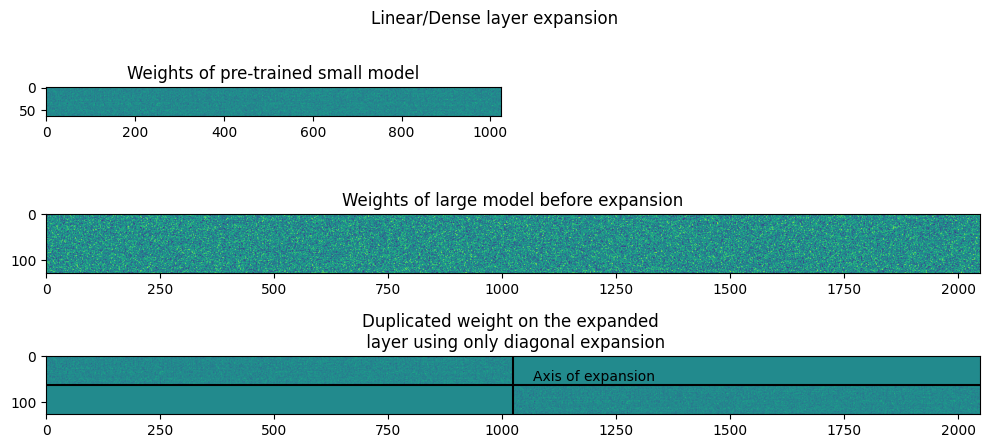

In [38]:
plt.figure(figsize=(10,6))

plt.subplot(421).set_title("Weights of pre-trained small model")
plt.imshow(np.transpose(model.layers[7].weights[0]))

plt.subplot(412).set_title("Weights of large model before expansion")
plt.imshow(np.transpose(dummy_model_2.layers[7].weights[0]))

plt.subplot(413).set_title("Duplicated weight on the expanded \n layer using only diagonal expansion")
plt.imshow(np.transpose(expand_model_4.layers[7].weights[0]))
plt.axhline(64, color='k')
plt.text(1200, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)
plt.axvline(1024, color='k')

plt.suptitle("Linear/Dense layer expansion")
plt.tight_layout()
plt.show()

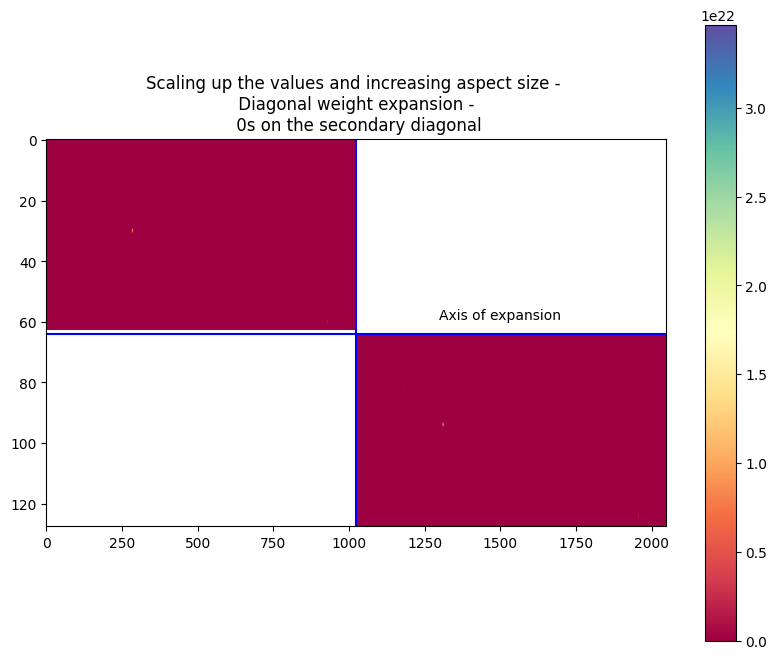

In [827]:
plt.figure(figsize=(10,8))
plt.imshow(np.transpose((expand_model_4.layers[7].weights[0])**-4), cmap='Spectral', aspect=10)
plt.colorbar()
plt.axhline(64, color='b')
plt.text(1500, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)
plt.axvline(1024, color='b')
plt.title("Scaling up the values and increasing aspect size - \n Diagonal weight expansion - \n 0s on the secondary diagonal")
plt.show()

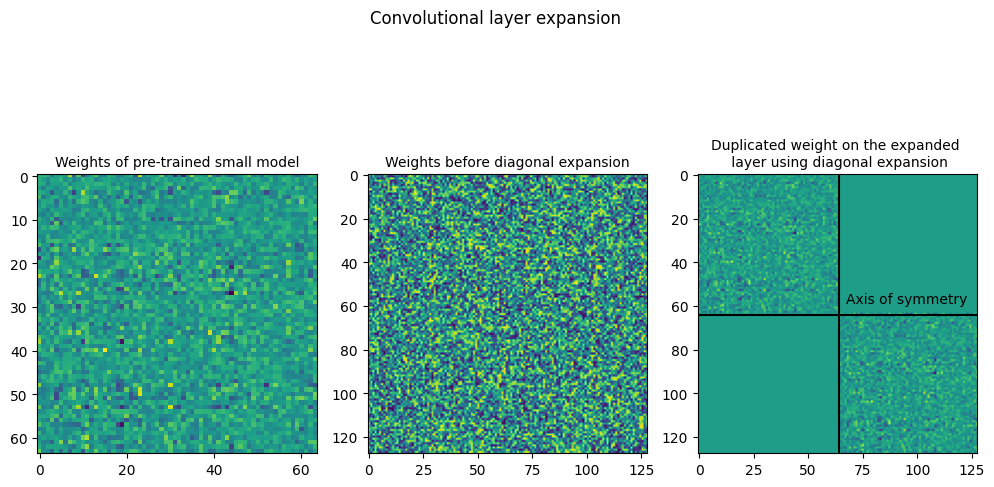

In [829]:
plt.figure(figsize=(10,6))

plt.subplot(131).set_title("Weights of pre-trained small model", fontsize=10)
plt.imshow(model.layers[5].weights[0][0,0,:,:])

plt.subplot(132).set_title("Weights before diagonal expansion", fontsize=10)
plt.imshow(dummy_model_2.layers[5].weights[0][0,0,:,:])

plt.subplot(133).set_title("Duplicated weight on the expanded \n layer using diagonal expansion", fontsize=10)
plt.imshow(expand_model_4.layers[5].weights[0][0,0,:,:])
plt.axhline(64, color='k')
plt.axvline(64, color='k')
plt.text(95, 60, 'Axis of symmetry', color='k', ha='center', va='bottom', rotation=0)

plt.suptitle("Convolutional layer expansion")
plt.tight_layout()
plt.show()

In [681]:
initial_learning_rate = 0.0001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_diagonal_exp" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()

expand_model_4.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [683]:
hist_large_exp_4 = expand_model_4.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
   9/1250 [..............................] - ETA: 8s - loss: 2.5183 - accuracy: 0.1076  

2025-01-13 00:54:27.845375: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 8s 6ms/step - loss: 1.8014 - accuracy: 0.3341 - val_loss: 1.6241 - val_accuracy: 0.4178
Epoch 2/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.4924 - accuracy: 0.4550 - val_loss: 1.5104 - val_accuracy: 0.4563
Epoch 3/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.4266 - accuracy: 0.4854 - val_loss: 1.4427 - val_accuracy: 0.4839
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.3982 - accuracy: 0.4997 - val_loss: 1.4171 - val_accuracy: 0.4941
Epoch 5/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.3848 - accuracy: 0.5052 - val_loss: 1.4073 - val_accuracy: 0.4990
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.3783 - accuracy: 0.5077 - val_loss: 1.4033 - val_accuracy: 0.5002
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.3752 - accuracy: 0.5093 - val_loss: 1.4015 - val_accuracy: 0.5010
Epo

In [688]:
large_diagonal_2_stats = ModelStats("large_expand_diagonal_2_lowerLR", hist_large_exp_4, time_callback, mem_callback)
large_diagonal_2_stats.save_stats()

From the training metrics, the diagonal expansion technique is not as effective as symmetric expansion and is also slightly worse than training from scratch.

There could be a few possible reasons for this, one is that not all layers are scaled along both dimensions and therefore diagonal expansion is not as applicable as symmetric, reducing its total effect on the performance of the model.
Another reason could be using only 0s along the secondary diagonal which makes convergence tougher and reduces the performance. 

The next technique, noisy diagonal expansion, looks at adding noise to the entire expanded weight layer to check if this increases the performance.

### Noisy Diagonal expansion

In [87]:
expand_model_5 = get_large_model_2()
expand_model_5 = expand_model_weights_specific_layer(model, copy.deepcopy(expand_model_5), [3,5,7,8],[3,5,7,8],['symmetric','noisy_diagonal','noisy_diagonal','symmetric'])

In [88]:
print("Signal To Noise Ratio of noisy diagonal expansion = ",signaltonoise_dB(model.layers[5].weights[0][0,0],expand_model_5.layers[5].weights[0][0,0]))

Signal To Noise Ratio of noisy diagonal expansion =  7.612966299057007


In [845]:
initial_learning_rate = 0.0001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_noisy_diagonal_exp_1_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()

expand_model_5.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

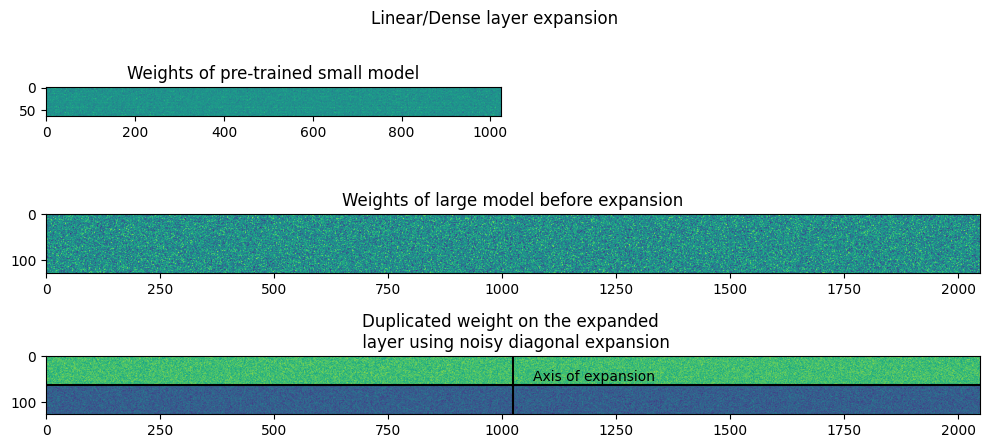

In [852]:
plt.figure(figsize=(10,6))

plt.subplot(421).set_title("Weights of pre-trained small model")
plt.imshow(np.transpose(model.layers[7].weights[0]))

plt.subplot(412).set_title("Weights of large model before expansion")
plt.imshow(np.transpose(dummy_model_2.layers[7].weights[0]))

plt.subplot(413).set_title("Duplicated weight on the expanded \n layer using noisy diagonal expansion")
plt.imshow(np.transpose(expand_model_5.layers[7].weights[0]))
plt.axhline(64, color='k')
plt.text(1200, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)
plt.axvline(1024, color='k')

plt.suptitle("Linear/Dense layer expansion")
plt.tight_layout()
plt.show()

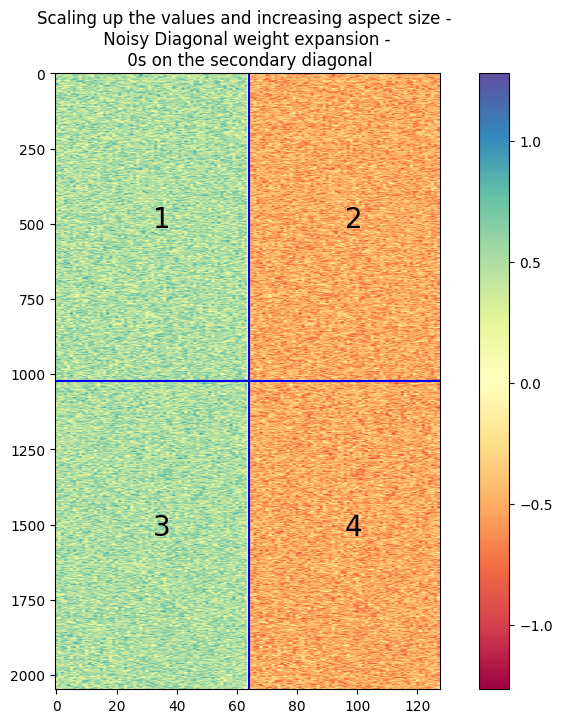

In [883]:
plt.figure(figsize=(10,8))
plt.imshow(expand_model_5.layers[7].weights[0], cmap='Spectral', aspect=0.10)
plt.colorbar()
plt.axhline(1024, color='b')
plt.axvline(64, color='b')
# plt.text(1500, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)
# plt.axvline(1024, color='b')
plt.text(32,512,1, color='k', fontsize=20)
plt.text(96,512,2, color='k', fontsize=20)
plt.text(32,1536,3, color='k', fontsize=20)
plt.text(96,1536,4, color='k', fontsize=20)
plt.title("Scaling up the values and increasing aspect size - \n Noisy Diagonal weight expansion - \n 0s on the secondary diagonal")
plt.show()

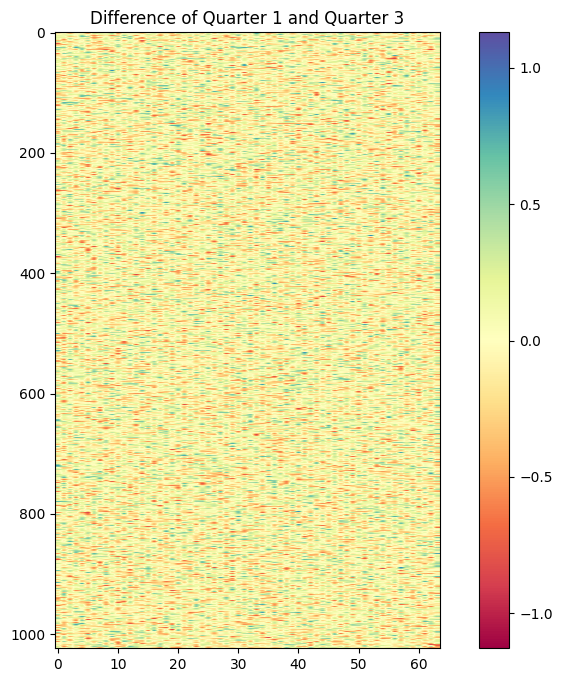

In [877]:
plt.figure(figsize=(10,8))
plt.imshow(expand_model_5.layers[7].weights[0][1024:,:64]  - expand_model_5.layers[7].weights[0][:1024,:64], cmap='Spectral', aspect=0.10)
plt.colorbar()
plt.title("Difference of Quarter 1 and Quarter 3")
plt.show()

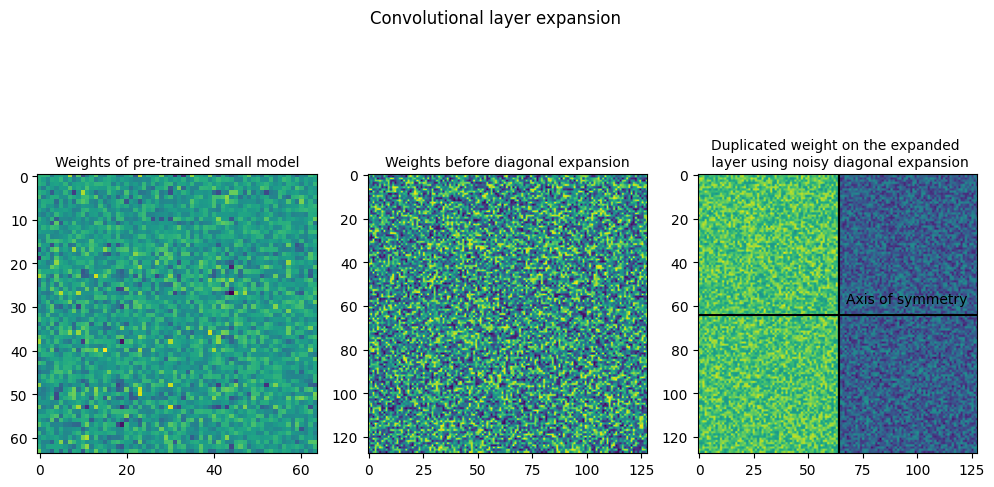

In [884]:
plt.figure(figsize=(10,6))

plt.subplot(131).set_title("Weights of pre-trained small model", fontsize=10)
plt.imshow(model.layers[5].weights[0][0,0,:,:])

plt.subplot(132).set_title("Weights before diagonal expansion", fontsize=10)
plt.imshow(dummy_model_2.layers[5].weights[0][0,0,:,:])

plt.subplot(133).set_title("Duplicated weight on the expanded \n layer using noisy diagonal expansion", fontsize=10)
plt.imshow(expand_model_5.layers[5].weights[0][0,0,:,:])
plt.axhline(64, color='k')
plt.axvline(64, color='k')
plt.text(95, 60, 'Axis of symmetry', color='k', ha='center', va='bottom', rotation=0)

plt.suptitle("Convolutional layer expansion")
plt.tight_layout()
plt.show()

In [885]:
expand_model_5.evaluate(test_ds)

 30/313 [=>............................] - ETA: 1s - loss: 7464069.0000 - accuracy: 0.1104

2025-01-13 02:27:55.751042: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


313/313 [==============================] - 1s 3ms/step - loss: 7419274.0000 - accuracy: 0.0998


[7419274.0, 0.0997999981045723]

In [886]:
hist_large_exp_5 = expand_model_5.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
   1/1250 [..............................] - ETA: 5:10 - loss: 7362205.0000 - accuracy: 0.0938WARNING:tensorflow:Callback method `on_train_batch_end` is slow compared to the batch time (batch time: 0.0035s vs `on_train_batch_end` time: 0.0037s). Check your callbacks.


2025-01-13 02:28:00.994356: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 8s 6ms/step - loss: 614833.2500 - accuracy: 0.1029 - val_loss: 6324.7075 - val_accuracy: 0.1080
Epoch 2/10
1250/1250 [==============================] - 8s 6ms/step - loss: 5330.5757 - accuracy: 0.1041 - val_loss: 4340.1553 - val_accuracy: 0.1026
Epoch 3/10
1250/1250 [==============================] - 8s 6ms/step - loss: 3580.3259 - accuracy: 0.1054 - val_loss: 3250.3142 - val_accuracy: 0.1089
Epoch 4/10
1250/1250 [==============================] - 8s 6ms/step - loss: 2846.3921 - accuracy: 0.1063 - val_loss: 2667.7700 - val_accuracy: 0.1108
Epoch 5/10
1250/1250 [==============================] - 7s 6ms/step - loss: 2492.1851 - accuracy: 0.1077 - val_loss: 2478.0137 - val_accuracy: 0.1059
Epoch 6/10
1250/1250 [==============================] - 8s 6ms/step - loss: 2296.8625 - accuracy: 0.1085 - val_loss: 2272.1738 - val_accuracy: 0.1085
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 2192.0515 - accuracy: 0.1081 - va

In [692]:
large_noisy_diagonal_2_stats = ModelStats("large_expand_noisy_diagonal_lowerLR", hist_large_exp_5, time_callback, mem_callback)
large_noisy_diagonal_2_stats.save_stats()

From the training logs, it is evident that noisy diagonal is not effective and is the worst performing method so far. The paper does not describe this, but one of the issues could be that the noise is not scaled. The paper states that the noise is added such that the Signal To Noise Ratio (SNR) remains at 10dB, however, the SNR is actually within 10dB. The SNR ratios of the two noisy methods is as given below

| Method | SNR Ratio |
| ------ | --------- |
| Noisy Symmetric | 7.562 |
| Noisy Diagonal |  7.599 |

The next techniques would look at scaling the noise so that the noise generated has the same mean and standard deviation as the reference weight(weight from the small model). 

## Analysis

In [107]:
stats_1 = ModelStats("large_model_ref")
stats_1.read_stats()

stats_2 = ModelStats("large_expand_symmetric")
stats_2.read_stats()

stats_3 = ModelStats("large_expand_symmetric_lowerLR")
stats_3.read_stats()

stats_4 = ModelStats("large_expand_noisy_symmetric_lowerLR")
stats_4.read_stats()

stats_7 = ModelStats("large_expand_diagonal_lowerLR")
stats_7.read_stats()

stats_8 = ModelStats("large_expand_diagonal_2_lowerLR")
stats_8.read_stats()

stats_9 = ModelStats("large_expand_noisy_diagonal_lowerLR")
stats_9.read_stats()

In [118]:
stats = [stats_1, stats_2, stats_3, stats_4, stats_7, stats_8, stats_9]
labels = ["Large Model from scratch", "Symmetric Expansion - Higher Initial LR", "Symmetric expansion", "Noisy Symmetric", "Diagonal Expansion with Symmetric expansion for smaller layers", 
          "Diagonal - Only Diagonal Expansion", "Noisy Diagonal"]
metrics = ["Validation Accuracy", "Validation Loss","Training Accuracy", "Training Loss"]
metric_keys = ["val_accuracy","val_loss","accuracy","loss"]


### Validation accuracy

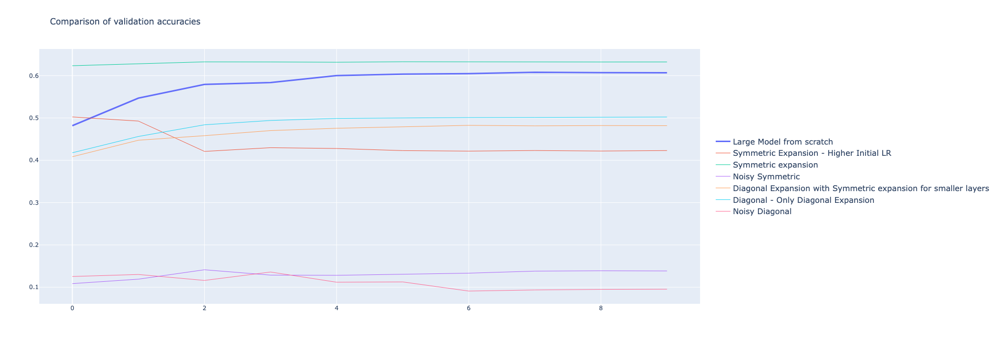

In [119]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[0]])))
    y = stats[j].hist[metric_keys[0]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16), height=700,width=1500,title="Comparison of validation accuracies")
fig.show()

### Validation loss

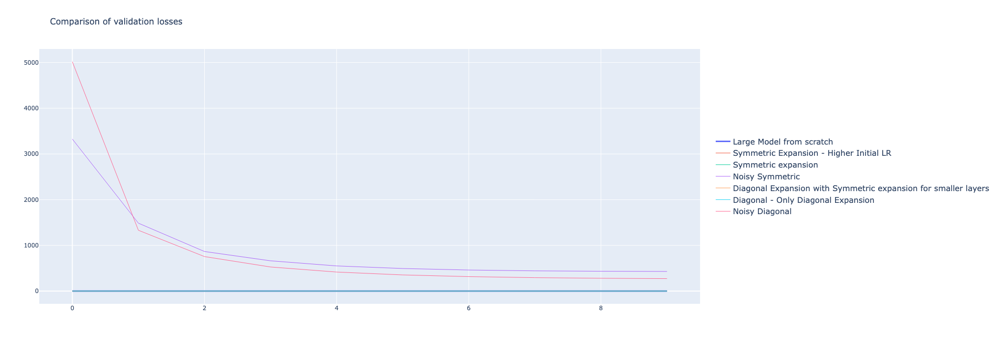

In [120]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[1]])))
    y = stats[j].hist[metric_keys[1]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16),height=700,width=1500, title="Comparison of validation losses")
fig.show()

### Training Accuracy

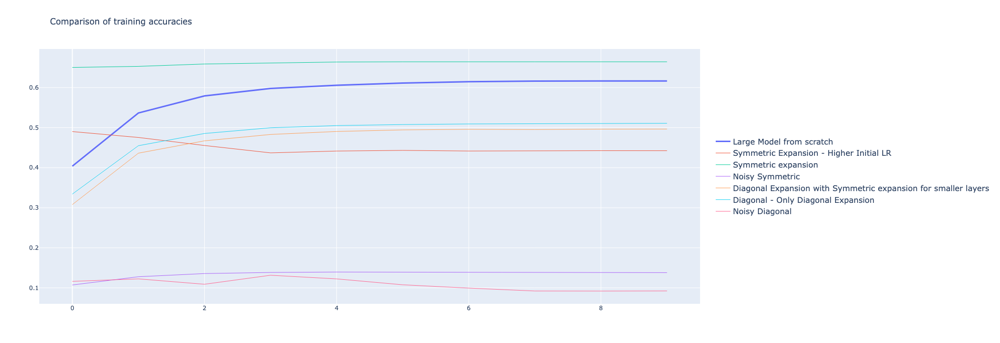

In [121]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[2]])))
    y = stats[j].hist[metric_keys[2]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16), height=700,width=1500, title="Comparison of training accuracies")
fig.show()

### Training loss

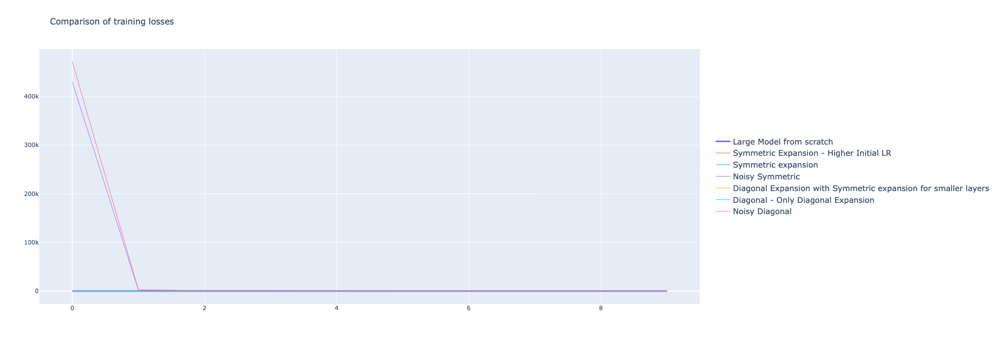

In [122]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[3]])))
    y = stats[j].hist[metric_keys[3]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16), height=700,width=1500,title="Comparison of training losses")
fig.show()

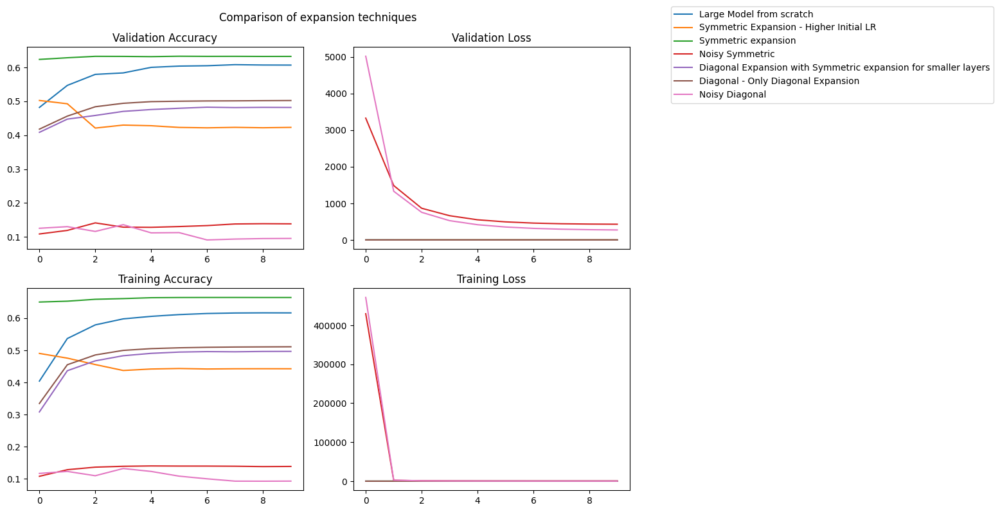

In [123]:
fig, ax = plt.subplots(2,2,figsize=(10,8))
for i in range(len(metrics)):
    ax = plt.subplot(2,2,i+1)
    for j in range(len(labels)):
        ax.plot(stats[j].hist[metric_keys[i]], label=labels[j])
    ax.set_title(metrics[i])
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(1.3, 1))
plt.suptitle("Comparison of expansion techniques")
plt.tight_layout()
plt.show()

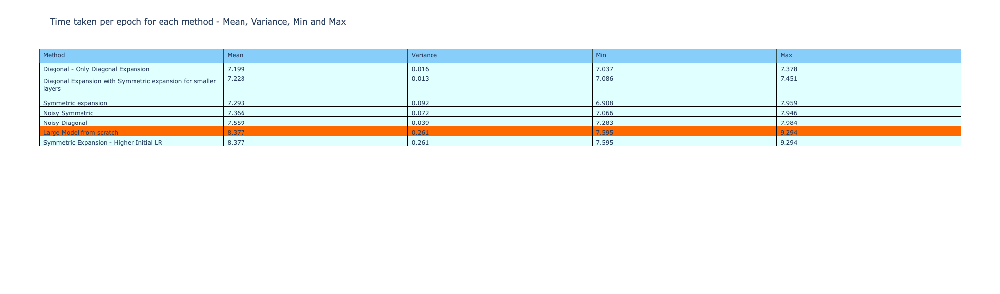

In [124]:
formatted_time = []
for i in range(len(labels)):
    time_i = stats[i].timeCB['time_taken']
    temp = []
    for j in range(1,len(time_i)):
        temp.append(time_i[j] - time_i[j-1])
    formatted_time.append(temp)

rows = []

for i in range(len(labels)):
    temp = []
    temp.append(labels[i])
    temp.append(str(round(np.mean(formatted_time[i]),3)))
    temp.append(str(round(np.var(formatted_time[i]),3)))
    temp.append(str(round(np.min(formatted_time[i]),3)))
    temp.append(str(round(np.max(formatted_time[i]),3)))
    rows.append(temp)

time_taken = pd.DataFrame(rows, columns=["Method","Mean","Variance", "Min", "Max"])

time_taken_sorted = time_taken.sort_values(by="Mean",ascending=True)

colors = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in time_taken_sorted.to_numpy()]

fig = go.Figure(data=[go.Table(
    header=dict(values=time_taken.columns,
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue',
               ),
    cells=dict(values=[time_taken_sorted["Method"],
                       time_taken_sorted["Mean"],
                       time_taken_sorted["Variance"],
                       time_taken_sorted["Min"],
                       time_taken_sorted["Max"]],
               align='left',
               fill_color=[colors],
               line_color='black'
              ),
)
])

fig.update_layout(
    height=600,
    width=1600,
    title="Time taken per epoch for each method - Mean, Variance, Min and Max"
)

fig.show()


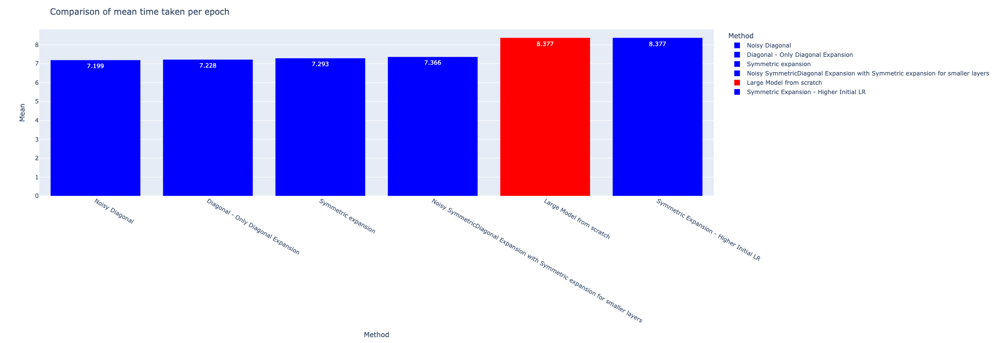

In [116]:
time_taken_sorted['Mean'] = pd.to_numeric(time_taken_sorted['Mean'])
color_bar = ['red' if x[0] == "Large Model from scratch" else 'blue' for x in time_taken_sorted.to_numpy()]
fig = px.bar(time_taken_sorted, x='Method', y='Mean', color="Method", color_discrete_sequence=color_bar, text_auto=True
            )
fig.update_layout(
    title="Comparison of mean time taken per epoch",
    height=700,
    width=2000,
)
fig.show()

In [117]:
table_rows = []
table_header = ["Method"]
table_header.extend(metrics)
table_header.append("Validation Accuracy after first epoch")

for i in range(len(labels)):
    temp = []
    temp.append(labels[i])
    for j in range(len(metrics)):
        temp.append(round(stats[i].hist[metric_keys[j]][-1],3))
    temp.append(round(stats[i].hist["val_accuracy"][0],3))
    table_rows.append(temp)


In [157]:
df = pd.DataFrame(table_rows, columns=table_header)
df_1 = df.sort_values(by="Validation Accuracy", ascending=False)
df_2 = df.sort_values(by="Validation Loss", ascending=True)
df_3 = df.sort_values(by="Validation Accuracy after first epoch", ascending=False)

In [158]:
colors_1 = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in df_1.to_numpy()]
colors_2 = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in df_2.to_numpy()]
colors_3 = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in df_3.to_numpy()]

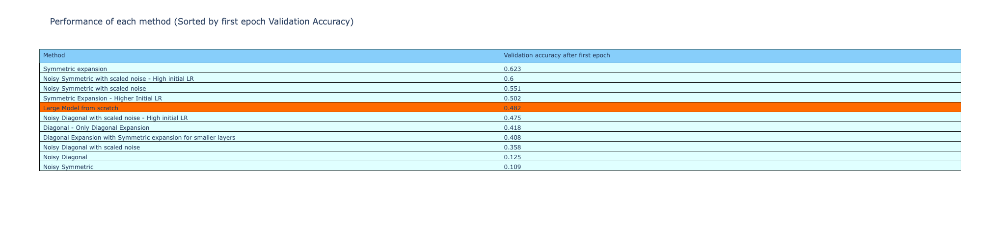

In [159]:
fig = go.Figure(data=[go.Table(
    header=dict(values=["Method","Validation accuracy after first epoch"],
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue'),
    cells=dict(values=[df_3["Method"],
                       df_3["Validation Accuracy after first epoch"]],
               align='left',
               fill_color=[colors_3],
               line_color='black'
              ),
)
])

fig.update_layout(
    height=500,
    width=1000,
    title="Performance of each method (Sorted by first epoch Validation Accuracy)"
)

fig.show()

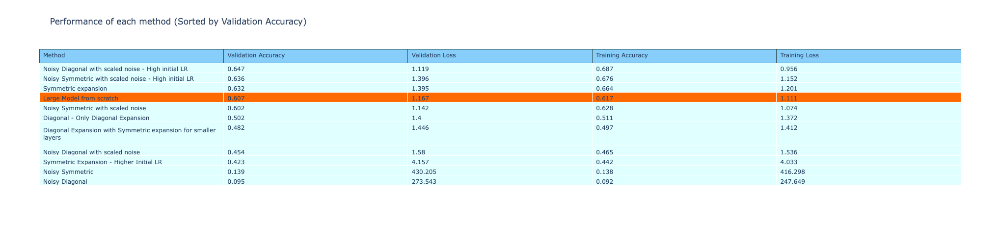

In [160]:
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_1.columns[:-1]),
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue'),
    cells=dict(values=[df_1["Method"], df_1["Validation Accuracy"], df_1["Validation Loss"], df_1["Training Accuracy"], df_1["Training Loss"]],
               align='left',
               line_color='white',
               fill_color=[colors_1]
              
              ))
])

fig.update_layout(
    height=500,
    width=2000,
    title="Performance of each method (Sorted by Validation Accuracy)"
)

fig.show()

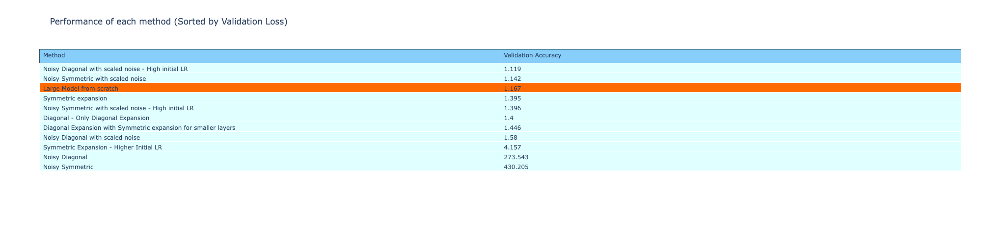

In [161]:
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_1.columns[:2]),
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue'),
    cells=dict(values=[df_2["Method"], df_2["Validation Loss"]],
               align='left',
               line_color='white',
               fill_color=[colors_2]
              
              ))
])

fig.update_layout(
    height=500,
    width=800,
    title="Performance of each method (Sorted by Validation Loss)"
)

fig.show()

In [102]:
stats = [stats_1, stats_2, stats_3, stats_5, stats_6, stats_7, stats_8, stats_10, stats_11]
labels = ["Large Model from scratch", "Symmetric Expansion - Higher Initial LR", "Symmetric expansion","Noisy Symmetric with scaled noise - High initial LR", "Noisy Symmetric with scaled noise", 
          "Diagonal Expansion with Symmetric expansion for smaller layers", "Diagonal - Only Diagonal Expansion", "Noisy Diagonal with scaled noise - High initial LR", "Noisy Diagonal with scaled noise"]
metrics = ["Validation Accuracy", "Validation Loss","Training Accuracy", "Training Loss"]
metric_keys = ["val_accuracy","val_loss","accuracy","loss"]

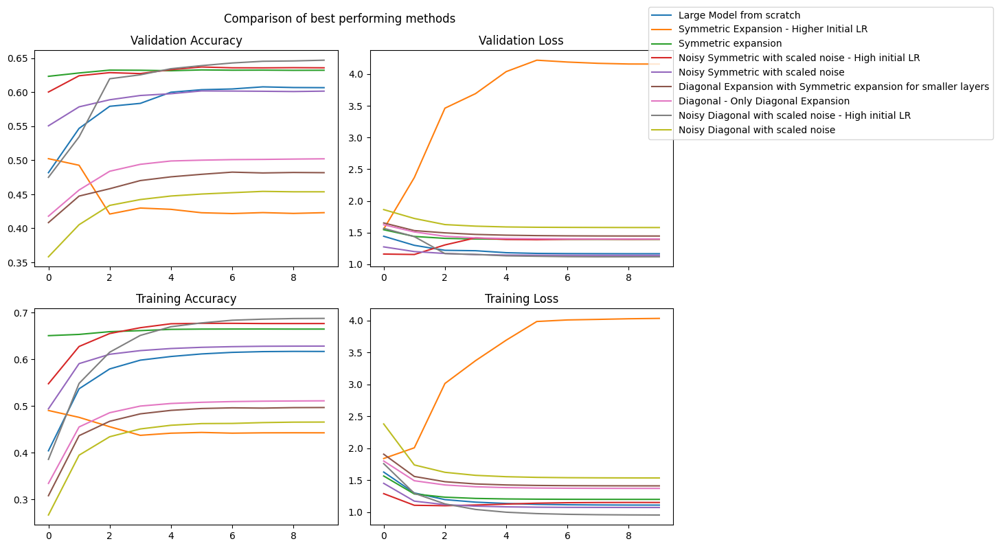

In [103]:
fig, ax = plt.subplots(2,2,figsize=(10,8))
for i in range(len(metrics)):
    ax = plt.subplot(2,2,i+1)
    for j in range(len(labels)):
        ax.plot(stats[j].hist[metric_keys[i]], label=labels[j])
    ax.set_title(metrics[i])

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(1.2, 1))
plt.suptitle("Comparison of best performing methods")
plt.tight_layout()
plt.show()

## Experiment - 3

This experiment is an extension on the methods as implemented and tested in experiment 2. In the previous experiment, it was noticed that while the methods without noise perform well, adding noise drastically reduces the performance of the entire system. This is not expected as in the methods without noise, all the elements were either the previous weight or 0, and with the high number of 0s in the initial weights, adding a bit of noise instead would be expected to perform better. However, adding noise, on the contrary, reduced the accuracy and increased the loss by a large magnitude. 

One of the issues of this may be that the added noise is not scaled to match the distribution of the reference weights. A modification is made in the script that calculates the noise based on the mean and standard deviation of the weights of the reference layer. This is the noise that is used for initialization of the weights in the larger model. Similar training loops are run for the larger models which make use of scaled weights and the performance metrics are compared. 

### Noisy Symmetric expansion - Scaled Noise

In [71]:
expand_model_6 = get_large_model()
expand_layers = [3, 5, 7, 8]
expand_model_6 = expand_model_weights(model, copy.deepcopy(expand_model_6), expand_layers,'noisy_symmetric', scaled_noise=True)

In [72]:
print("Signal To Noise Ratio of noisy diagonal expansion with scaled noise = ",signaltonoise_dB(model.layers[5].weights[0][0,0],expand_model_6.layers[5].weights[0][0,0]))

Signal To Noise Ratio of noisy diagonal expansion with scaled noise =  0.6391286849975586


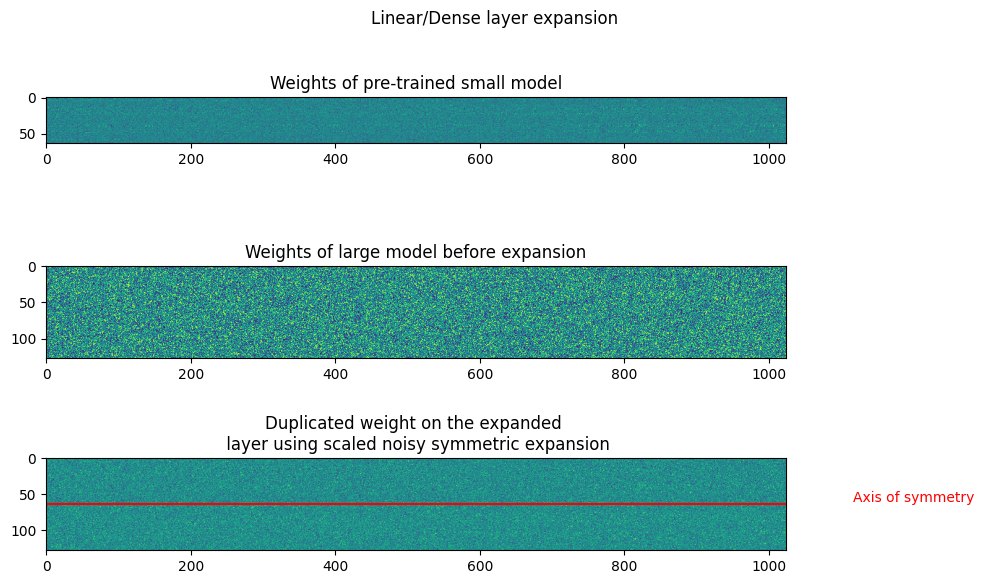

In [34]:
plt.figure(figsize=(10,6))

plt.subplot(311).set_title("Weights of pre-trained small model")
plt.imshow(np.transpose(model.layers[7].weights[0]))

plt.subplot(312).set_title("Weights of large model before expansion")
plt.imshow(np.transpose(dummy_model.layers[7].weights[0]))

plt.subplot(313).set_title("Duplicated weight on the expanded \n layer using scaled noisy symmetric expansion")
plt.imshow(np.transpose(expand_model_6.layers[7].weights[0]))
plt.axhline(64, color='r')
plt.text(1200, 64, 'Axis of symmetry', color='r', ha='center', va='bottom', rotation=0)

plt.suptitle("Linear/Dense layer expansion")
plt.tight_layout()
plt.show()

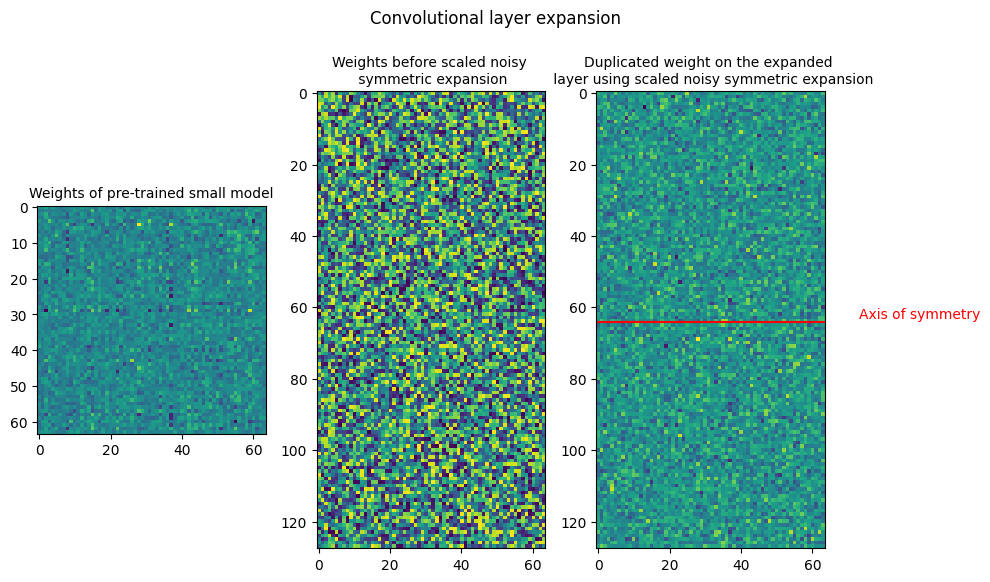

In [36]:
plt.figure(figsize=(10,6))

plt.subplot(131).set_title("Weights of pre-trained small model", fontsize=10)
plt.imshow(model.layers[5].weights[0][0,0,:,:])

plt.subplot(132).set_title("Weights before scaled noisy \n symmetric expansion", fontsize=10)
plt.imshow(dummy_model.layers[5].weights[0][0,0,:,:])

plt.subplot(133).set_title("Duplicated weight on the expanded \n layer using scaled noisy symmetric expansion", fontsize=10)
plt.imshow(expand_model_6.layers[5].weights[0][0,0,:,:])
plt.axhline(64, color='r')
plt.text(90, 64, 'Axis of symmetry', color='r', ha='center', va='bottom', rotation=0)

plt.suptitle("Convolutional layer expansion")
plt.tight_layout()
plt.show()

In [893]:
initial_learning_rate = 0.0001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_noisy_symmetric_exp_scale_noise" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")


mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()

expand_model_6.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [894]:
expand_model_6.evaluate(test_ds)

 28/313 [=>............................] - ETA: 1s - loss: 4.2518 - accuracy: 0.1261

2025-01-13 02:31:51.028079: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


313/313 [==============================] - 1s 3ms/step - loss: 4.1480 - accuracy: 0.1420


[4.147990703582764, 0.1420000046491623]

In [895]:
hist_large_exp_6 = expand_model_6.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
   1/1250 [..............................] - ETA: 5:08 - loss: 4.2571 - accuracy: 0.1250WARNING:tensorflow:Callback method `on_train_batch_end` is slow compared to the batch time (batch time: 0.0037s vs `on_train_batch_end` time: 0.0038s). Check your callbacks.


2025-01-13 02:31:57.522567: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 8s 6ms/step - loss: 1.4520 - accuracy: 0.4937 - val_loss: 1.2752 - val_accuracy: 0.5507
Epoch 2/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.1734 - accuracy: 0.5905 - val_loss: 1.2011 - val_accuracy: 0.5786
Epoch 3/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.1184 - accuracy: 0.6105 - val_loss: 1.1712 - val_accuracy: 0.5890
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0950 - accuracy: 0.6184 - val_loss: 1.1535 - val_accuracy: 0.5953
Epoch 5/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0839 - accuracy: 0.6228 - val_loss: 1.1456 - val_accuracy: 0.5979
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0786 - accuracy: 0.6254 - val_loss: 1.1428 - val_accuracy: 0.6020
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0760 - accuracy: 0.6268 - val_loss: 1.1423 - val_accuracy: 0.6018
Epo

In [896]:
large_noisy_symmetric_stats_2 = ModelStats("large_expand_noisy_symmetric_lowerLR_scale_noise", hist_large_exp_6, time_callback, mem_callback)
large_noisy_symmetric_stats_2.save_stats()

#### Using a higher learning rate as it shows good performance gain but is slow to converge

In [914]:
expand_model_7 = get_large_model()
expand_layers = [3, 5, 7, 8]
expand_model_7 = expand_model_weights(model, copy.deepcopy(expand_model_7), expand_layers,'noisy_symmetric', scaled_noise=True)

initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_noisy_symmetric_exp_scale_noise_highLR" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")


mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()

expand_model_7.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [915]:
expand_model_7.evaluate(test_ds)

 31/313 [=>............................] - ETA: 0s - loss: 4.3325 - accuracy: 0.1280

2025-01-13 02:38:54.366821: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


313/313 [==============================] - 1s 3ms/step - loss: 4.3066 - accuracy: 0.1292


[4.306550979614258, 0.12919999659061432]

In [916]:
hist_large_exp_7 = expand_model_7.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
   9/1250 [..............................] - ETA: 8s - loss: 2.7125 - accuracy: 0.2708  

2025-01-13 02:39:07.254375: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 8s 6ms/step - loss: 1.2906 - accuracy: 0.5475 - val_loss: 1.1621 - val_accuracy: 0.6004
Epoch 2/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.1084 - accuracy: 0.6272 - val_loss: 1.1550 - val_accuracy: 0.6243
Epoch 3/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.1016 - accuracy: 0.6549 - val_loss: 1.3057 - val_accuracy: 0.6289
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.1125 - accuracy: 0.6674 - val_loss: 1.4171 - val_accuracy: 0.6275
Epoch 5/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.1268 - accuracy: 0.6758 - val_loss: 1.3921 - val_accuracy: 0.6333
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.1412 - accuracy: 0.6767 - val_loss: 1.3884 - val_accuracy: 0.6372
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.1488 - accuracy: 0.6768 - val_loss: 1.3951 - val_accuracy: 0.6360
Epo

In [921]:
large_noisy_symmetric_stats_3 = ModelStats("large_expand_noisy_symmetric_highLR_scale_noise", hist_large_exp_7, time_callback, mem_callback)
large_noisy_symmetric_stats_3.save_stats()

During the training of the model with a low initial learning rate, the convergence seemed slow but there was no ballooning of loss. Due to this, I increased the initial learning rate to 0.001 to check if this would allow for better convergence. Although there is a slight increase in the validation loss with this, the validation accuracy is greatly increased. Overall, all the metrics saw a large improvement compared to the runs without scaled noise. 

| Method | Validation Accuracy | Validation Loss |
| -------| --------- | ------------ |
| Symmetric - Without scaled noise | 13.85% | 430.2051 |
| Symmetric - With scaled noise | 63.60% | 1.3962 |

It can be theorized that by using scaled noise, the convergence is improved as the weights are now closer to the actual values on the pre-trained model.

### Noisy Diagonal expansion - Scaled Noise

In [75]:
dummy_model_2 = get_large_model_2()
expand_model_7 = get_large_model_2()
expand_model_7 = expand_model_weights_specific_layer(model, copy.deepcopy(expand_model_7), [3,5,7,8],[3,5,7,8],['symmetric','noisy_diagonal','noisy_diagonal','symmetric'], scaled_noise=True)

In [76]:
print("Signal To Noise Ratio of noisy diagonal expansion with scaled noise = ",signaltonoise_dB(model.layers[5].weights[0][0,0],expand_model_7.layers[5].weights[0][0,0]))

Signal To Noise Ratio of noisy diagonal expansion with scaled noise =  0.09166240692138672


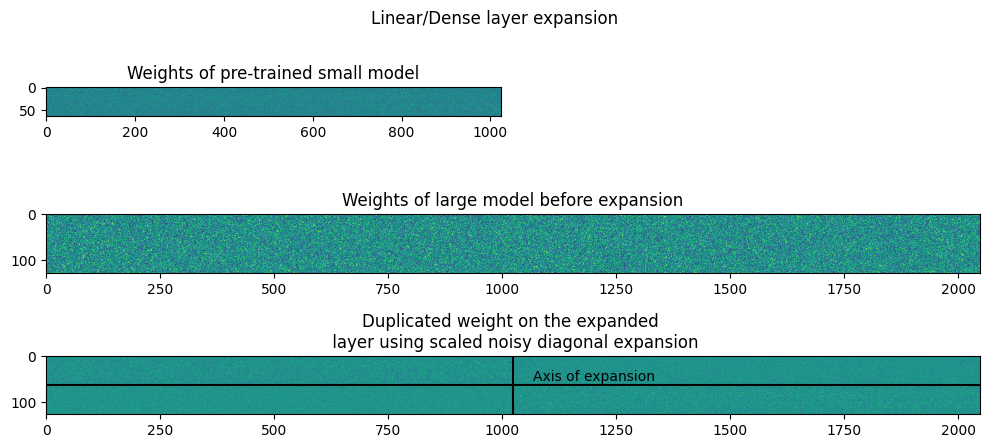

In [45]:
plt.figure(figsize=(10,6))

plt.subplot(421).set_title("Weights of pre-trained small model")
plt.imshow(np.transpose(model.layers[7].weights[0]))

plt.subplot(412).set_title("Weights of large model before expansion")
plt.imshow(np.transpose(dummy_model_2.layers[7].weights[0]))

plt.subplot(413).set_title("Duplicated weight on the expanded \n layer using scaled noisy diagonal expansion")
plt.imshow(np.transpose(expand_model_7.layers[7].weights[0]))
plt.axhline(64, color='k')
plt.text(1200, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)
plt.axvline(1024, color='k')

plt.suptitle("Linear/Dense layer expansion")
plt.tight_layout()
plt.show()

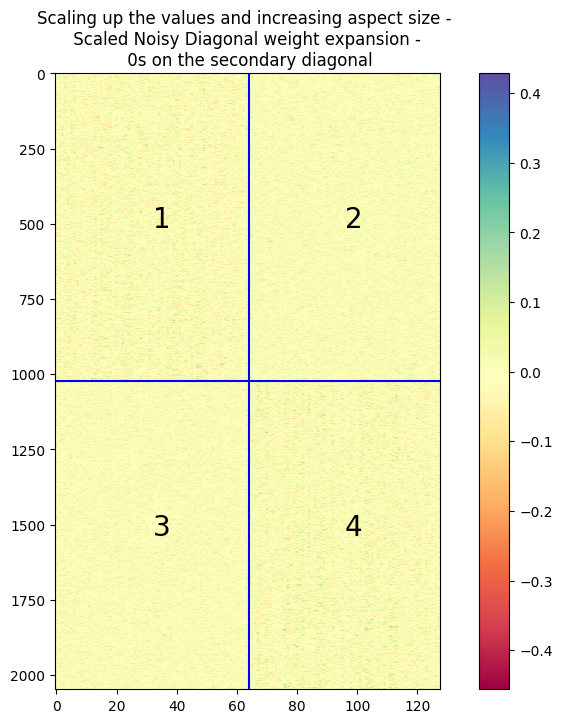

In [46]:
plt.figure(figsize=(10,8))
plt.imshow(expand_model_7.layers[7].weights[0], cmap='Spectral', aspect=0.10)
plt.colorbar()
plt.axhline(1024, color='b')
plt.axvline(64, color='b')
# plt.text(1500, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)
# plt.axvline(1024, color='b')
plt.text(32,512,1, color='k', fontsize=20)
plt.text(96,512,2, color='k', fontsize=20)
plt.text(32,1536,3, color='k', fontsize=20)
plt.text(96,1536,4, color='k', fontsize=20)
plt.title("Scaling up the values and increasing aspect size - \n Scaled Noisy Diagonal weight expansion - \n 0s on the secondary diagonal")
plt.show()

In [47]:
plt.figure(figsize=(10,8))
plt.imshow(expand_model_7.layers[7].weights[0][1024:,:64]  - expand_model_5.layers[7].weights[0][:1024,:64], cmap='Spectral', aspect=0.10)
plt.colorbar()
plt.title("Difference of Quarter 1 and Quarter 3")
plt.show()

NameError: name 'expand_model_5' is not defined

<Figure size 1000x800 with 0 Axes>

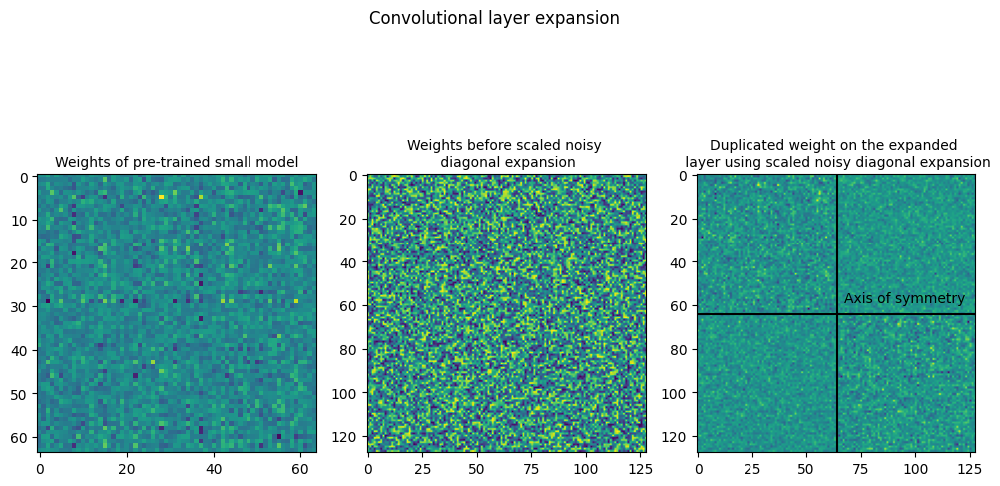

In [48]:
plt.figure(figsize=(10,6))

plt.subplot(131).set_title("Weights of pre-trained small model", fontsize=10)
plt.imshow(model.layers[5].weights[0][0,0,:,:])

plt.subplot(132).set_title("Weights before scaled noisy \n diagonal expansion", fontsize=10)
plt.imshow(dummy_model_2.layers[5].weights[0][0,0,:,:])

plt.subplot(133).set_title("Duplicated weight on the expanded \n layer using scaled noisy diagonal expansion", fontsize=10)
plt.imshow(expand_model_7.layers[5].weights[0][0,0,:,:])
plt.axhline(64, color='k')
plt.axvline(64, color='k')
plt.text(95, 60, 'Axis of symmetry', color='k', ha='center', va='bottom', rotation=0)

plt.suptitle("Convolutional layer expansion")
plt.tight_layout()
plt.show()

In [908]:
initial_learning_rate = 0.0001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_noisy_diagonal_exp_scale_noise" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")


mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()

expand_model_7.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [909]:
expand_model_7.evaluate(test_ds)

 27/313 [=>............................] - ETA: 1s - loss: 11.9474 - accuracy: 0.1134

2025-01-13 02:35:29.266522: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


313/313 [==============================] - 1s 3ms/step - loss: 11.9775 - accuracy: 0.1154


[11.977473258972168, 0.11540000140666962]

In [910]:
hist_large_exp_7 = expand_model_7.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
  10/1250 [..............................] - ETA: 6s - loss: 9.7998 - accuracy: 0.1125   

2025-01-13 02:35:37.234907: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 8s 6ms/step - loss: 2.3814 - accuracy: 0.2665 - val_loss: 1.8628 - val_accuracy: 0.3581
Epoch 2/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.7395 - accuracy: 0.3945 - val_loss: 1.7229 - val_accuracy: 0.4053
Epoch 3/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.6244 - accuracy: 0.4340 - val_loss: 1.6266 - val_accuracy: 0.4337
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.5770 - accuracy: 0.4507 - val_loss: 1.6019 - val_accuracy: 0.4423
Epoch 5/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.5556 - accuracy: 0.4586 - val_loss: 1.5893 - val_accuracy: 0.4475
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.5453 - accuracy: 0.4622 - val_loss: 1.5843 - val_accuracy: 0.4504
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.5404 - accuracy: 0.4625 - val_loss: 1.5825 - val_accuracy: 0.4524
Epo

In [911]:
large_noisy_diagonal_2_stats = ModelStats("large_expand_noisy_diagonal_lowerLR_scale_noise", hist_large_exp_7, time_callback, mem_callback)
large_noisy_diagonal_2_stats.save_stats()

#### Using a higher learning rate

In [918]:
expand_model_8 = get_large_model_2()
expand_model_8 = expand_model_weights_specific_layer(model, copy.deepcopy(expand_model_8), [3,5,7,8],[3,5,7,8],['symmetric','noisy_diagonal','noisy_diagonal','symmetric'], scaled_noise=True)


initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_noisy_diagonal_exp_scale_noise_highLR" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")


mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()

expand_model_8.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [919]:
expand_model_8.evaluate(test_ds)

 28/313 [=>............................] - ETA: 1s - loss: 9.1708 - accuracy: 0.0882

2025-01-13 02:41:17.491382: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


313/313 [==============================] - 1s 3ms/step - loss: 8.9966 - accuracy: 0.1006


[8.996622085571289, 0.1005999967455864]

In [920]:
hist_large_exp_8 = expand_model_8.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
   9/1250 [..............................] - ETA: 8s - loss: 6.6037 - accuracy: 0.0972  

2025-01-13 02:41:25.470689: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 8s 6ms/step - loss: 1.7600 - accuracy: 0.3855 - val_loss: 1.5674 - val_accuracy: 0.4750
Epoch 2/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.2960 - accuracy: 0.5482 - val_loss: 1.4367 - val_accuracy: 0.5344
Epoch 3/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.1301 - accuracy: 0.6150 - val_loss: 1.1692 - val_accuracy: 0.6199
Epoch 4/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.0432 - accuracy: 0.6509 - val_loss: 1.1559 - val_accuracy: 0.6257
Epoch 5/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0000 - accuracy: 0.6695 - val_loss: 1.1341 - val_accuracy: 0.6347
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 0.9783 - accuracy: 0.6776 - val_loss: 1.1271 - val_accuracy: 0.6392
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 0.9671 - accuracy: 0.6834 - val_loss: 1.1209 - val_accuracy: 0.6431
Epo

In [922]:
large_noisy_diagonal_stats_3 = ModelStats("large_expand_noisy_diagonal_highLR_scale_noise", hist_large_exp_8, time_callback, mem_callback)
large_noisy_diagonal_stats_3.save_stats()

After scaling of the noise, the SNR ratios are further lower. The comparison of the SNR methods with and without noise scaling are given below.

| Method | SNR Ratio ( Without scaling) | SNR Ratio ( Without scaling) |
| ------ | --------- | ------- |
| Noisy Symmetric | 7.562 | 0.639 |
| Noisy Diagonal |  7.599 | 0.09166 |

A comparison of the performance of the noisy Diagonal expansion with and without scaled noise is as given below. 

| Method | Validation Accuracy | Validation Loss |
| -------| --------- | ------------ |
| Diagonal - Without scaled noise | 10.86% | 2093.7175 |
| Diagonal - With scaled noise | 64.72% | 1.1190 |

A similar improvement is seen when scaled noise is used in the noisy diagonal expansion. The significant improvement in both the techniques shows that using scaled noise is more suitable for the expansion methods with noise. 

## Analysis

In [331]:
stats_1 = ModelStats("large_model_ref")
stats_1.read_stats()

stats_2 = ModelStats("large_expand_symmetric")
stats_2.read_stats()

stats_3 = ModelStats("large_expand_symmetric_lowerLR")
stats_3.read_stats()

stats_4 = ModelStats("large_expand_noisy_symmetric_lowerLR")
stats_4.read_stats()

stats_5 = ModelStats("large_expand_noisy_symmetric_highLR_scale_noise")
stats_5.read_stats()

stats_6 = ModelStats("large_expand_noisy_symmetric_lowerLR_scale_noise")
stats_6.read_stats()

stats_7 = ModelStats("large_expand_diagonal_lowerLR")
stats_7.read_stats()

stats_8 = ModelStats("large_expand_diagonal_2_lowerLR")
stats_8.read_stats()

stats_9 = ModelStats("large_expand_noisy_diagonal_lowerLR")
stats_9.read_stats()

stats_10 = ModelStats("large_expand_noisy_diagonal_highLR_scale_noise")
stats_10.read_stats()

stats_11 = ModelStats("large_expand_noisy_diagonal_lowerLR_scale_noise")
stats_11.read_stats()

In [332]:
stats = [stats_1, stats_2, stats_3, stats_4, stats_5, stats_6, stats_7, stats_8, stats_9, stats_10, stats_11]
labels = ["Large Model from scratch", "Symmetric Expansion - Higher Initial LR", "Symmetric expansion", "Noisy Symmetric","Noisy Symmetric with scaled noise - High initial LR", "Noisy Symmetric with scaled noise", 
          "Diagonal Expansion with Symmetric expansion for smaller layers", "Diagonal - Only Diagonal Expansion", "Noisy Diagonal", "Noisy Diagonal with scaled noise - High initial LR", "Noisy Diagonal with scaled noise"]
metrics = ["Validation Accuracy", "Validation Loss","Training Accuracy", "Training Loss"]
metric_keys = ["val_accuracy","val_loss","accuracy","loss"]


### Validation accuracy

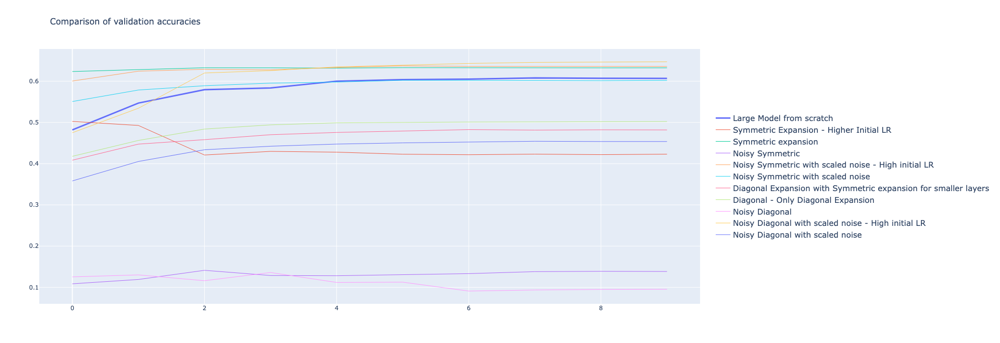

In [333]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[0]])))
    y = stats[j].hist[metric_keys[0]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16), height=700,width=1500,title="Comparison of validation accuracies")
fig.show()

### Validation loss

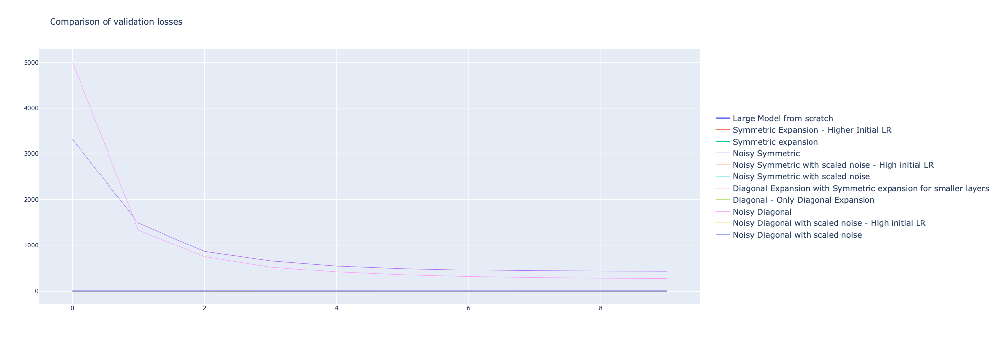

In [334]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[1]])))
    y = stats[j].hist[metric_keys[1]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16),height=700,width=1500, title="Comparison of validation losses")
fig.show()

### Training accuracy

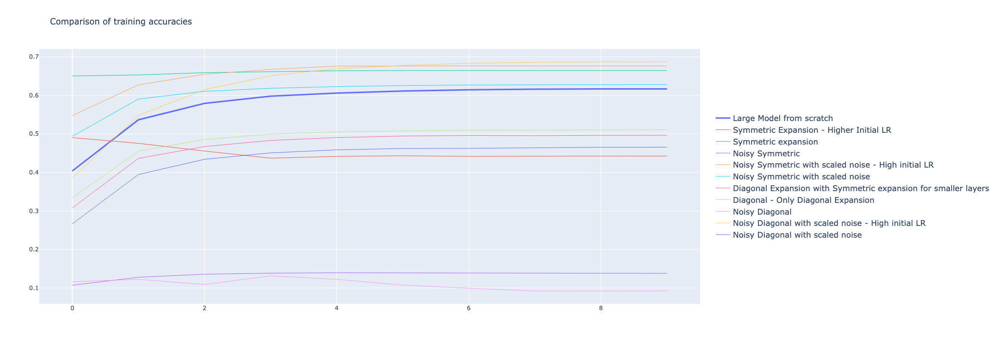

In [335]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[2]])))
    y = stats[j].hist[metric_keys[2]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16), height=700,width=1500, title="Comparison of training accuracies")
fig.show()

### Training loss

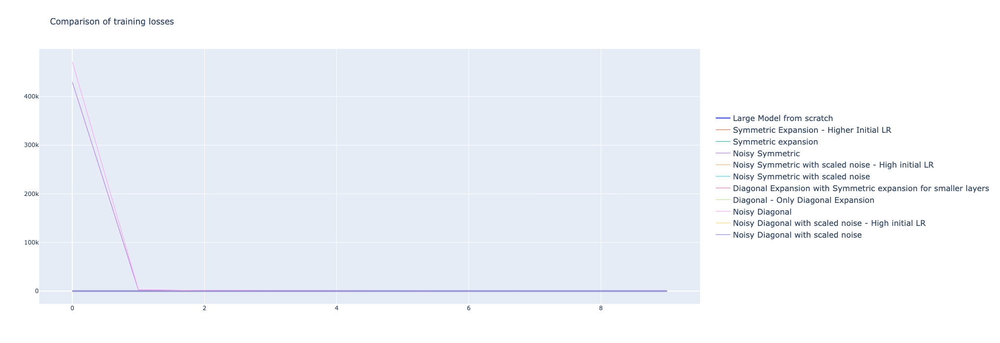

In [336]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[3]])))
    y = stats[j].hist[metric_keys[3]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16), height=700,width=1500,title="Comparison of training losses")
fig.show()

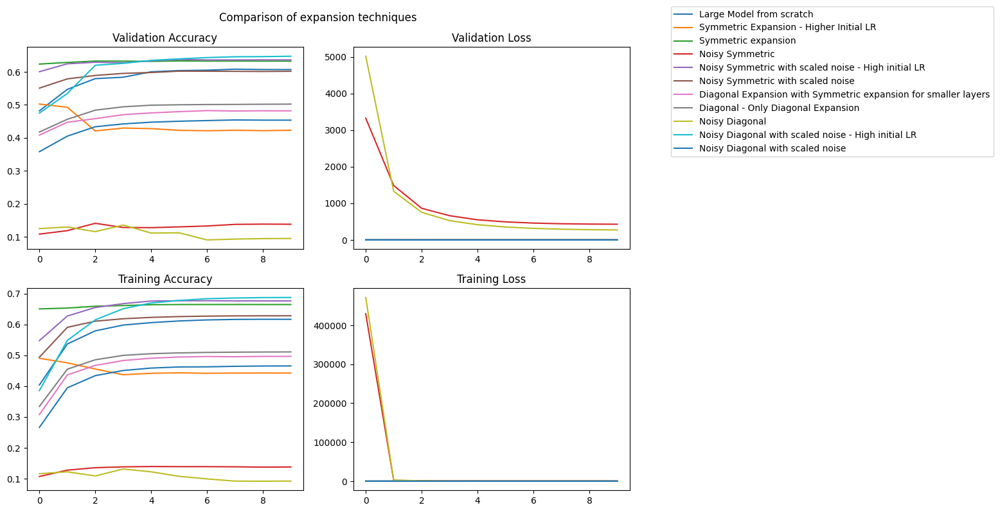

In [337]:
fig, ax = plt.subplots(2,2,figsize=(10,8))
for i in range(len(metrics)):
    ax = plt.subplot(2,2,i+1)
    for j in range(len(labels)):
        ax.plot(stats[j].hist[metric_keys[i]], label=labels[j])
    ax.set_title(metrics[i])
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(1.3, 1))
plt.suptitle("Comparison of expansion techniques")
plt.tight_layout()
plt.show()

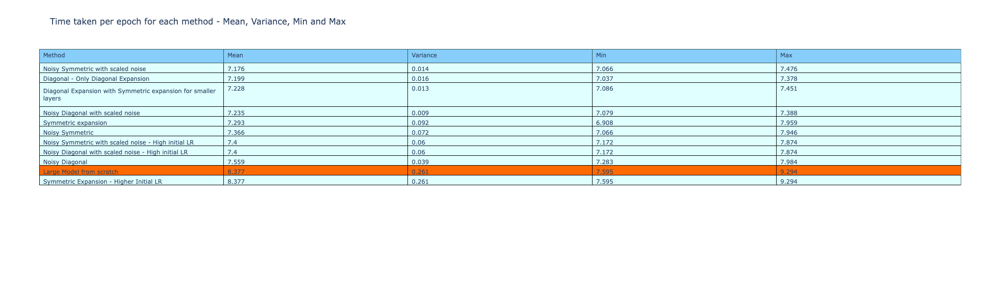

In [338]:
formatted_time = []
for i in range(len(labels)):
    time_i = stats[i].timeCB['time_taken']
    temp = []
    for j in range(1,len(time_i)):
        temp.append(time_i[j] - time_i[j-1])
    formatted_time.append(temp)

rows = []

for i in range(len(labels)):
    temp = []
    temp.append(labels[i])
    temp.append(str(round(np.mean(formatted_time[i]),3)))
    temp.append(str(round(np.var(formatted_time[i]),3)))
    temp.append(str(round(np.min(formatted_time[i]),3)))
    temp.append(str(round(np.max(formatted_time[i]),3)))
    rows.append(temp)

time_taken = pd.DataFrame(rows, columns=["Method","Mean","Variance", "Min", "Max"])

time_taken_sorted = time_taken.sort_values(by="Mean",ascending=True)

colors = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in time_taken_sorted.to_numpy()]

fig = go.Figure(data=[go.Table(
    header=dict(values=time_taken.columns,
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue',
               ),
    cells=dict(values=[time_taken_sorted["Method"],
                       time_taken_sorted["Mean"],
                       time_taken_sorted["Variance"],
                       time_taken_sorted["Min"],
                       time_taken_sorted["Max"]],
               align='left',
               fill_color=[colors],
               line_color='black'
              ),
)
])

fig.update_layout(
    height=600,
    width=1600,
    title="Time taken per epoch for each method - Mean, Variance, Min and Max"
)

fig.show()


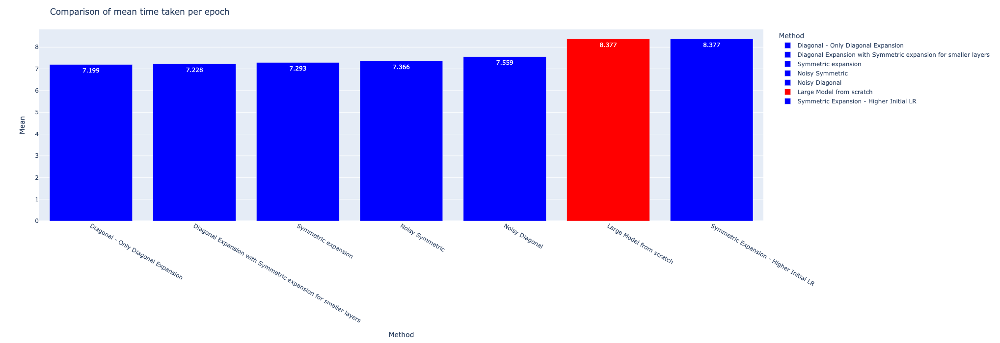

In [116]:
time_taken_sorted['Mean'] = pd.to_numeric(time_taken_sorted['Mean'])
color_bar = ['red' if x[0] == "Large Model from scratch" else 'blue' for x in time_taken_sorted.to_numpy()]
fig = px.bar(time_taken_sorted, x='Method', y='Mean', color="Method", color_discrete_sequence=color_bar, text_auto=True
            )
fig.update_layout(
    title="Comparison of mean time taken per epoch",
    height=700,
    width=2000,
)
fig.show()

In [156]:
table_rows = []
table_header = ["Method"]
table_header.extend(metrics)
table_header.append("Validation Accuracy after first epoch")

for i in range(len(labels)):
    temp = []
    temp.append(labels[i])
    for j in range(len(metrics)):
        temp.append(round(stats[i].hist[metric_keys[j]][-1],3))
    temp.append(round(stats[i].hist["val_accuracy"][0],3))
    table_rows.append(temp)


In [157]:
df = pd.DataFrame(table_rows, columns=table_header)
df_1 = df.sort_values(by="Validation Accuracy", ascending=False)
df_2 = df.sort_values(by="Validation Loss", ascending=True)
df_3 = df.sort_values(by="Validation Accuracy after first epoch", ascending=False)

In [158]:
colors_1 = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in df_1.to_numpy()]
colors_2 = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in df_2.to_numpy()]
colors_3 = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in df_3.to_numpy()]

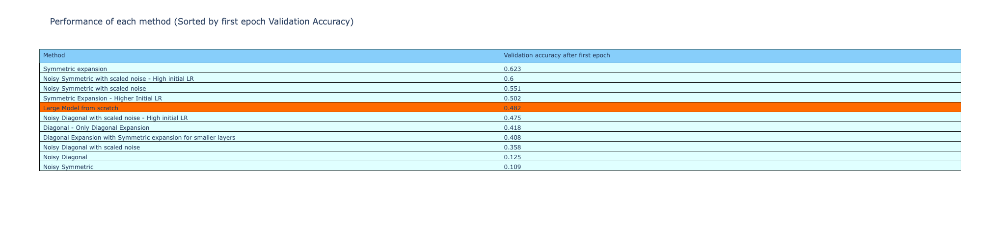

In [159]:
fig = go.Figure(data=[go.Table(
    header=dict(values=["Method","Validation accuracy after first epoch"],
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue'),
    cells=dict(values=[df_3["Method"],
                       df_3["Validation Accuracy after first epoch"]],
               align='left',
               fill_color=[colors_3],
               line_color='black'
              ),
)
])

fig.update_layout(
    height=500,
    width=1000,
    title="Performance of each method (Sorted by first epoch Validation Accuracy)"
)

fig.show()

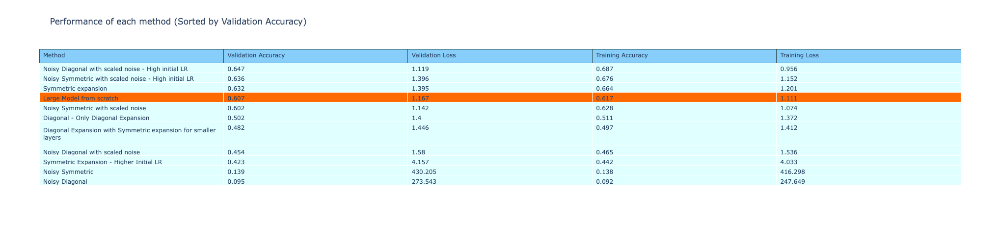

In [160]:
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_1.columns[:-1]),
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue'),
    cells=dict(values=[df_1["Method"], df_1["Validation Accuracy"], df_1["Validation Loss"], df_1["Training Accuracy"], df_1["Training Loss"]],
               align='left',
               line_color='white',
               fill_color=[colors_1]
              
              ))
])

fig.update_layout(
    height=500,
    width=2000,
    title="Performance of each method (Sorted by Validation Accuracy)"
)

fig.show()

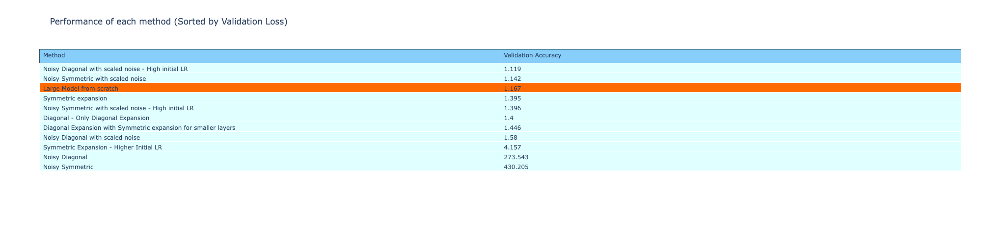

In [161]:
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_1.columns[:2]),
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue'),
    cells=dict(values=[df_2["Method"], df_2["Validation Loss"]],
               align='left',
               line_color='white',
               fill_color=[colors_2]
              
              ))
])

fig.update_layout(
    height=500,
    width=800,
    title="Performance of each method (Sorted by Validation Loss)"
)

fig.show()

In [102]:
stats = [stats_1, stats_2, stats_3, stats_5, stats_6, stats_7, stats_8, stats_10, stats_11]
labels = ["Large Model from scratch", "Symmetric Expansion - Higher Initial LR", "Symmetric expansion","Noisy Symmetric with scaled noise - High initial LR", "Noisy Symmetric with scaled noise", 
          "Diagonal Expansion with Symmetric expansion for smaller layers", "Diagonal - Only Diagonal Expansion", "Noisy Diagonal with scaled noise - High initial LR", "Noisy Diagonal with scaled noise"]
metrics = ["Validation Accuracy", "Validation Loss","Training Accuracy", "Training Loss"]
metric_keys = ["val_accuracy","val_loss","accuracy","loss"]

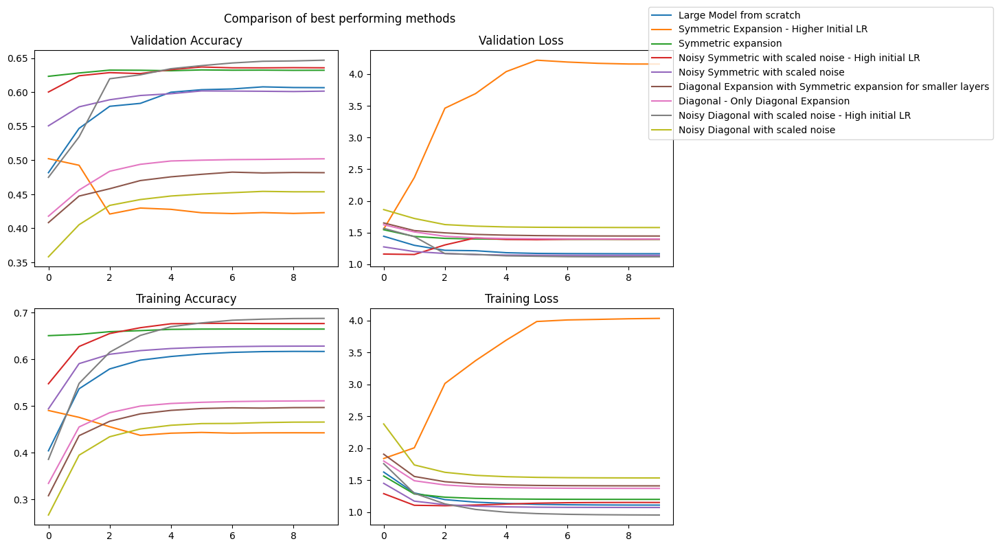

In [103]:
fig, ax = plt.subplots(2,2,figsize=(10,8))
for i in range(len(metrics)):
    ax = plt.subplot(2,2,i+1)
    for j in range(len(labels)):
        ax.plot(stats[j].hist[metric_keys[i]], label=labels[j])
    ax.set_title(metrics[i])

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(1.2, 1))
plt.suptitle("Comparison of best performing methods")
plt.tight_layout()
plt.show()

## Experiment - 4
## Custom envelope expansion

Similar to the weight expansion methods used in the previous experiments, I intend to test out another weight expansion technique which is an envelope expansion technique. It works by padding the original, smaller dimensional weight to fit the required shape for the larger layer. This allows the weights to be "function preserved", similar to the previous methods, while keeping the original weight untouched.

### Grad cam study

In [236]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
    grads = tape.gradient(class_channel, last_conv_layer_output)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

imgs = []
ct = 0
for x,y in train_ds:
    imgs.append(x)
    ct+=1
    if ct == 10:
        break

In [263]:
preprocess_input = keras.applications.xception.preprocess_input
decode_predictions = keras.applications.xception.decode_predictions
img_array = get_img_array(x)

model_large.layers[-1].activation = None

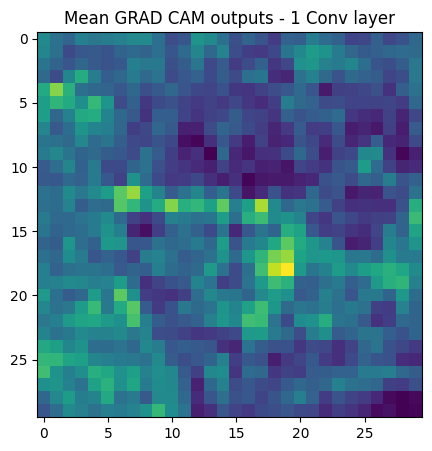

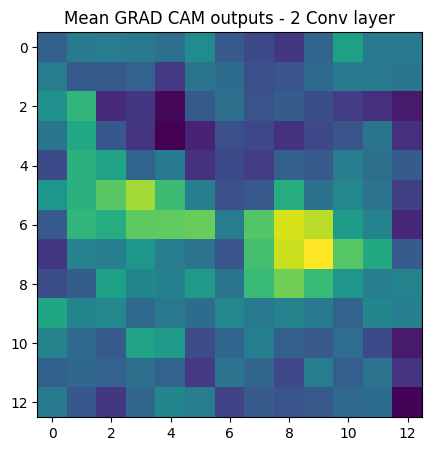

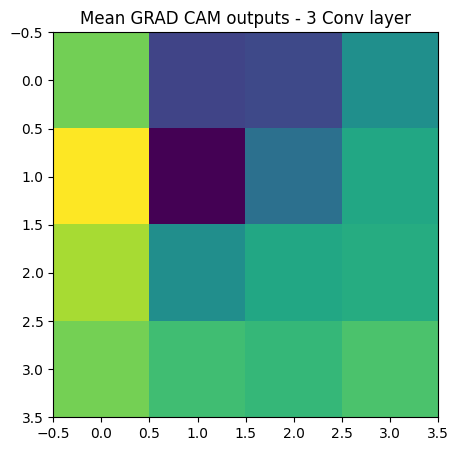

In [280]:
layers = ["conv2d_33", "conv2d_34", "conv2d_35"]
for l in range(len(layers)):
    heatmaps = []
    for i in range(len(imgs)):
        heatmap = make_gradcam_heatmap(imgs[i], model_large, layers[l])
        heatmaps.append(heatmap)
    
    heatmaps = np.array(heatmaps)
    
    mean_heatmap = np.mean(heatmaps, axis=0)
    plt.figure(figsize=(5,5))
    plt.imshow(mean_heatmap)
    plt.title("Mean GRAD CAM outputs - " + str(l+1) + " Conv layer")
    plt.show()

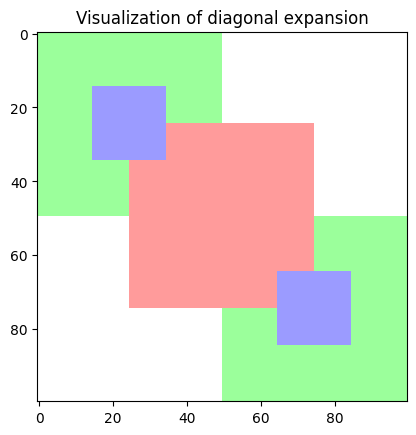

In [313]:
img_temp = np.zeros((100,100,4))
img_temp[:50,:50] = np.ones((50,50,4)) * (0,255,0,100)
img_temp[50:,50:] = np.ones((50,50,4)) * (0,255,0,100)

img_temp[25:75,25:75] = np.ones((50,50,4)) * (255,0,0,100)

img_temp[15:35,15:35] = np.ones((20,20,4)) * (0,0,255,100)
img_temp[65:85,65:85] = np.ones((20,20,4)) * (0,0,255,100)



img_temp =img_temp.astype(int)
plt.imshow(img_temp)
plt.title("Visualization of diagonal expansion")
plt.show()

In [385]:
dummy_model = get_large_model()
expand_layers = [3,5,7,8]
expand_model = expand_model_weights(model, copy.deepcopy(dummy_model), expand_layers,'envelope')

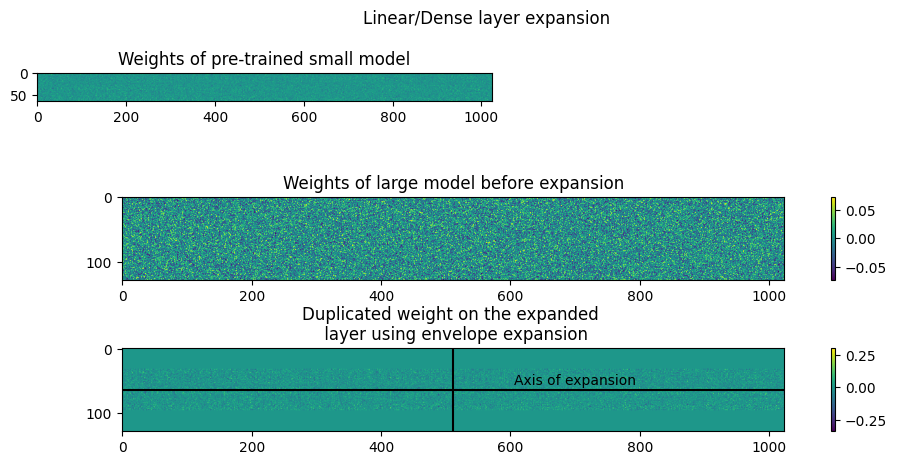

In [386]:
plt.figure(figsize=(10,6))

plt.subplot(421).set_title("Weights of pre-trained small model")
plt.imshow(np.transpose(model.layers[7].weights[0]))

plt.subplot(412).set_title("Weights of large model before expansion")
plt.imshow(np.transpose(dummy_model.layers[7].weights[0]))
plt.colorbar()


plt.subplot(413).set_title("Duplicated weight on the expanded \n layer using envelope expansion")
plt.imshow(np.transpose(expand_model.layers[7].weights[0]))
plt.axhline(64, color='k')
plt.text(700, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)
plt.axvline(512, color='k')

plt.suptitle("Linear/Dense layer expansion")
plt.tight_layout()
plt.colorbar()
plt.show()

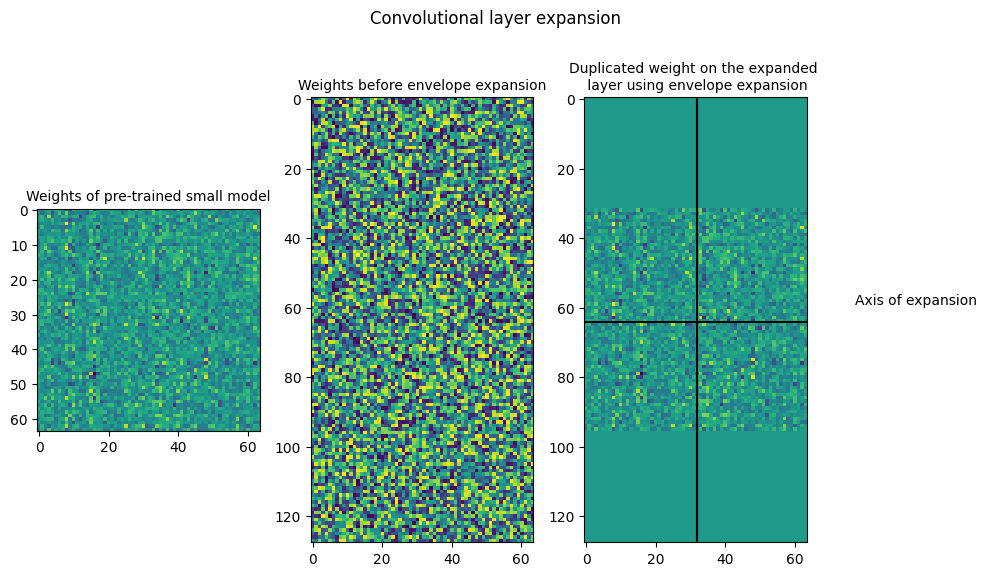

In [388]:
plt.figure(figsize=(10,6))

plt.subplot(131).set_title("Weights of pre-trained small model", fontsize=10)
plt.imshow(model.layers[5].weights[0][0,0,:,:])

plt.subplot(132).set_title("Weights before envelope expansion", fontsize=10)
plt.imshow(dummy_model.layers[5].weights[0][0,0,:,:])

plt.subplot(133).set_title("Duplicated weight on the expanded \n layer using envelope expansion", fontsize=10)
plt.imshow(expand_model.layers[5].weights[0][0,0,:,:])
plt.axhline(64, color='k')
plt.axvline(32, color='k')
plt.text(95, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)

plt.suptitle("Convolutional layer expansion")
plt.tight_layout()
plt.show()

### Higher Learning Rate

In [97]:
dummy_model = get_large_model()
expand_layers = [3,5,7,8]
expand_model = expand_model_weights(model, copy.deepcopy(dummy_model), expand_layers,'envelope')

In [98]:
initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_envelope_expansion_highLR" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()

expand_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [99]:
hist_large_exp_3 = expand_model.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
  10/1250 [..............................] - ETA: 7s - loss: 1.5943 - accuracy: 0.4594  

2025-01-15 23:20:50.696818: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1239/1250 [============================>.] - ETA: 0s - loss: 1.2188 - accuracy: 0.5676

2025-01-15 23:20:56.840742: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 7s 6ms/step - loss: 1.2178 - accuracy: 0.5680 - val_loss: 1.1595 - val_accuracy: 0.5907
Epoch 2/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0274 - accuracy: 0.6417 - val_loss: 1.1024 - val_accuracy: 0.6233
Epoch 3/10
1250/1250 [==============================] - 7s 5ms/step - loss: 0.9289 - accuracy: 0.6760 - val_loss: 1.0011 - val_accuracy: 0.6566
Epoch 4/10
1250/1250 [==============================] - 7s 5ms/step - loss: 0.8765 - accuracy: 0.6951 - val_loss: 0.9820 - val_accuracy: 0.6626
Epoch 5/10
1250/1250 [==============================] - 7s 6ms/step - loss: 0.8484 - accuracy: 0.7060 - val_loss: 0.9680 - val_accuracy: 0.6665
Epoch 6/10
1250/1250 [==============================] - 7s 5ms/step - loss: 0.8339 - accuracy: 0.7113 - val_loss: 0.9586 - val_accuracy: 0.6713
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 0.8267 - accuracy: 0.7135 - val_loss: 0.9534 - val_accuracy: 0.6719
Epo

In [100]:
large_diagonal_stats = ModelStats("large_expand_envelope_highLR", hist_large_exp_3, time_callback, mem_callback)
large_diagonal_stats.save_stats()

### Lower Learning Rate

In [101]:
dummy_model = get_large_model()
expand_layers = [3,5,7,8]
expand_model = expand_model_weights(model, copy.deepcopy(dummy_model), expand_layers,'envelope')

In [102]:
initial_learning_rate = 0.0001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_envelope_expansion_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()

expand_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [103]:
hist_large_exp_3 = expand_model.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
   9/1250 [..............................] - ETA: 7s - loss: 1.8179 - accuracy: 0.4306  

2025-01-15 23:21:59.598600: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1248/1250 [============================>.] - ETA: 0s - loss: 1.2017 - accuracy: 0.5744

2025-01-15 23:22:05.811997: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 7s 6ms/step - loss: 1.2016 - accuracy: 0.5744 - val_loss: 1.1887 - val_accuracy: 0.5778
Epoch 2/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.1315 - accuracy: 0.6007 - val_loss: 1.1573 - val_accuracy: 0.5937
Epoch 3/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.1084 - accuracy: 0.6099 - val_loss: 1.1446 - val_accuracy: 0.6002
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0974 - accuracy: 0.6139 - val_loss: 1.1392 - val_accuracy: 0.6022
Epoch 5/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.0920 - accuracy: 0.6159 - val_loss: 1.1360 - val_accuracy: 0.6032
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0894 - accuracy: 0.6166 - val_loss: 1.1341 - val_accuracy: 0.6042
Epoch 7/10
1250/1250 [==============================] - 7s 5ms/step - loss: 1.0880 - accuracy: 0.6175 - val_loss: 1.1333 - val_accuracy: 0.6047
Epo

In [104]:
large_diagonal_stats = ModelStats("large_expand_envelope", hist_large_exp_3, time_callback, mem_callback)
large_diagonal_stats.save_stats()

### Noisy envelope

In [390]:
dummy_model_1 = get_large_model()
expand_layers = [3,5,7,8]
expand_model_1 = expand_model_weights(model, copy.deepcopy(dummy_model_1), expand_layers,'noisy_envelope')

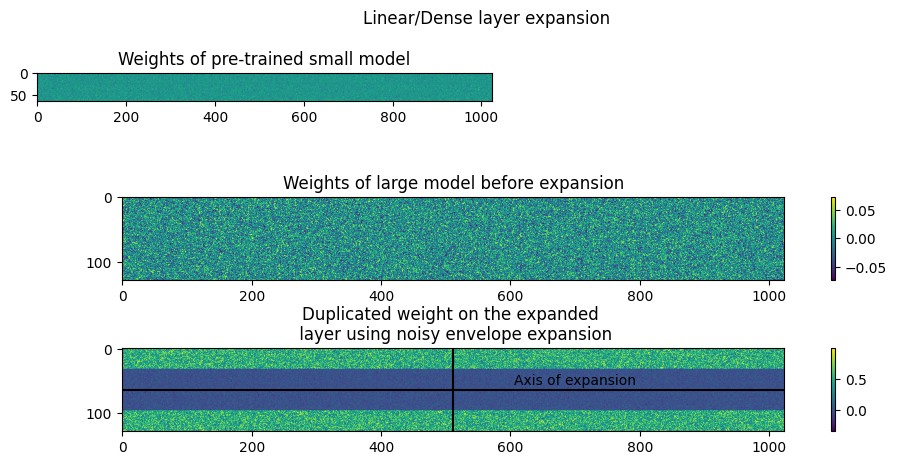

In [391]:
plt.figure(figsize=(10,6))

plt.subplot(421).set_title("Weights of pre-trained small model")
plt.imshow(np.transpose(model.layers[7].weights[0]))

plt.subplot(412).set_title("Weights of large model before expansion")
plt.imshow(np.transpose(dummy_model_1.layers[7].weights[0]))
plt.colorbar()


plt.subplot(413).set_title("Duplicated weight on the expanded \n layer using noisy envelope expansion")
plt.imshow(np.transpose(expand_model_1.layers[7].weights[0]))
plt.axhline(64, color='k')
plt.text(700, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)
plt.axvline(512, color='k')

plt.suptitle("Linear/Dense layer expansion")
plt.tight_layout()
plt.colorbar()
plt.show()

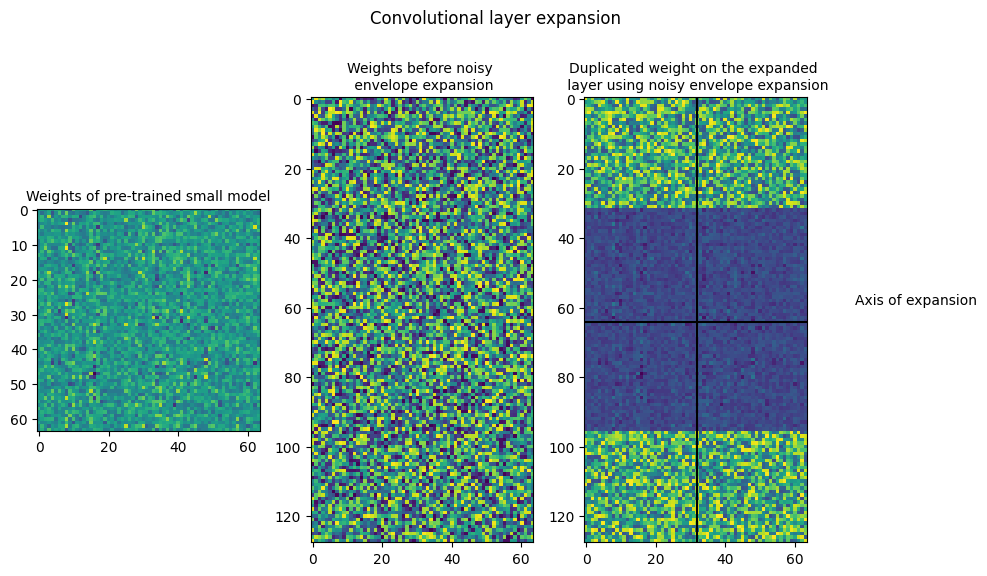

In [393]:
plt.figure(figsize=(10,6))

plt.subplot(131).set_title("Weights of pre-trained small model", fontsize=10)
plt.imshow(model.layers[5].weights[0][0,0,:,:])

plt.subplot(132).set_title("Weights before noisy \n envelope expansion", fontsize=10)
plt.imshow(dummy_model_1.layers[5].weights[0][0,0,:,:])

plt.subplot(133).set_title("Duplicated weight on the expanded \n layer using noisy envelope expansion", fontsize=10)
plt.imshow(expand_model_1.layers[5].weights[0][0,0,:,:])
plt.axhline(64, color='k')
plt.axvline(32, color='k')
plt.text(95, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)

plt.suptitle("Convolutional layer expansion")
plt.tight_layout()
plt.show()

### Higher Learning Rate

In [112]:
dummy_model_1 = get_large_model()
expand_layers = [3,5,7,8]
expand_model_1 = expand_model_weights(model, copy.deepcopy(dummy_model_1), expand_layers,'noisy_envelope')

In [113]:
initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_noisy_envelope_expansion_highLR" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()

expand_model_1.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [114]:
hist_large_exp_4 = expand_model_1.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
   9/1250 [..............................] - ETA: 8s - loss: 2260720.0000 - accuracy: 0.0694  

2025-01-15 23:25:56.171329: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1244/1250 [============================>.] - ETA: 0s - loss: 21898.9219 - accuracy: 0.1048

2025-01-15 23:26:02.759726: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 8s 6ms/step - loss: 21793.8281 - accuracy: 0.1050 - val_loss: 50.4606 - val_accuracy: 0.1004
Epoch 2/10
1250/1250 [==============================] - 7s 6ms/step - loss: 16.7124 - accuracy: 0.1015 - val_loss: 22.1988 - val_accuracy: 0.1004
Epoch 3/10
1250/1250 [==============================] - 7s 6ms/step - loss: 7.8077 - accuracy: 0.0990 - val_loss: 16.4861 - val_accuracy: 0.1002
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 5.8221 - accuracy: 0.0986 - val_loss: 13.2002 - val_accuracy: 0.0975
Epoch 5/10
1250/1250 [==============================] - 8s 6ms/step - loss: 4.9054 - accuracy: 0.1005 - val_loss: 11.4210 - val_accuracy: 0.0974
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 4.4988 - accuracy: 0.1008 - val_loss: 10.5783 - val_accuracy: 0.0974
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 4.2913 - accuracy: 0.1009 - val_loss: 9.9088 - val_accuracy:

In [115]:
large_diagonal_stats = ModelStats("large_expand_noisy_envelope_highLR", hist_large_exp_4, time_callback, mem_callback)
large_diagonal_stats.save_stats()

### Lower Learning Rate

In [116]:
dummy_model = get_large_model()
expand_layers = [3,5,7,8]
expand_model_2 = expand_model_weights(model, copy.deepcopy(dummy_model), expand_layers,'noisy_envelope')

In [117]:
initial_learning_rate = 0.0001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_noisy_envelope_expansion_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()

expand_model_2.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [118]:
hist_large_exp_5 = expand_model_2.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
  10/1250 [..............................] - ETA: 7s - loss: 2590102.0000 - accuracy: 0.0750  

2025-01-15 23:27:26.391351: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1241/1250 [============================>.] - ETA: 0s - loss: 137044.8125 - accuracy: 0.1129

2025-01-15 23:27:33.186502: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 8s 6ms/step - loss: 136090.6719 - accuracy: 0.1133 - val_loss: 4793.7529 - val_accuracy: 0.1333
Epoch 2/10
1250/1250 [==============================] - 7s 6ms/step - loss: 2497.8760 - accuracy: 0.1458 - val_loss: 1158.3586 - val_accuracy: 0.1384
Epoch 3/10
1250/1250 [==============================] - 8s 6ms/step - loss: 564.3854 - accuracy: 0.1407 - val_loss: 227.5324 - val_accuracy: 0.1409
Epoch 4/10
1250/1250 [==============================] - 8s 6ms/step - loss: 186.0347 - accuracy: 0.1378 - val_loss: 167.1096 - val_accuracy: 0.1421
Epoch 5/10
1250/1250 [==============================] - 8s 6ms/step - loss: 147.9862 - accuracy: 0.1406 - val_loss: 142.3974 - val_accuracy: 0.1401
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 130.2130 - accuracy: 0.1424 - val_loss: 130.6024 - val_accuracy: 0.1403
Epoch 7/10
1250/1250 [==============================] - 7s 6ms/step - loss: 120.8655 - accuracy: 0.1447 - val_loss: 1

In [119]:
large_diagonal_stats = ModelStats("large_expand_noisy_envelope", hist_large_exp_5, time_callback, mem_callback)
large_diagonal_stats.save_stats()

###  Noisy envelope - Scaled noise

In [48]:
dummy_model_2 = get_large_model()
expand_layers = [3,5,7,8]
expand_model_2 = expand_model_weights(model, copy.deepcopy(dummy_model_2), expand_layers,'noisy_envelope', scaled_noise=True)

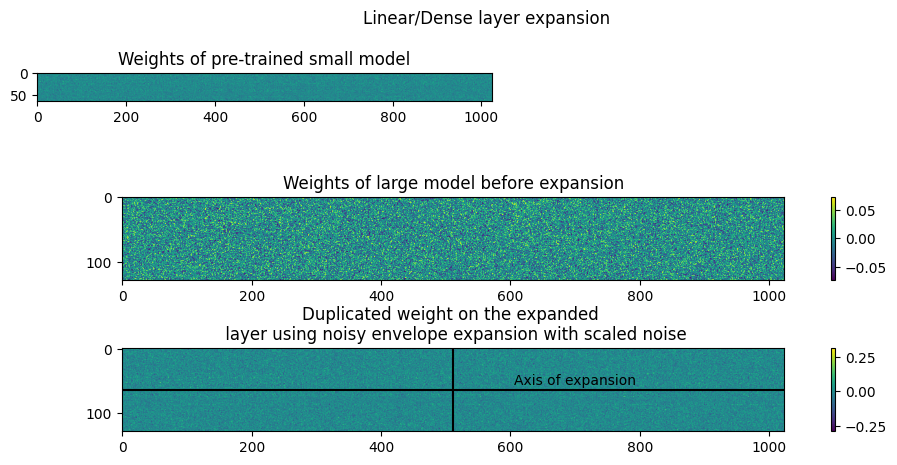

In [49]:
plt.figure(figsize=(10,6))

plt.subplot(421).set_title("Weights of pre-trained small model")
plt.imshow(np.transpose(model.layers[7].weights[0]))

plt.subplot(412).set_title("Weights of large model before expansion")
plt.imshow(np.transpose(dummy_model_2.layers[7].weights[0]))
plt.colorbar()


plt.subplot(413).set_title("Duplicated weight on the expanded \n layer using noisy envelope expansion with scaled noise")
plt.imshow(np.transpose(expand_model_2.layers[7].weights[0]))
plt.axhline(64, color='k')
plt.text(700, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)
plt.axvline(512, color='k')

plt.suptitle("Linear/Dense layer expansion")
plt.tight_layout()
plt.colorbar()
plt.show()

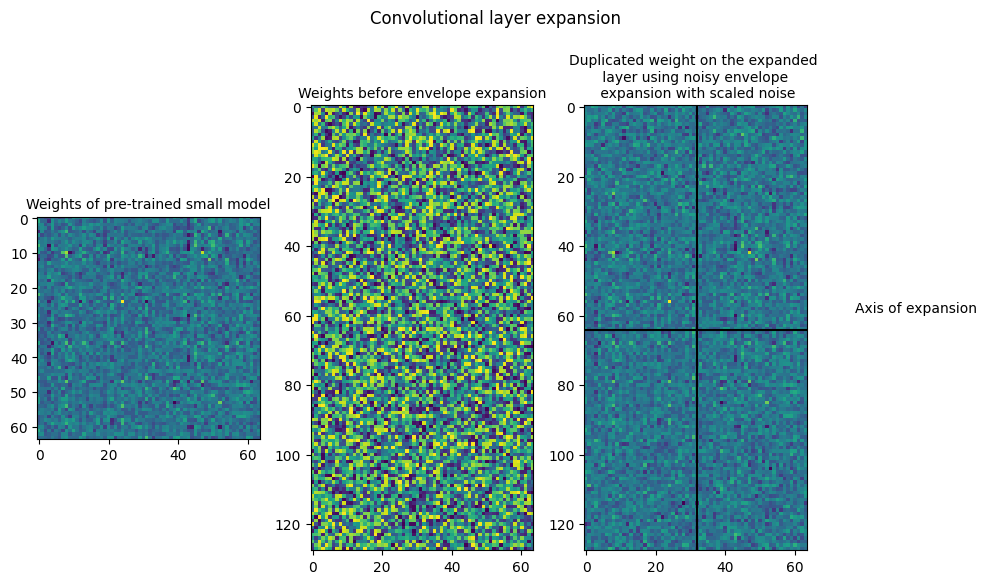

In [50]:
plt.figure(figsize=(10,6))

plt.subplot(131).set_title("Weights of pre-trained small model", fontsize=10)
plt.imshow(model.layers[5].weights[0][0,0,:,:])

plt.subplot(132).set_title("Weights before envelope expansion", fontsize=10)
plt.imshow(dummy_model_2.layers[5].weights[0][0,0,:,:])

plt.subplot(133).set_title("Duplicated weight on the expanded \n layer using noisy envelope \n expansion with scaled noise", fontsize=10)
plt.imshow(expand_model_2.layers[5].weights[0][0,0,:,:])
plt.axhline(64, color='k')
plt.axvline(32, color='k')
plt.text(95, 60, 'Axis of expansion', color='k', ha='center', va='bottom', rotation=0)

plt.suptitle("Convolutional layer expansion")
plt.tight_layout()
plt.show()

### Higher Learning Rate

In [60]:
dummy_model_2 = get_large_model()
expand_layers = [3,5,7,8]
expand_model_2 = expand_model_weights(model, copy.deepcopy(dummy_model_2), expand_layers,'noisy_envelope', scaled_noise=True)

In [61]:
initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_noisy_envelope_expansion_scaled_noise_highLR" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()

expand_model_2.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [64]:
hist_large_exp_6 = expand_model_2.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.0942 - accuracy: 0.6640 - val_loss: 1.2810 - val_accuracy: 0.6307
Epoch 2/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.0942 - accuracy: 0.6639 - val_loss: 1.2810 - val_accuracy: 0.6308
Epoch 3/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0941 - accuracy: 0.6640 - val_loss: 1.2810 - val_accuracy: 0.6308
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0941 - accuracy: 0.6640 - val_loss: 1.2810 - val_accuracy: 0.6308
Epoch 5/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0941 - accuracy: 0.6640 - val_loss: 1.2810 - val_accuracy: 0.6308
Epoch 6/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0941 - accuracy: 0.6640 - val_loss: 1.2810 - val_accuracy: 0.6308
Epoch 7/10
1243/1250 [============================>.] - ETA: 0s - loss: 1.0945 - accuracy: 0.6640

KeyboardInterrupt: 

In [128]:
large_diagonal_stats = ModelStats("large_expand_noisy_envelope_scaled_noise_highLR", hist_large_exp_6, time_callback, mem_callback)
large_diagonal_stats.save_stats()

### Lower Learning Rate

In [57]:
dummy_model_2 = get_large_model()
expand_layers = [3,5,7,8]
expand_model_2 = expand_model_weights(model, copy.deepcopy(dummy_model_2), expand_layers,'noisy_envelope', scaled_noise=True)

In [58]:
initial_learning_rate = 0.0001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

log_dir = "logs/fit/large_model_noisy_envelope_scaled_nois_expansion_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

mem_callback = TrackMemoryCallback()

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

time_callback = TimeCallback()

expand_model_2.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [63]:
hist_large_exp_7 = expand_model_2.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, tb_callback, time_callback])

Epoch 1/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.0942 - accuracy: 0.6635 - val_loss: 1.2810 - val_accuracy: 0.6305
Epoch 2/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.0943 - accuracy: 0.6640 - val_loss: 1.2810 - val_accuracy: 0.6308
Epoch 3/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.0943 - accuracy: 0.6637 - val_loss: 1.2810 - val_accuracy: 0.6306
Epoch 4/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0942 - accuracy: 0.6636 - val_loss: 1.2810 - val_accuracy: 0.6305
Epoch 5/10
1250/1250 [==============================] - 8s 6ms/step - loss: 1.0942 - accuracy: 0.6637 - val_loss: 1.2810 - val_accuracy: 0.6306
Epoch 6/10
 423/1250 [=========>....................] - ETA: 4s - loss: 1.1032 - accuracy: 0.6604

KeyboardInterrupt: 

In [132]:
large_diagonal_stats = ModelStats("large_expand_noisy_scaled_noise_envelope", hist_large_exp_7, time_callback, mem_callback)
large_diagonal_stats.save_stats()

## Analysis

In [401]:
stats_1 = ModelStats("large_model_ref")
stats_1.read_stats()

stats_2 = ModelStats("large_expand_symmetric")
stats_2.read_stats()

stats_3 = ModelStats("large_expand_symmetric_lowerLR")
stats_3.read_stats()

stats_4 = ModelStats("large_expand_noisy_symmetric_lowerLR")
stats_4.read_stats()

stats_5 = ModelStats("large_expand_noisy_symmetric_highLR_scale_noise")
stats_5.read_stats()

stats_6 = ModelStats("large_expand_noisy_symmetric_lowerLR_scale_noise")
stats_6.read_stats()

stats_7 = ModelStats("large_expand_diagonal_lowerLR")
stats_7.read_stats()

stats_8 = ModelStats("large_expand_diagonal_2_lowerLR")
stats_8.read_stats()

stats_9 = ModelStats("large_expand_noisy_diagonal_lowerLR")
stats_9.read_stats()

stats_10 = ModelStats("large_expand_noisy_diagonal_highLR_scale_noise")
stats_10.read_stats()

stats_11 = ModelStats("large_expand_envelope_highLR")
stats_11.read_stats()

stats_12 = ModelStats("large_expand_envelope")
stats_12.read_stats()

# stats_13 = ModelStats("large_expand_noisy_envelope_highLR")
# stats_13.read_stats()

# stats_14 = ModelStats("large_expand_noisy_envelope")
# stats_14.read_stats()

stats_15 = ModelStats("large_expand_noisy_envelope_scaled_noise_highLR")
stats_15.read_stats()

stats_16 = ModelStats("large_expand_noisy_scaled_noise_envelope")
stats_16.read_stats()



In [402]:
stats = [stats_1, stats_2, stats_3, stats_5, stats_6, stats_7, stats_8, stats_9, stats_10, stats_11, stats_12, stats_15, stats_16]
labels = ["Large Model from scratch", "Symmetric Expansion - Higher Initial LR", "Symmetric expansion","Noisy Symmetric with scaled noise - High initial LR", "Noisy Symmetric with scaled noise", 
          "Diagonal Expansion with Symmetric expansion for smaller layers", "Diagonal - Only Diagonal Expansion", "Noisy Diagonal with scaled noise - High initial LR",
          "Envelope expansion - High initial LR", "Envelope expansion", "Noisy envelope with scaled noise - High Initial LR", "Noisy envelope with scaled noise" 
         ]
metrics = ["Validation Accuracy", "Validation Loss","Training Accuracy", "Training Loss"]
metric_keys = ["val_accuracy","val_loss","accuracy","loss"]


### Validation accuracy

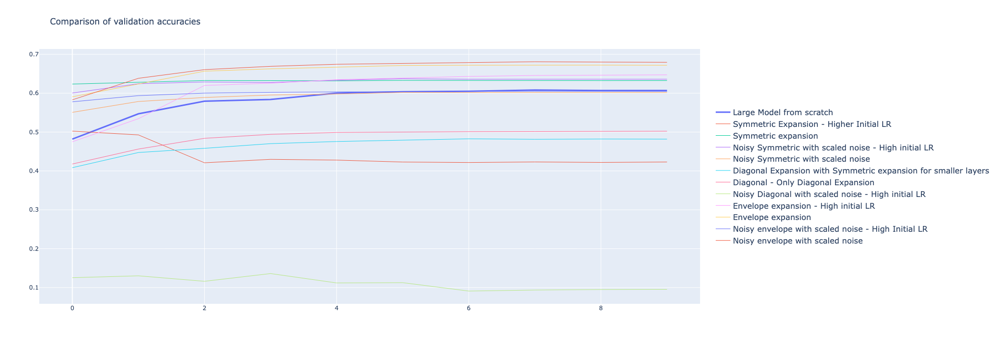

In [403]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[0]])))
    y = stats[j].hist[metric_keys[0]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16), height=700,width=1500,title="Comparison of validation accuracies")
fig.show()

### Validation loss

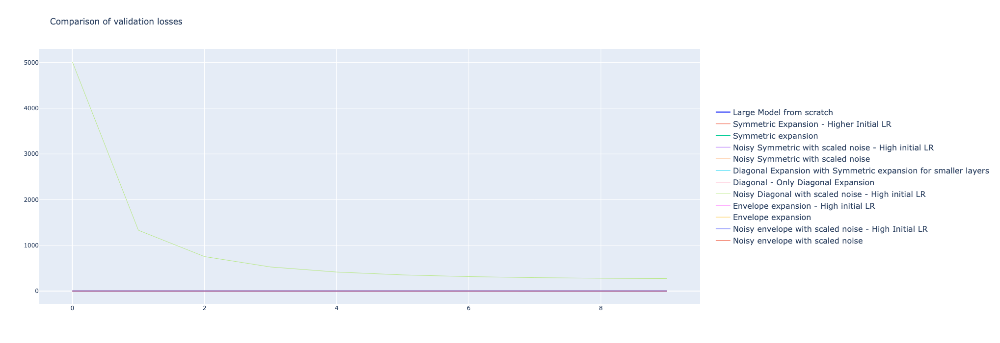

In [404]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[1]])))
    y = stats[j].hist[metric_keys[1]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16),height=700,width=1500, title="Comparison of validation losses")
fig.show()

### Training accuracy

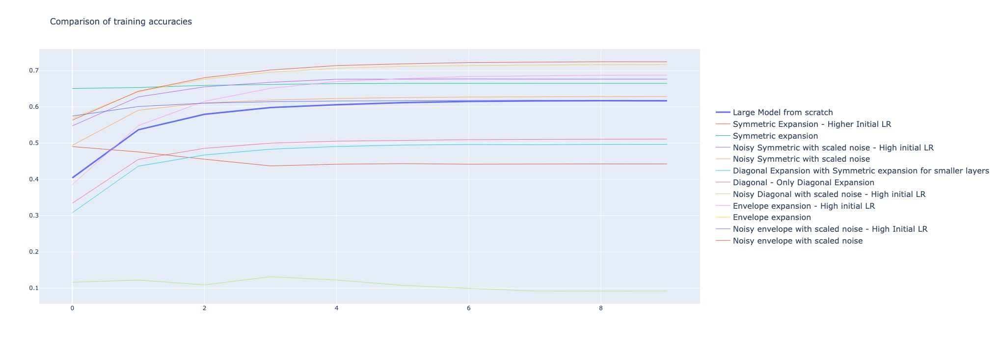

In [405]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[2]])))
    y = stats[j].hist[metric_keys[2]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16), height=700,width=1500, title="Comparison of training accuracies")
fig.show()

### Training loss

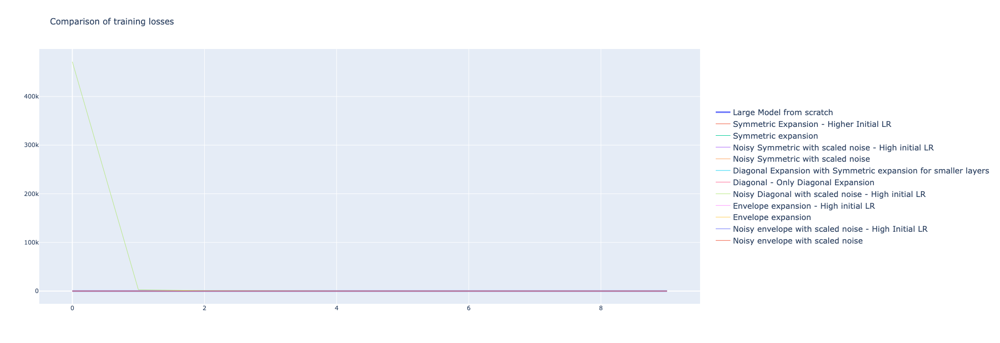

In [406]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[3]])))
    y = stats[j].hist[metric_keys[3]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16), height=700,width=1500,title="Comparison of training losses")
fig.show()

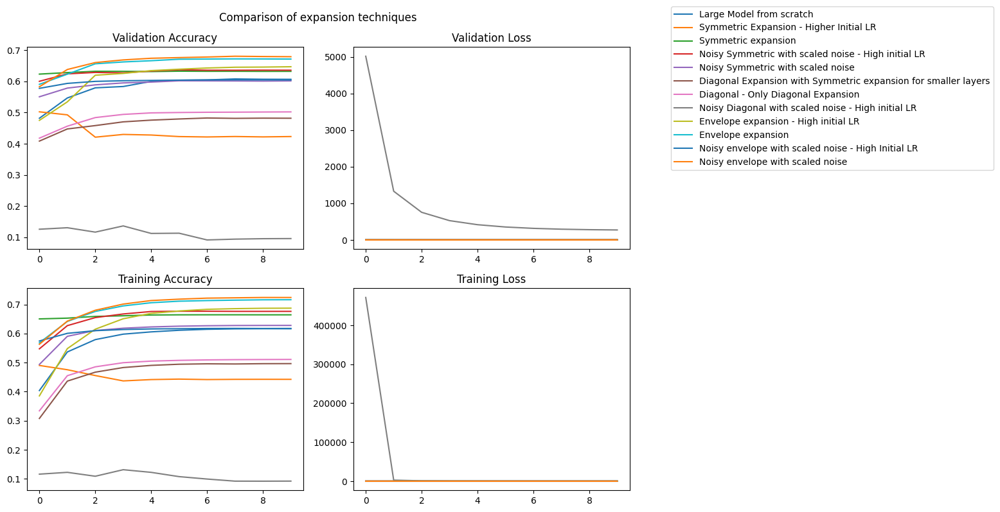

In [407]:
fig, ax = plt.subplots(2,2,figsize=(10,8))
for i in range(len(metrics)):
    ax = plt.subplot(2,2,i+1)
    for j in range(len(labels)):
        ax.plot(stats[j].hist[metric_keys[i]], label=labels[j])
    ax.set_title(metrics[i])
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(1.3, 1))
plt.suptitle("Comparison of expansion techniques")
plt.tight_layout()
plt.show()

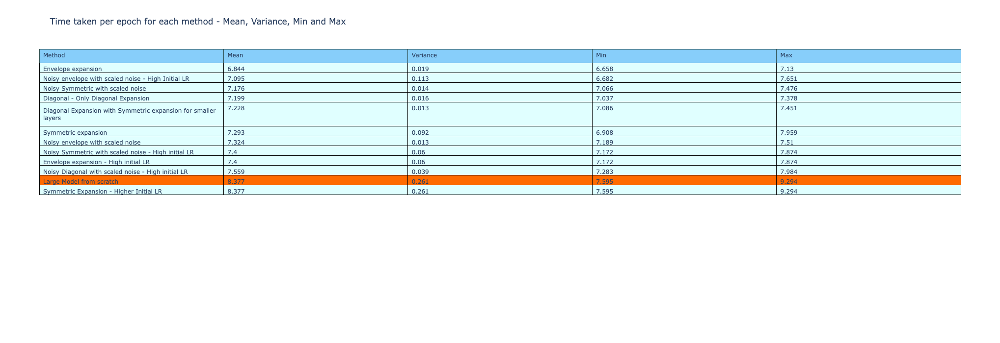

In [408]:
formatted_time = []
for i in range(len(labels)):
    time_i = stats[i].timeCB['time_taken']
    temp = []
    for j in range(1,len(time_i)):
        temp.append(time_i[j] - time_i[j-1])
    formatted_time.append(temp)

rows = []

for i in range(len(labels)):
    temp = []
    temp.append(labels[i])
    temp.append(str(round(np.mean(formatted_time[i]),3)))
    temp.append(str(round(np.var(formatted_time[i]),3)))
    temp.append(str(round(np.min(formatted_time[i]),3)))
    temp.append(str(round(np.max(formatted_time[i]),3)))
    rows.append(temp)

time_taken = pd.DataFrame(rows, columns=["Method","Mean","Variance", "Min", "Max"])

time_taken_sorted = time_taken.sort_values(by="Mean",ascending=True)

colors = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in time_taken_sorted.to_numpy()]

fig = go.Figure(data=[go.Table(
    header=dict(values=time_taken.columns,
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue',
               ),
    cells=dict(values=[time_taken_sorted["Method"],
                       time_taken_sorted["Mean"],
                       time_taken_sorted["Variance"],
                       time_taken_sorted["Min"],
                       time_taken_sorted["Max"]],
               align='left',
               fill_color=[colors],
               line_color='black'
              ),
)
])

fig.update_layout(
    height=700,
    width=1600,
    title="Time taken per epoch for each method - Mean, Variance, Min and Max"
)

fig.show()


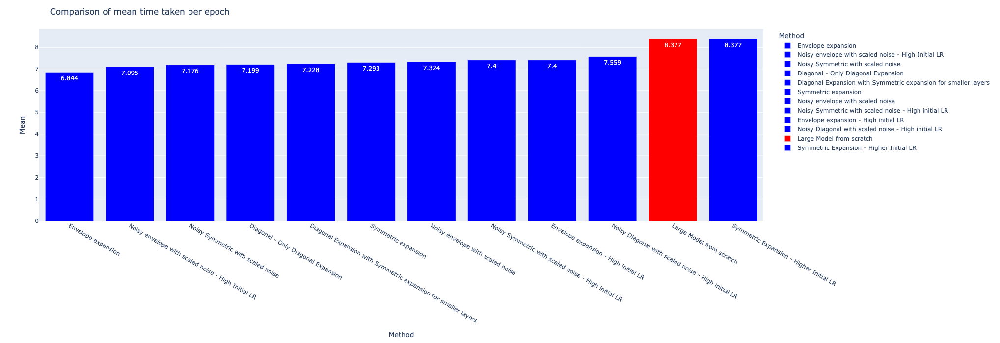

In [417]:
time_taken_sorted['Mean'] = pd.to_numeric(time_taken_sorted['Mean'])
color_bar = ['red' if x[0] == "Large Model from scratch" else 'blue' for x in time_taken_sorted.to_numpy()]
fig = px.bar(time_taken_sorted, x='Method', y='Mean', color="Method", color_discrete_sequence=color_bar, text_auto=True
            )
fig.update_layout(
    title="Comparison of mean time taken per epoch",
    height=700,
    width=1500,
)
fig.show()

In [410]:
table_rows = []
table_header = ["Method"]
table_header.extend(metrics)
table_header.append("Validation Accuracy after first epoch")

for i in range(len(labels)):
    temp = []
    temp.append(labels[i])
    for j in range(len(metrics)):
        temp.append(round(stats[i].hist[metric_keys[j]][-1],3))
    temp.append(round(stats[i].hist["val_accuracy"][0],3))
    table_rows.append(temp)


In [411]:
df = pd.DataFrame(table_rows, columns=table_header)
df_1 = df.sort_values(by="Validation Accuracy", ascending=False)
df_2 = df.sort_values(by="Validation Loss", ascending=True)
df_3 = df.sort_values(by="Validation Accuracy after first epoch", ascending=False)

In [412]:
colors_1 = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in df_1.to_numpy()]
colors_2 = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in df_2.to_numpy()]
colors_3 = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in df_3.to_numpy()]

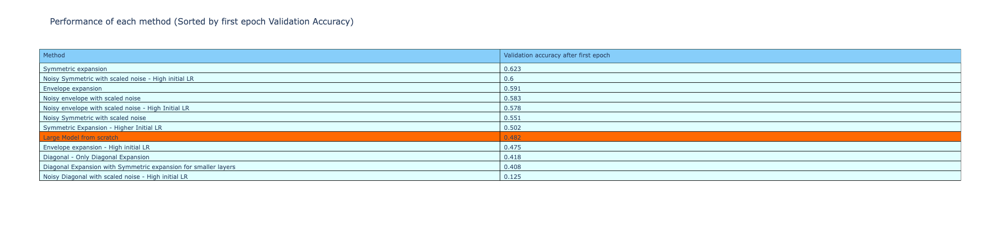

In [413]:
fig = go.Figure(data=[go.Table(
    header=dict(values=["Method","Validation accuracy after first epoch"],
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue'),
    cells=dict(values=[df_3["Method"],
                       df_3["Validation Accuracy after first epoch"]],
               align='left',
               fill_color=[colors_3],
               line_color='black'
              ),
)
])

fig.update_layout(
    height=500,
    width=1000,
    title="Performance of each method (Sorted by first epoch Validation Accuracy)"
)

fig.show()

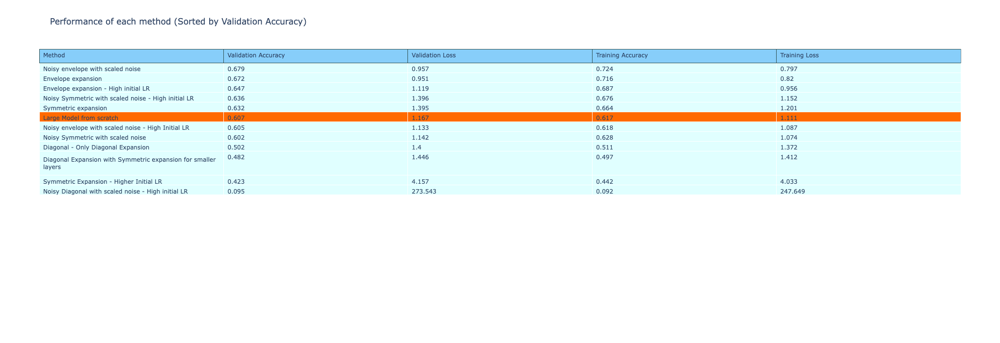

In [414]:
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_1.columns[:-1]),
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue'),
    cells=dict(values=[df_1["Method"], df_1["Validation Accuracy"], df_1["Validation Loss"], df_1["Training Accuracy"], df_1["Training Loss"]],
               align='left',
               line_color='white',
               fill_color=[colors_1]
              
              ))
])

fig.update_layout(
    height=700,
    width=1500,
    title="Performance of each method (Sorted by Validation Accuracy)"
)

fig.show()

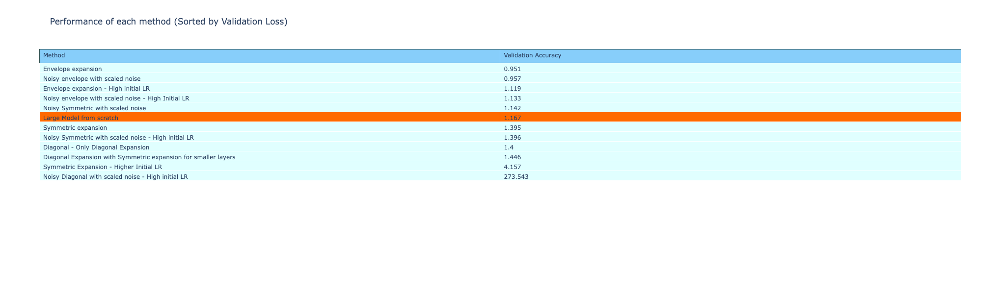

In [416]:
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_1.columns[:2]),
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue'),
    cells=dict(values=[df_2["Method"], df_2["Validation Loss"]],
               align='left',
               line_color='white',
               fill_color=[colors_2]
              
              ))
])

fig.update_layout(
    height=600,
    width=800,
    title="Performance of each method (Sorted by Validation Loss)"
)

fig.show()

In [362]:
stats = [stats_1, stats_2, stats_3, stats_5, stats_6, stats_7, stats_8, stats_10, stats_11]
labels = ["Large Model from scratch", "Symmetric Expansion - Higher Initial LR", "Symmetric expansion","Noisy Symmetric with scaled noise - High initial LR", "Noisy Symmetric with scaled noise", 
          "Diagonal Expansion with Symmetric expansion for smaller layers", "Diagonal - Only Diagonal Expansion", "Noisy Diagonal with scaled noise - High initial LR", "Noisy Diagonal with scaled noise"]
metrics = ["Validation Accuracy", "Validation Loss","Training Accuracy", "Training Loss"]
metric_keys = ["val_accuracy","val_loss","accuracy","loss"]

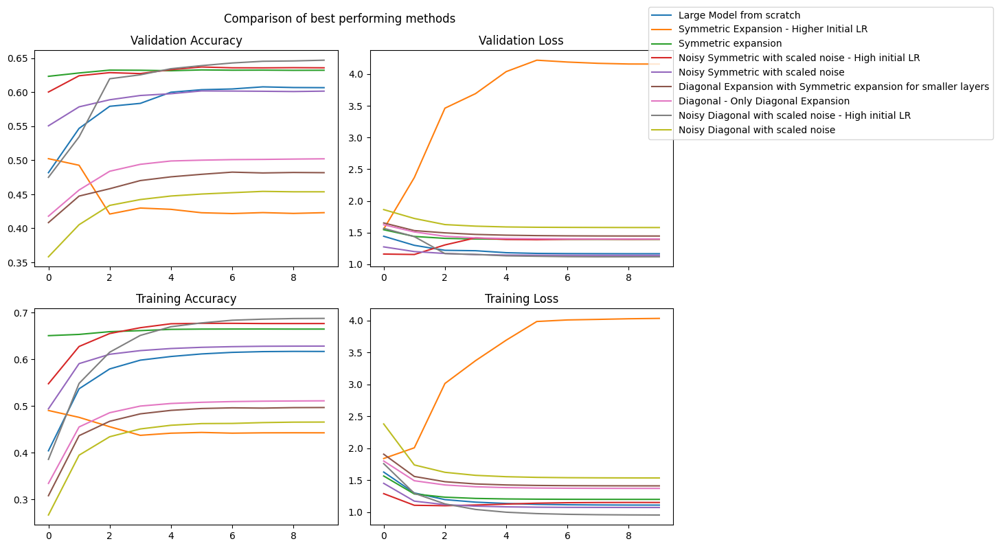

In [103]:
fig, ax = plt.subplots(2,2,figsize=(10,8))
for i in range(len(metrics)):
    ax = plt.subplot(2,2,i+1)
    for j in range(len(labels)):
        ax.plot(stats[j].hist[metric_keys[i]], label=labels[j])
    ax.set_title(metrics[i])

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(1.2, 1))
plt.suptitle("Comparison of best performing methods")
plt.tight_layout()
plt.show()

## Memory comparison

In [252]:
stats_1 = ModelStats("ModelStats_Mem/large_model_ref")
stats_2 = ModelStats("ModelStats_Mem/large_expand_symmetric")
stats_3 = ModelStats("ModelStats_Mem/large_expand_symmetric_lowerLR")
stats_4 = ModelStats("ModelStats_Mem/large_expand_noisy_symmetric_lowerLR")
stats_5 = ModelStats("ModelStats_Mem/large_expand_noisy_symmetric_highLR_scale_noise")
stats_6 = ModelStats("ModelStats_Mem/large_expand_noisy_symmetric_lowerLR_scale_noise")
stats_7 = ModelStats("ModelStats_Mem/large_expand_diagonal_lowerLR")
stats_8 = ModelStats("ModelStats_Mem/large_expand_diagonal_2_lowerLR")
stats_9 = ModelStats("ModelStats_Mem/large_expand_noisy_diagonal_lowerLR")
stats_10 = ModelStats("ModelStats_Mem/large_expand_noisy_diagonal_highLR_scale_noise")
stats_11 = ModelStats("ModelStats_Mem/large_expand_envelope_highLR")
stats_12 = ModelStats("ModelStats_Mem/large_expand_envelope")
stats_13 = ModelStats("ModelStats_Mem/large_expand_noisy_envelope_highLR")
stats_14 = ModelStats("ModelStats_Mem/large_expand_noisy_envelope")
stats_15 = ModelStats("ModelStats_Mem/large_expand_noisy_envelope_scaled_noise_highLR")
stats_16 = ModelStats("ModelStats_Mem/large_expand_noisy_scaled_noise_envelope")


stats_1.read_stats()
stats_2.read_stats()
stats_3.read_stats()
stats_4.read_stats()
stats_5.read_stats()
stats_6.read_stats()
stats_7.read_stats()
stats_8.read_stats()
stats_9.read_stats()
stats_10.read_stats()
stats_11.read_stats()
stats_12.read_stats()
stats_13.read_stats()
stats_14.read_stats()
stats_15.read_stats()
stats_16.read_stats()

In [253]:
stats = [stats_1, stats_2, stats_3, stats_4, stats_5, stats_6, stats_7, stats_8, stats_9, stats_10, stats_11, stats_12, stats_13, stats_14, stats_15, stats_16]
labels = ["Large Model from scratch", "Symmetric Expansion - Higher Initial LR", "Symmetric expansion", "Noisy Symmetric","Noisy Symmetric with scaled noise - High initial LR", "Noisy Symmetric with scaled noise", 
          "Diagonal Expansion with Symmetric expansion for smaller layers", "Diagonal - Only Diagonal Expansion", "Noisy Diagonal", "Noisy Diagonal with scaled noise - High initial LR",
          "Envelope expansion - High initial LR", "Envelope expansion", "Noisy Envelope expansion - High Initial LR", "Noisy envelope expansion", "Noisy envelope with scaled noise - High Initial LR", "Noisy envelope with scaled noise" 
         ]
metrics = ["Validation Accuracy", "Validation Loss","Training Accuracy", "Training Loss"]
metric_keys = ["val_accuracy","val_loss","accuracy","loss"]


In [254]:
rows = []
rows_peak = []

In [255]:
for i in range(len(stats)):
    rows.append([labels[i], round(np.mean(stats[i].memCB['used']))])
    rows_peak.append([labels[i], round(np.mean(stats[i].memCB['peak']))])
    # plt.plot(stats[i].memCB['used'], label=labels[i])
# plt.legend()

In [256]:
memDF_used = pd.DataFrame(rows, columns=["Method", "Mean Used memory"])
memDF_peak = pd.DataFrame(rows_peak, columns=["Method", "Mean Peak memory"])

In [257]:
df_1 = memDF_used.sort_values(by="Mean Used memory")
df_2 = memDF_peak.sort_values(by="Mean Peak memory")

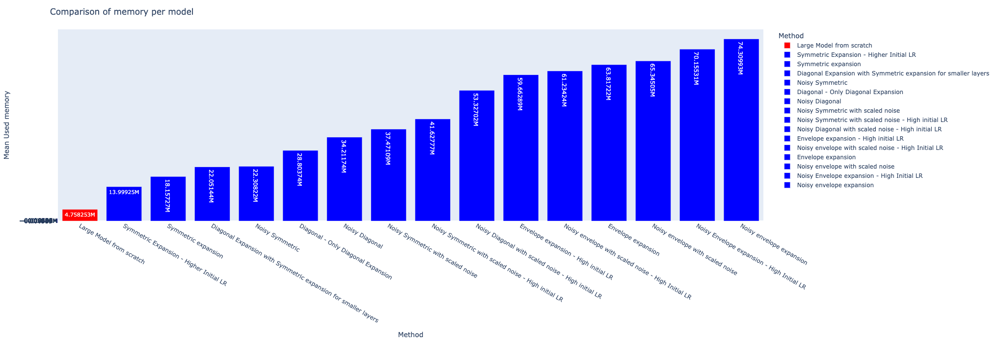

In [258]:
df_1['Mean Used memory'] = pd.to_numeric(df_1['Mean Used memory'])
color_bar = ['red' if x[0] == "Large Model from scratch" else 'blue' for x in df_1.to_numpy()]
fig = px.bar(df_1, x='Method', y='Mean Used memory', color="Method", color_discrete_sequence=color_bar, text_auto=True
            )
fig.update_layout(
    title="Comparison of memory per model",
    height=700,
    width=2000,
    yaxis={"dtick":1}
)
fig.show()

## Experiment - 5
## Net2Net

In [134]:
import tensorflow as tf
from net2net import Net2Net

n2n = Net2Net()

Net2Net module initialize...


In [135]:
model = tf.keras.models.load_model("saved_models/small_model")

In [136]:
model_large_wider = get_large_model()

net2net = Net2Net()

small_layers_ref = [layer.get_weights() for layer in model.layers if len(layer.get_weights())>0]
large_layers_ref = [layer.get_weights() for layer in model_large_wider.layers if len(layer.get_weights())>0]

small_layers = [small_layers_ref[1],small_layers_ref[2]]
large_layers = [large_layers_ref[1],large_layers_ref[2]]

new_weights= []

for i in range(len(large_layers) - 1):
    w1, b1 = small_layers[i]
    w2, _ = small_layers[i+1]
    print(w1.shape)
    print(w2.shape)
    w1,b1,w2 = net2net.wider(w1,b1,w2,large_layers[i][0].shape[-1], verification=False)
    new_weights.append([w1,b1])

small_layers = [small_layers_ref[3],small_layers_ref[4]]
large_layers = [large_layers_ref[3],large_layers_ref[4]]

for i in range(len(large_layers) - 1):
    w1, b1 = small_layers[i]
    w2, _ = small_layers[i+1]
    
    w1,b1,w2 = net2net.wider(w1,b1,w2,large_layers[i][0].shape[-1], verification=False)
    new_weights.append([w1,b1])

Net2Net module initialize...
(3, 3, 32, 64)
(3, 3, 64, 64)


In [139]:
expand_layers = [3, 7]
for i in range(len(expand_layers)):
    print(model_large_wider.layers[expand_layers[i]].get_weights()[0].shape)
    w1 = np.array(new_weights[i][0])
    b1 = np.array(new_weights[i][1])
    
    model_large_wider.layers[expand_layers[i]].weights[0] = w1
    model_large_wider.layers[expand_layers[i]].weights[1] = b1

(3, 3, 32, 128)
(1024, 128)


In [140]:
initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

model_large_wider.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
log_dir = "logs/fit/small_model_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
mem_callback = TrackMemoryCallback()
tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
time_callback = TimeCallback()

model_large_wider.evaluate(val_ds)

 31/313 [=>............................] - ETA: 0s - loss: 2.3031 - accuracy: 0.1008

2025-01-20 18:42:20.313950: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


313/313 [==============================] - 1s 3ms/step - loss: 2.3071 - accuracy: 0.0924


[2.3070790767669678, 0.09239999949932098]

In [141]:
hist = model_large_wider.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, time_callback])

Epoch 1/10
   1/1250 [..............................] - ETA: 6:36 - loss: 2.2930 - accuracy: 0.1875

2025-01-20 18:42:41.308048: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 7s 5ms/step - loss: 1.5391 - accuracy: 0.4380 - val_loss: 1.2702 - val_accuracy: 0.5469
Epoch 2/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.1471 - accuracy: 0.5933 - val_loss: 1.1104 - val_accuracy: 0.6143
Epoch 3/10
1250/1250 [==============================] - 7s 6ms/step - loss: 1.0185 - accuracy: 0.6423 - val_loss: 1.0407 - val_accuracy: 0.6408
Epoch 4/10
1250/1250 [==============================] - 7s 5ms/step - loss: 0.9571 - accuracy: 0.6665 - val_loss: 1.0102 - val_accuracy: 0.6517
Epoch 5/10
1250/1250 [==============================] - 7s 5ms/step - loss: 0.9263 - accuracy: 0.6779 - val_loss: 0.9989 - val_accuracy: 0.6527
Epoch 6/10
1250/1250 [==============================] - 7s 5ms/step - loss: 0.9103 - accuracy: 0.6843 - val_loss: 0.9863 - val_accuracy: 0.6576
Epoch 7/10
1250/1250 [==============================] - 6s 5ms/step - loss: 0.9023 - accuracy: 0.6867 - val_loss: 0.9795 - val_accuracy: 0.6631
Epo

In [144]:
net2netwider = ModelStats("net2net_wider", hist, time_callback, mem_callback)
net2netwider.save_stats()

### With noise

In [145]:
model = tf.keras.models.load_model("saved_models/small_model")

In [146]:
model_large_wider = get_large_model()

net2net = Net2Net()

small_layers_ref = [layer.get_weights() for layer in model.layers if len(layer.get_weights())>0]
large_layers_ref = [layer.get_weights() for layer in model_large_wider.layers if len(layer.get_weights())>0]

small_layers = [small_layers_ref[1],small_layers_ref[2]]
large_layers = [large_layers_ref[1],large_layers_ref[2]]

new_weights= []

for i in range(len(large_layers) - 1):
    w1, b1 = small_layers[i]
    w2, _ = small_layers[i+1]
    print(w1.shape)
    print(w2.shape)
    w1,b1,w2 = net2net.wider(w1,b1,w2,large_layers[i][0].shape[-1], verification=False)
    new_weights.append([w1,b1])

small_layers = [small_layers_ref[3],small_layers_ref[4]]
large_layers = [large_layers_ref[3],large_layers_ref[4]]

for i in range(len(large_layers) - 1):
    w1, b1 = small_layers[i]
    w2, _ = small_layers[i+1]
    
    w1,b1,w2 = net2net.wider_rand(w1,b1,w2,large_layers[i][0].shape[-1])
    new_weights.append([w1,b1])

Net2Net module initialize...
(3, 3, 32, 64)
(3, 3, 64, 64)


In [149]:
expand_layers = [3, 7]
for i in range(len(expand_layers)):
    print(model_large_wider.layers[expand_layers[i]].get_weights()[0].shape)
    w1 = np.array(new_weights[i][0])
    b1 = np.array(new_weights[i][1])
    
    model_large_wider.layers[expand_layers[i]].weights[0] = w1
    model_large_wider.layers[expand_layers[i]].weights[1] = b1

(3, 3, 32, 128)
(1024, 128)


In [150]:
initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=num_batches,
    decay_rate=0.5,
    staircase=True)

model_large_wider.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
log_dir = "logs/fit/small_model_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
mem_callback = TrackMemoryCallback()
tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
time_callback = TimeCallback()

model_large_wider.evaluate(val_ds)

 48/313 [===>..........................] - ETA: 0s - loss: 2.3058 - accuracy: 0.1224

2025-01-20 18:44:30.513819: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


313/313 [==============================] - 1s 3ms/step - loss: 2.3099 - accuracy: 0.1146


[2.3099355697631836, 0.11460000276565552]

In [151]:
hist = model_large_wider.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[mem_callback, time_callback])

Epoch 1/10
  10/1250 [..............................] - ETA: 7s - loss: 2.3082 - accuracy: 0.0969  

2025-01-20 18:44:40.364170: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1250/1250 [==============================] - 7s 5ms/step - loss: 1.5526 - accuracy: 0.4328 - val_loss: 1.2653 - val_accuracy: 0.5444
Epoch 2/10
1250/1250 [==============================] - 6s 5ms/step - loss: 1.1602 - accuracy: 0.5872 - val_loss: 1.1388 - val_accuracy: 0.5994
Epoch 3/10
1250/1250 [==============================] - 7s 5ms/step - loss: 1.0290 - accuracy: 0.6386 - val_loss: 1.0558 - val_accuracy: 0.6279
Epoch 4/10
1250/1250 [==============================] - 7s 5ms/step - loss: 0.9643 - accuracy: 0.6637 - val_loss: 1.0175 - val_accuracy: 0.6394
Epoch 5/10
1250/1250 [==============================] - 7s 5ms/step - loss: 0.9310 - accuracy: 0.6749 - val_loss: 0.9956 - val_accuracy: 0.6507
Epoch 6/10
1250/1250 [==============================] - 6s 5ms/step - loss: 0.9137 - accuracy: 0.6810 - val_loss: 0.9874 - val_accuracy: 0.6542
Epoch 7/10
1250/1250 [==============================] - 6s 5ms/step - loss: 0.9049 - accuracy: 0.6846 - val_loss: 0.9810 - val_accuracy: 0.6562
Epo

In [152]:
net2netwider = ModelStats("net2net_wider_noise", hist, time_callback, mem_callback)
net2netwider.save_stats()

## Analysis

### Validation accuracy

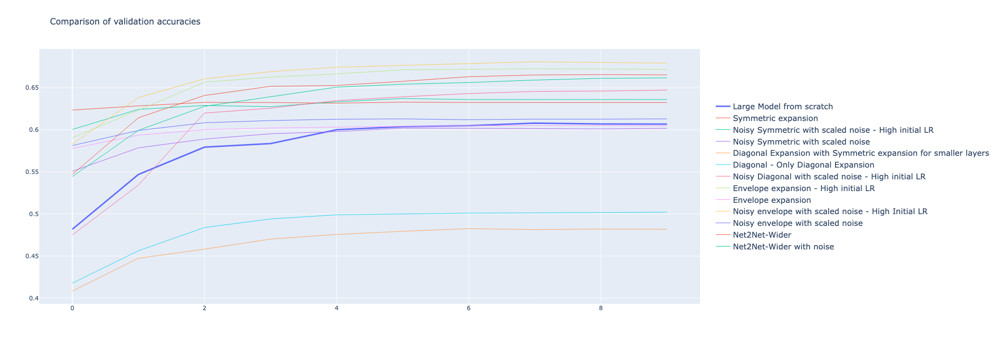

In [127]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[0]])))
    y = stats[j].hist[metric_keys[0]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16), height=700,width=1500,title="Comparison of validation accuracies")
fig.show()

### Validation loss

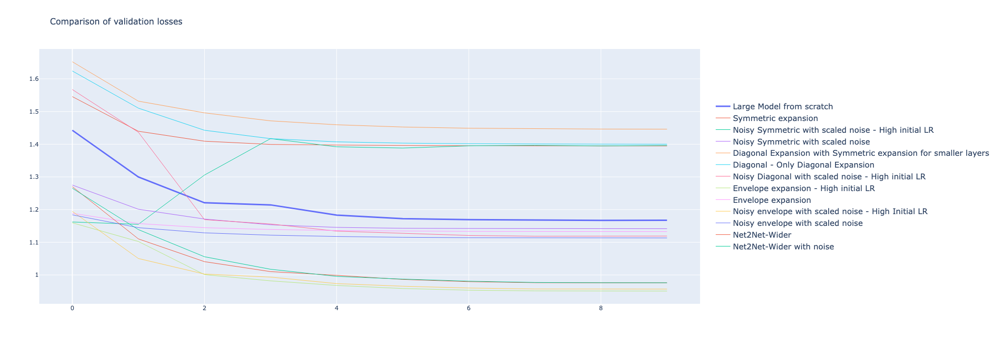

In [128]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[1]])))
    y = stats[j].hist[metric_keys[1]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16),height=700,width=1500, title="Comparison of validation losses")
fig.show()

### Training accuracy

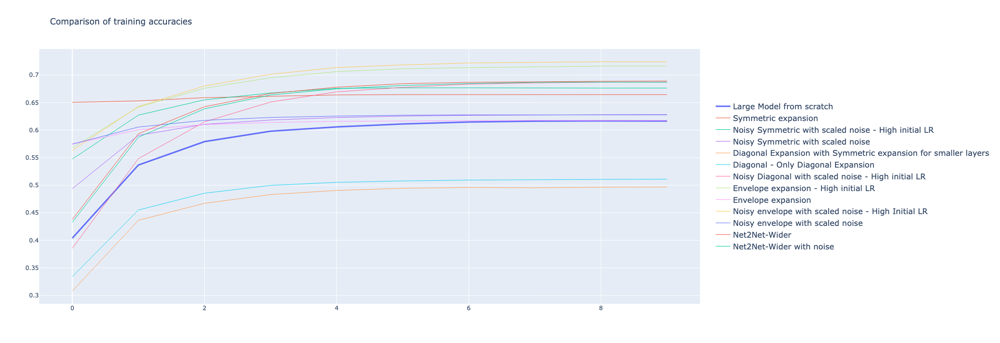

In [129]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[2]])))
    y = stats[j].hist[metric_keys[2]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16), height=700,width=1500, title="Comparison of training accuracies")
fig.show()

### Training loss

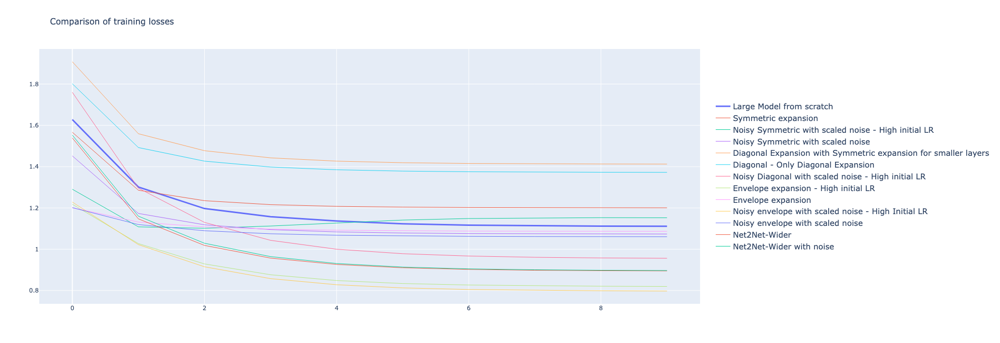

In [130]:
fig = go.Figure()
for j in range(len(labels)):
    if labels[j] == "Large Model from scratch":
        width = 3
    else:
        width = 1
    x = list(range(len(stats[j].hist[metric_keys[3]])))
    y = stats[j].hist[metric_keys[3]]
    fig.add_trace(go.Scatter(x=x, y=y, name=labels[j], mode='lines+text', line={'width':width}))
fig.update_layout(legend=dict(y=0.5, font_size=16), height=700,width=1500,title="Comparison of training losses")
fig.show()

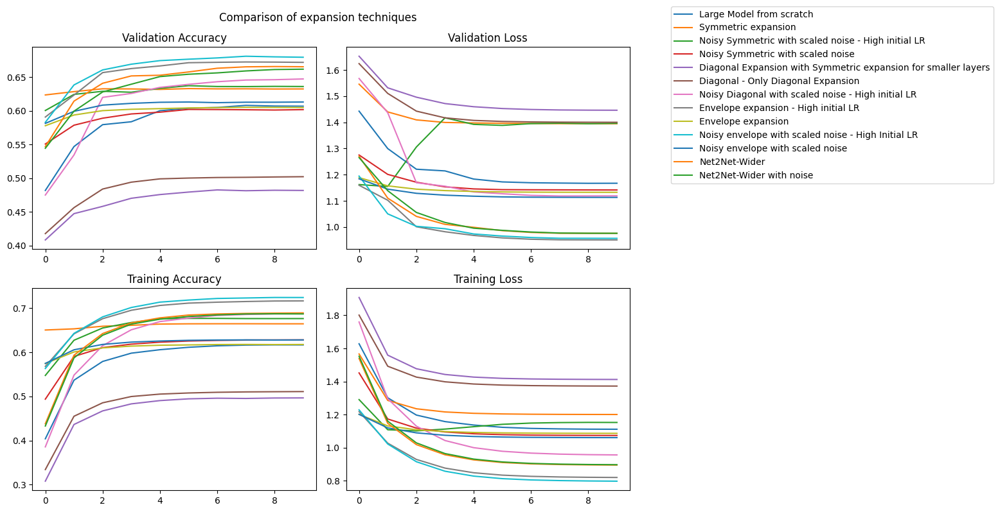

In [131]:
fig, ax = plt.subplots(2,2,figsize=(10,8))
for i in range(len(metrics)):
    ax = plt.subplot(2,2,i+1)
    for j in range(len(labels)):
        ax.plot(stats[j].hist[metric_keys[i]], label=labels[j])
    ax.set_title(metrics[i])
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(1.3, 1))
plt.suptitle("Comparison of expansion techniques")
plt.tight_layout()
plt.show()

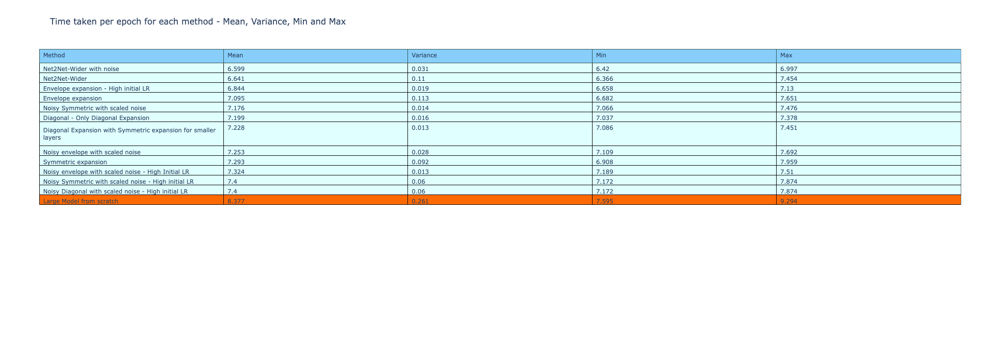

In [132]:
formatted_time = []
for i in range(len(labels)):
    time_i = stats[i].timeCB['time_taken']
    temp = []
    for j in range(1,len(time_i)):
        temp.append(time_i[j] - time_i[j-1])
    formatted_time.append(temp)

rows = []

for i in range(len(labels)):
    temp = []
    temp.append(labels[i])
    temp.append(str(round(np.mean(formatted_time[i]),3)))
    temp.append(str(round(np.var(formatted_time[i]),3)))
    temp.append(str(round(np.min(formatted_time[i]),3)))
    temp.append(str(round(np.max(formatted_time[i]),3)))
    rows.append(temp)

time_taken = pd.DataFrame(rows, columns=["Method","Mean","Variance", "Min", "Max"])

time_taken_sorted = time_taken.sort_values(by="Mean",ascending=True)

colors = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in time_taken_sorted.to_numpy()]

fig = go.Figure(data=[go.Table(
    header=dict(values=time_taken.columns,
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue',
               ),
    cells=dict(values=[time_taken_sorted["Method"],
                       time_taken_sorted["Mean"],
                       time_taken_sorted["Variance"],
                       time_taken_sorted["Min"],
                       time_taken_sorted["Max"]],
               align='left',
               fill_color=[colors],
               line_color='black'
              ),
)
])

fig.update_layout(
    height=700,
    width=1600,
    title="Time taken per epoch for each method - Mean, Variance, Min and Max"
)

fig.show()


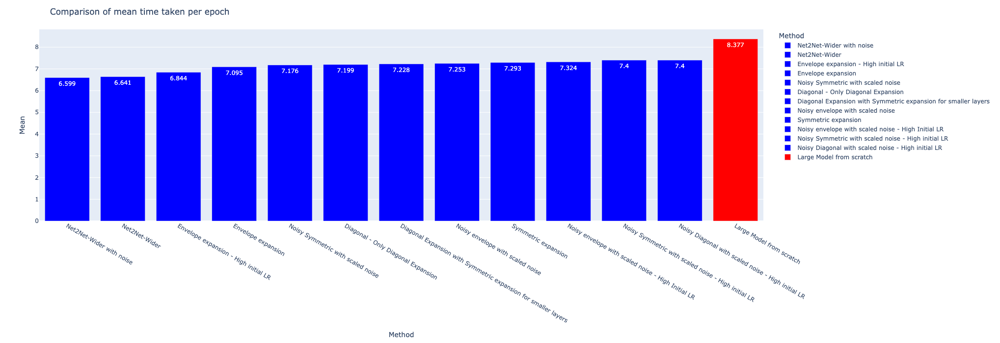

In [133]:
time_taken_sorted['Mean'] = pd.to_numeric(time_taken_sorted['Mean'])
color_bar = ['red' if x[0] == "Large Model from scratch" else 'blue' for x in time_taken_sorted.to_numpy()]
fig = px.bar(time_taken_sorted, x='Method', y='Mean', color="Method", color_discrete_sequence=color_bar, text_auto=True
            )
fig.update_layout(
    title="Comparison of mean time taken per epoch",
    height=700,
    width=1500,
)
fig.show()

In [134]:
table_rows = []
table_header = ["Method"]
table_header.extend(metrics)
table_header.append("Validation Accuracy after first epoch")

for i in range(len(labels)):
    temp = []
    temp.append(labels[i])
    for j in range(len(metrics)):
        temp.append(round(stats[i].hist[metric_keys[j]][-1],3))
    temp.append(round(stats[i].hist["val_accuracy"][0],3))
    table_rows.append(temp)


In [135]:
df = pd.DataFrame(table_rows, columns=table_header)
df_1 = df.sort_values(by="Validation Accuracy", ascending=False)
df_2 = df.sort_values(by="Validation Loss", ascending=True)
df_3 = df.sort_values(by="Validation Accuracy after first epoch", ascending=False)

In [136]:
colors_1 = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in df_1.to_numpy()]
colors_2 = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in df_2.to_numpy()]
colors_3 = ['#FF6A00' if x[0] == "Large Model from scratch" else 'lightcyan' for x in df_3.to_numpy()]

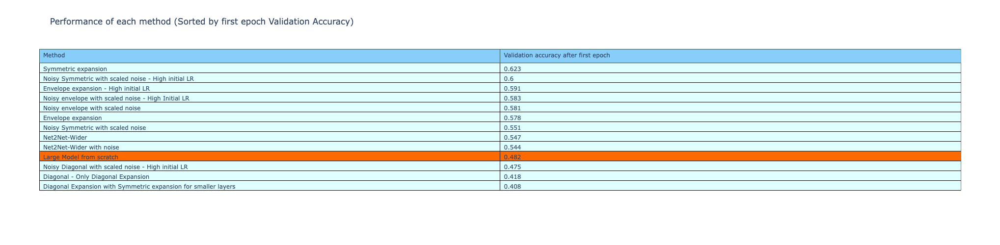

In [137]:
fig = go.Figure(data=[go.Table(
    header=dict(values=["Method","Validation accuracy after first epoch"],
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue'),
    cells=dict(values=[df_3["Method"],
                       df_3["Validation Accuracy after first epoch"]],
               align='left',
               fill_color=[colors_3],
               line_color='black'
              ),
)
])

fig.update_layout(
    height=500,
    width=1000,
    title="Performance of each method (Sorted by first epoch Validation Accuracy)"
)

fig.show()

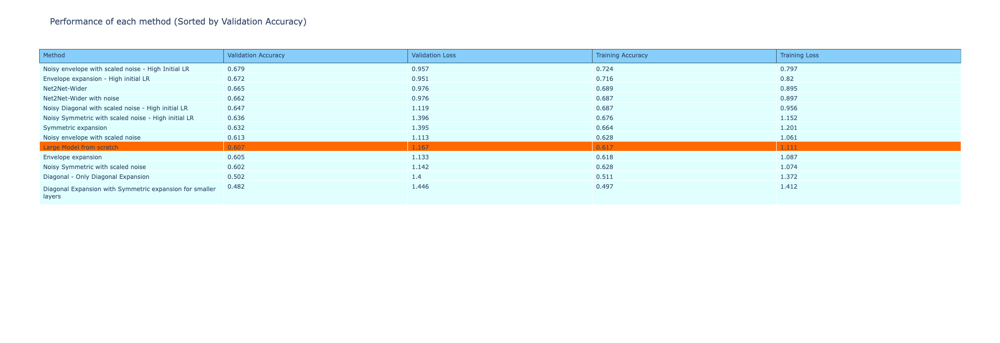

In [138]:
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_1.columns[:-1]),
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue'),
    cells=dict(values=[df_1["Method"], df_1["Validation Accuracy"], df_1["Validation Loss"], df_1["Training Accuracy"], df_1["Training Loss"]],
               align='left',
               line_color='white',
               fill_color=[colors_1]
              
              ))
])

fig.update_layout(
    height=700,
    width=1500,
    title="Performance of each method (Sorted by Validation Accuracy)"
)

fig.show()

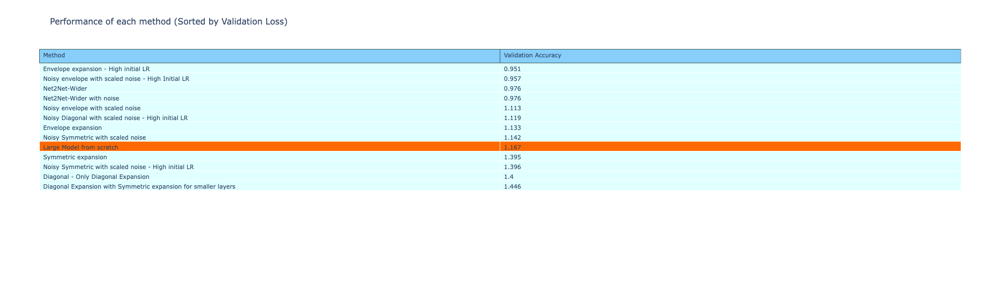

In [139]:
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_1.columns[:2]),
                align='left',
                line_color='darkslategray',
                fill_color='lightskyblue'),
    cells=dict(values=[df_2["Method"], df_2["Validation Loss"]],
               align='left',
               line_color='white',
               fill_color=[colors_2]
              
              ))
])

fig.update_layout(
    height=600,
    width=800,
    title="Performance of each method (Sorted by Validation Loss)"
)

fig.show()

In [128]:
stats_1 = ModelStats("large_model_ref_30_epochs_")
stats_1.read_stats()

stats_2 = ModelStats("large_model_ref_30_epochs_further_lowerLR_")
stats_2.read_stats()

stats_3 = ModelStats("large_model_ref_30_epochs_further_lowerLR_2_")
stats_3.read_stats()

In [129]:
metrics = ["Validation Accuracy", "Validation Loss","Training Accuracy", "Training Loss"]
metric_keys = ["val_accuracy","val_loss","accuracy","loss"]

In [130]:
for i in metric_keys:
    stats_1.hist[i].extend(stats_2.hist[i]) 
    stats_1.hist[i].extend(stats_3.hist[i]) 

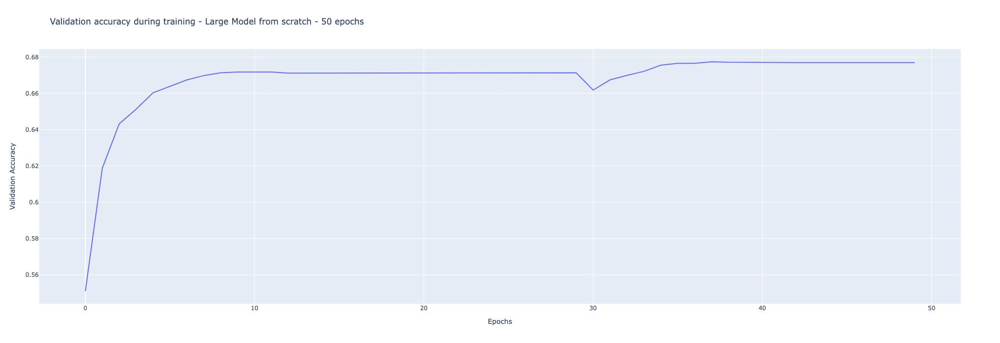

In [143]:
fig = go.Figure()
x = list(range(len(stats_1.hist['val_accuracy'])))
y = stats_1.hist['val_accuracy']
fig.add_trace(go.Scatter(x=x, y=y, name="Training for 50 epochs", mode='lines+text'))
fig.update_layout(legend=dict(y=0.5, font_size=16), height=700,width=1500, title="Validation accuracy during training - Large Model from scratch - 50 epochs", 
                  yaxis=dict(
                      title="Validation Accuracy"
                  ),
                  xaxis=dict(title="Epochs")
                 )
fig.show()

## CKA Analysis

In [78]:
small_model = tf.keras.models.load_model("saved_models/small_model")

In [109]:
def get_activations(model, layer_idx, image_inp):
    temp_model = tf.keras.Model(inputs=model.input, outputs=model.layers[layer_idx].output)
    activations = temp_model(image_inp)
    return activations[0].numpy()

In [110]:
expand_model_2.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_13 (Rescaling)    (None, 32, 32, 3)         0         
                                                                 
 conv2d_39 (Conv2D)          (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d_26 (MaxPooli  (None, 15, 15, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_40 (Conv2D)          (None, 13, 13, 128)       36992     
                                                                 
 max_pooling2d_27 (MaxPooli  (None, 6, 6, 128)         0         
 ng2D)                                                           
                                                                 
 conv2d_41 (Conv2D)          (None, 4, 4, 64)        

In [111]:
small_model.summary()

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_23 (Rescaling)    (None, 32, 32, 3)         0         
                                                                 
 conv2d_69 (Conv2D)          (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d_46 (MaxPooli  (None, 15, 15, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_70 (Conv2D)          (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_47 (MaxPooli  (None, 6, 6, 64)          0         
 ng2D)                                                           
                                                                 
 conv2d_71 (Conv2D)          (None, 4, 4, 64)        

In [112]:
imgs = []
ct = 0
for x,y in train_ds:
    imgs.append(x)
    ct+=1
    if ct == 10:
        break

In [113]:
activations_small = []
activations_env = []
for i in imgs:
    activations_small.append(get_activations(expand_model_2,3,i))
    activations_env.append(get_activations(expand_model_2,3,i))

In [114]:
def compute_HSIC(x,y):
    x = np.asarray(x)
    y = np.asarray(y)
    print(x.shape)
    print(y.shape)
    kij = np.matmul(x, x.T)
    lij = np.matmul(y, y.T)
    H = np.eye(kij.shape[0]) - ( np.ones((kij.shape[0], kij.shape[0])) ) / kij.shape[0]
    HSIC = (1/(kij.shape[0]-1)**2) * np.matmul(kij, np.matmul(hij,np.matmul(lij,hij)))

def compute_CKA(x,y):
    CKA = compute_HSIC(x,y) / np.sqrt(compute_HSIC(x,x) * compute_HSIC(y,y))
    return CKA

In [115]:
compute_CKA(activations_small[0], activations_env[0])

(13, 13, 128)
(13, 13, 128)


ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 13 is different from 128)

In [94]:
Ki,j = k(xi, xj ) and Li,j = l(yi, yj ) where k, l are kernels and for H = I − 1
n 11> the centering
matrix, HSIC can be written as: HSIC(K, L) = 1
(n−1)2 tr(KHLH). CKA can then be computed as:
CKA(K, L) = HSIC(K, L)
√HSIC(K, K)HSIC(L, L) 

SyntaxError: invalid syntax (3503908717.py, line 1)

In [100]:
for i in range(len(activations_small)):
    print(activations_small[i].shape)
    print(activations_env[i].shape)

(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
(32, 13, 13, 128)
